In [1]:
#!/usr/bin/python

import sys
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

from scipy import stats

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sys.path.append("../tools/")
# from feature_format import featureFormat, targetFeatureSplit
from dos2unix import crlf_to_lf
# from tester import dump_classifier_and_data

In [2]:
### Load original dict for possible reference
data_dict = None
fp = crlf_to_lf(f_in_path='final_project_dataset.pkl')
with open(fp, 'rb') as data_file:
    data_dict = pickle.load(data_file)

final_project_dataset.pkl saved as final_project_dataset_unix.pkl in 6705 bytes.


In [3]:
### Load data set.
data_df = None
with open(file='data_df_cleaned.pkl', mode='rb') as file:
    data_df = pickle.load(file=file)

fin_features = None
pay_features = None
stock_features = None
email_features = None
features_list = None

with open('fin_features.pkl', 'rb') as file:
    fin_features = pickle.load(file=file)
with open('pay_features.pkl', 'rb') as file:
    pay_features = pickle.load(file=file)
with open('stock_features.pkl', 'rb') as file:
    stock_features = pickle.load(file=file)
with open('email_features.pkl', 'rb') as file:
    email_features = pickle.load(file=file)
with open('features_list.pkl', 'rb') as file:
    features_list = pickle.load(file=file)

In [4]:
data_df.head()
data_df.describe()
data_df.dtypes

,poi,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,director_fees,total_payments,exercised_stock_options,restricted_stock,restricted_stock_deferred,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
METTS MARK,0,365788.0,600000.0,NaN,NaN,NaN,1740.0,94299.0,NaN,1061827.0,NaN,585062.0,NaN,585062.0,807.0,38.0,29.0,1.0,702.0
BAXTER JOHN C,0,267102.0,1200000.0,1586055.0,-1386055.0,1295738.0,2660303.0,11200.0,NaN,5634343.0,6680544.0,3942714.0,NaN,10623258.0,NaN,NaN,NaN,NaN,NaN
ELLIOTT STEVEN,0,170941.0,350000.0,NaN,-400729.0,NaN,12961.0,78552.0,NaN,211725.0,4890344.0,1788391.0,NaN,6678735.0,NaN,NaN,NaN,NaN,NaN
CORDES WILLIAM R,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,651850.0,386335.0,NaN,1038185.0,764.0,10.0,12.0,0.0,58.0
HANNON KEVIN P,1,243293.0,1500000.0,1617011.0,-3117011.0,NaN,11350.0,34039.0,NaN,288682.0,5538001.0,853064.0,NaN,6391065.0,1045.0,32.0,32.0,21.0,1035.0


,poi,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,director_fees,total_payments,exercised_stock_options,restricted_stock,restricted_stock_deferred,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
count,123.000000,9.400000e+01,8.100000e+01,6.500000e+01,4.200000e+01,3.600000e+01,8.900000e+01,88.000000,6.000000,1.130000e+02,9.100000e+01,1.050000e+02,1.400000e+01,1.180000e+02,86.000000,86.000000,86.000000,86.000000,86.000000
mean,0.146341,2.840875e+05,1.201773e+06,7.464912e+05,-6.536384e+05,8.898001e+05,4.732125e+05,54712.943182,90419.666667,2.730513e+06,3.331149e+06,1.221104e+06,-4.912939e+05,3.597223e+06,2073.872093,64.895349,608.790698,41.232558,1176.465116
std,0.354894,1.771311e+05,1.441679e+06,8.629174e+05,9.868991e+05,1.308286e+06,1.412407e+06,43216.208920,36061.349291,9.840108e+06,5.870078e+06,2.262022e+06,7.564737e+05,6.772924e+06,2582.695513,86.979244,1841.033949,100.073111,1178.317641
min,0.000000,4.770000e+02,7.000000e+04,6.922300e+04,-3.504386e+06,7.961000e+03,2.000000e+00,475.000000,17500.000000,0.000000e+00,1.737800e+04,3.246000e+04,-2.604490e+06,0.000000e+00,57.000000,0.000000,12.000000,0.000000,2.000000
25%,0.000000,2.118020e+05,4.250000e+05,2.750000e+05,-7.129655e+05,9.154625e+04,1.191000e+03,23623.500000,99711.000000,6.188500e+05,6.224980e+05,2.599070e+05,-3.896218e+05,5.566228e+05,541.250000,10.000000,22.750000,1.000000,249.750000
50%,0.000000,2.587410e+05,7.500000e+05,4.221580e+05,-2.183205e+05,2.439520e+05,2.555300e+04,47653.500000,102496.000000,1.204583e+06,1.426469e+06,4.623840e+05,-2.237825e+05,1.143218e+06,1211.000000,35.000000,41.000000,8.000000,740.500000
75%,0.000000,3.086065e+05,1.200000e+06,8.318090e+05,-4.369800e+04,9.389892e+05,3.560710e+05,79252.250000,107187.500000,2.101364e+06,2.865306e+06,1.034346e+06,-8.572550e+04,3.092011e+06,2634.750000,72.250000,145.500000,24.750000,1888.250000
max,1.000000,1.111258e+06,8.000000e+06,5.145434e+06,-8.330000e+02,6.426990e+06,1.035973e+07,228763.000000,112492.000000,1.035598e+08,3.434838e+07,1.476169e+07,-3.246000e+04,4.911008e+07,15149.000000,528.000000,14368.000000,609.000000,5521.000000


poi                            int32
salary                       float64
bonus                        float64
long_term_incentive          float64
deferred_income              float64
deferral_payments            float64
other                        float64
expenses                     float64
director_fees                float64
total_payments               float64
exercised_stock_options      float64
restricted_stock             float64
restricted_stock_deferred    float64
total_stock_value            float64
to_messages                  float64
from_poi_to_this_person      float64
from_messages                float64
from_this_person_to_poi      float64
shared_receipt_with_poi      float64
dtype: object

## Handle outliers and NaNs

### EDA

EDA leads to new feature ideas and better understanding of how to handle outliers/NaNs.

For each feature, plot with and without outliers side by side, and display records of outliers. Choose whether to remove outliers, top/bottom code, impute with mean, etc. Choose also whether to impute NaNs with 0, mode, remove them, etc.

In [5]:
### Split sets now before handling outliers and missing values, and before
### feature engineering selection and scaling, so as not to invalidate my
### results by leaking information from the test set into the training set.
X_train, X_test, y_train, y_test = \
    train_test_split(data_df.drop(columns='poi'), data_df['poi'],
                     test_size=.3, random_state=42)
type(X_train)
X_train.info()
type(y_train)
y_train.sum()
print("Number of POIs:", len(X_train[y_train == 1].index))

pandas.core.frame.DataFrame

<class 'pandas.core.frame.DataFrame'>
Index: 86 entries, ECHOLS JOHN B to MURRAY JULIA H
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   salary                     63 non-null     float64
 1   bonus                      54 non-null     float64
 2   long_term_incentive        40 non-null     float64
 3   deferred_income            24 non-null     float64
 4   deferral_payments          24 non-null     float64
 5   other                      60 non-null     float64
 6   expenses                   64 non-null     float64
 7   director_fees              3 non-null      float64
 8   total_payments             76 non-null     float64
 9   exercised_stock_options    64 non-null     float64
 10  restricted_stock           73 non-null     float64
 11  restricted_stock_deferred  8 non-null      float64
 12  total_stock_value          82 non-null     float64
 13  to_messages                60 non

pandas.core.series.Series

12

Number of POIs: 12


In [6]:
### Drop director_fees since there are so few in the training set.
fin_features.remove('director_fees')
pay_features.remove('director_fees')
features_list.remove('director_fees')
X_train.drop(columns='director_fees', inplace=True)
X_test.drop(columns='director_fees', inplace=True)

### Univariate
For each feature, plot with and without outliers side by side, and display records of outliers.

Considering nature of feature, choose whether to remove outliers, top/bottom code, impute with mean, etc.

Considering distribution of feature, choose whether to impute NaNs with 0, mode, remove them, etc.

In [7]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86 entries, ECHOLS JOHN B to MURRAY JULIA H
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   salary                     63 non-null     float64
 1   bonus                      54 non-null     float64
 2   long_term_incentive        40 non-null     float64
 3   deferred_income            24 non-null     float64
 4   deferral_payments          24 non-null     float64
 5   other                      60 non-null     float64
 6   expenses                   64 non-null     float64
 7   total_payments             76 non-null     float64
 8   exercised_stock_options    64 non-null     float64
 9   restricted_stock           73 non-null     float64
 10  restricted_stock_deferred  8 non-null      float64
 11  total_stock_value          82 non-null     float64
 12  to_messages                60 non-null     float64
 13  from_poi_to_this_person    60 non

In [8]:
### For each feature, plot with and without outliers side by side,
### and display records of outliers.

from scipy import stats

def hist_col(data, x, bins=None):
    n, bins, patches = plt.hist(x=x, data=data, bins=bins)
    plt.xlabel(x)
    plt.title(x)
    plt.grid(True)
    plt.show()
    print('Average bin size:', (bins[len(bins) - 1] - bins[0]) / len(bins))
    return

def scat_box(feat, labels, jitter=True, alpha=.4, out_lines=None):
    '''out_lines is a list with 2 y coords for horizontal lines'''
    box = sns.boxplot(x=labels, y=feat, notch=True)
    for patch in box.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, alpha))
    strip = sns.stripplot(x=labels, y=feat, jitter=jitter,
                          alpha=alpha)
    text = 'count=' + str(feat.count())
    plt.text(0.5, feat.max(), text)
    if out_lines:
        plt.axhline(y=out_lines[0])
        plt.axhline(y=out_lines[1])
    plt.axhline(y=feat.median())
    plt.axhline(y=feat.mean(), color='brown')
#     plt.axhline(y=feat.mode(), color='green')
    plt.show()
    return

def uni_all(data, labels, bins=None, out_lines=True):
    '''out_lines indicates whether to draw the overall outlier lines
    on the jitter box'''
    for col in data:
        ### Hist
        hist_col(data=data, x=col, bins=bins)
        print(data[col].describe())
        
        ### Hist without outliers, simple IQR based
        median = data[col].median()
        out = 2*stats.iqr(x=data[col], nan_policy='omit')
        clean_data = data.loc[abs(data[col] - median) < out]

        hist_col(data=clean_data, x=col, bins=bins)
        print(clean_data[col].describe())
        
        ### Jitter box
        if out_lines:
            out_lines = [median-out, median+out]
        else:
            out_lines = None
        scat_box(feat=data[col], labels=labels,
                 out_lines=out_lines)
        
        ### Display outlier records
        print(data[~data[col].isna()].drop(index=clean_data.index))
        
    return

def scat_box_all(feats, labels, jitter=True, alpha=.4):
    for feat in feats:
        scat_box(feat=feats[feat], labels=labels, jitter=jitter, alpha=alpha)
    return

#### All features

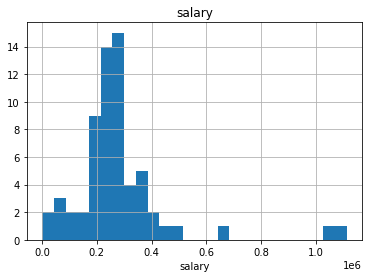

Average bin size: 41140.03703703704
count    6.300000e+01
mean     2.794847e+05
std      1.822704e+05
min      4.770000e+02
25%      2.105960e+05
50%      2.516540e+05
75%      2.965885e+05
max      1.111258e+06
Name: salary, dtype: float64


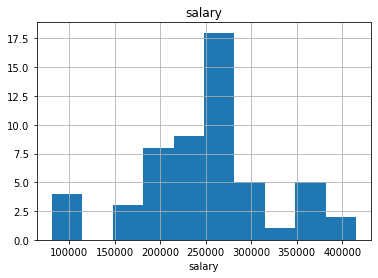

Average bin size: 30397.363636363636
count        55.000000
mean     249922.890909
std       73954.608211
min       80818.000000
25%      212345.500000
50%      250100.000000
75%      278601.000000
max      415189.000000
Name: salary, dtype: float64


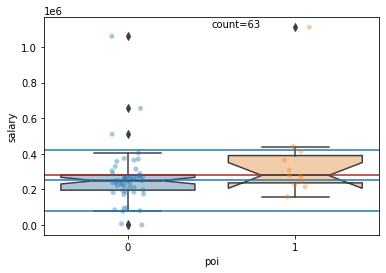

                       salary      bonus  long_term_incentive  \
WHALLEY LAWRENCE G   510364.0  3000000.0             808346.0   
PICKERING MARK R     655037.0   300000.0                  NaN   
GRAY RODNEY            6615.0        NaN             365625.0   
REYNOLDS LAWRENCE     76399.0   100000.0             156250.0   
BANNANTINE JAMES M      477.0        NaN                  NaN   
FREVERT MARK A      1060932.0  2000000.0            1617011.0   
FASTOW ANDREW S      440698.0  1300000.0            1736055.0   
SKILLING JEFFREY K  1111258.0  5600000.0            1920000.0   

                    deferred_income  deferral_payments      other  expenses  \
WHALLEY LAWRENCE G              NaN                NaN   301026.0   57838.0   
PICKERING MARK R                NaN                NaN        NaN   31653.0   
GRAY RODNEY                     NaN            93585.0   680833.0       NaN   
REYNOLDS LAWRENCE         -200000.0            51365.0   202052.0    8409.0   
BANNANTINE JAMES M 

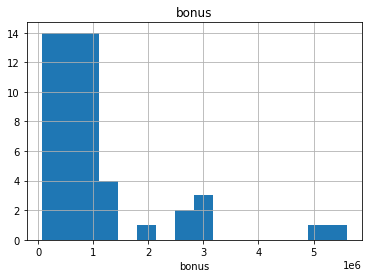

Average bin size: 325294.1176470588
count    5.400000e+01
mean     1.068400e+06
std      1.126076e+06
min      7.000000e+04
25%      4.062500e+05
50%      7.500000e+05
75%      1.075000e+06
max      5.600000e+06
Name: bonus, dtype: float64


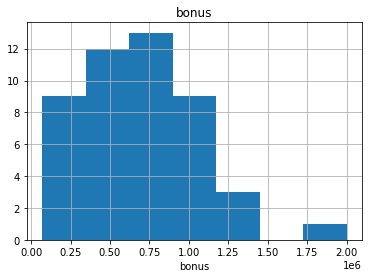

Average bin size: 241250.0
count    4.700000e+01
mean     6.945451e+05
std      3.796853e+05
min      7.000000e+04
25%      4.000000e+05
50%      7.000000e+05
75%      9.500000e+05
max      2.000000e+06
Name: bonus, dtype: float64


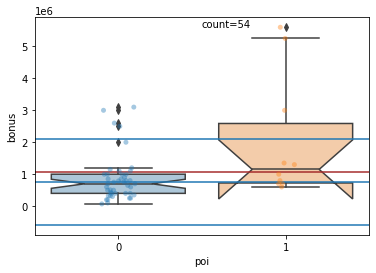

                       salary      bonus  long_term_incentive  \
BELDEN TIMOTHY N     213999.0  5249999.0                  NaN   
WHALLEY LAWRENCE G   510364.0  3000000.0             808346.0   
MCMAHON JEFFREY      370448.0  2600000.0             694862.0   
FALLON JAMES B       304588.0  2500000.0             374347.0   
DELAINEY DAVID W     365163.0  3000000.0            1294981.0   
KITCHEN LOUISE       271442.0  3100000.0                  NaN   
SKILLING JEFFREY K  1111258.0  5600000.0            1920000.0   

                    deferred_income  deferral_payments     other  expenses  \
BELDEN TIMOTHY N         -2334434.0          2144013.0  210698.0   17355.0   
WHALLEY LAWRENCE G              NaN                NaN  301026.0   57838.0   
MCMAHON JEFFREY                 NaN                NaN  297353.0  137108.0   
FALLON JAMES B                  NaN                NaN  401481.0   95924.0   
DELAINEY DAVID W                NaN                NaN    1661.0   86174.0   
KITCHEN LOU

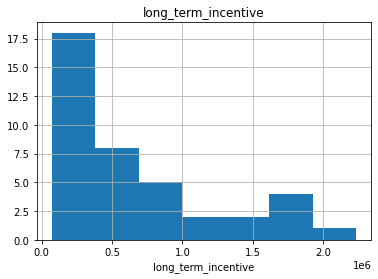

Average bin size: 270468.875
count    4.000000e+01
mean     6.777835e+05
std      5.791846e+05
min      7.102300e+04
25%      3.000000e+05
50%      4.420350e+05
75%      9.765562e+05
max      2.234774e+06
Name: long_term_incentive, dtype: float64


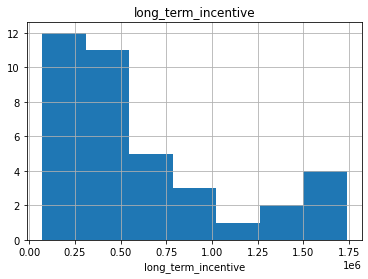

Average bin size: 208129.0
count    3.800000e+01
mean     6.041202e+05
std      4.907032e+05
min      7.102300e+04
25%      3.000000e+05
50%      4.189075e+05
75%      7.799750e+05
max      1.736055e+06
Name: long_term_incentive, dtype: float64


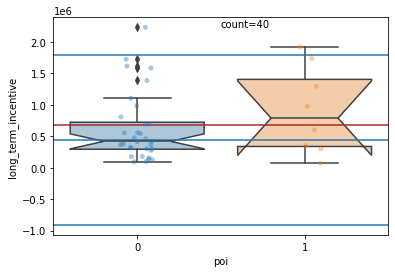

                       salary      bonus  long_term_incentive  \
ECHOLS JOHN B        182245.0   200000.0            2234774.0   
SKILLING JEFFREY K  1111258.0  5600000.0            1920000.0   

                    deferred_income  deferral_payments    other  expenses  \
ECHOLS JOHN B                   NaN                NaN  53775.0   21530.0   
SKILLING JEFFREY K              NaN                NaN  22122.0   29336.0   

                    total_payments  exercised_stock_options  restricted_stock  \
ECHOLS JOHN B            2692324.0                 601438.0          407503.0   
SKILLING JEFFREY K       8682716.0               19250000.0         6843672.0   

                    restricted_stock_deferred  total_stock_value  to_messages  \
ECHOLS JOHN B                             NaN          1008941.0          NaN   
SKILLING JEFFREY K                        NaN         26093672.0       3627.0   

                    from_poi_to_this_person  from_messages  \
ECHOLS JOHN B         

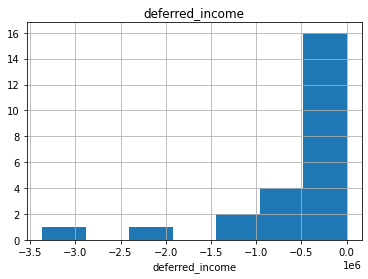

Average bin size: 420772.25
count    2.400000e+01
mean    -5.511695e+05
std      8.338998e+05
min     -3.367011e+06
25%     -7.330602e+05
50%     -2.008205e+05
75%     -3.927075e+04
max     -8.330000e+02
Name: deferred_income, dtype: float64


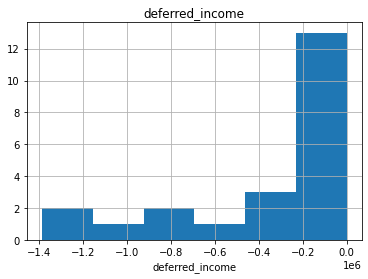

Average bin size: 197888.85714285713
count    2.200000e+01
mean    -3.421192e+05
std      4.322425e+05
min     -1.386055e+06
25%     -4.645420e+05
50%     -1.625000e+05
75%     -3.531225e+04
max     -8.330000e+02
Name: deferred_income, dtype: float64


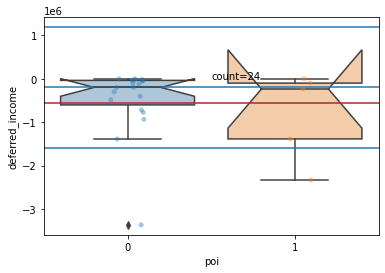

                     salary      bonus  long_term_incentive  deferred_income  \
BELDEN TIMOTHY N   213999.0  5249999.0                  NaN       -2334434.0   
FREVERT MARK A    1060932.0  2000000.0            1617011.0       -3367011.0   

                  deferral_payments      other  expenses  total_payments  \
BELDEN TIMOTHY N          2144013.0   210698.0   17355.0       5501630.0   
FREVERT MARK A            6426990.0  7427621.0   86987.0      17252530.0   

                  exercised_stock_options  restricted_stock  \
BELDEN TIMOTHY N                 953136.0          157569.0   
FREVERT MARK A                 10433518.0         4188667.0   

                  restricted_stock_deferred  total_stock_value  to_messages  \
BELDEN TIMOTHY N                        NaN          1110705.0       7991.0   
FREVERT MARK A                          NaN         14622185.0       3275.0   

                  from_poi_to_this_person  from_messages  \
BELDEN TIMOTHY N                    228.0 

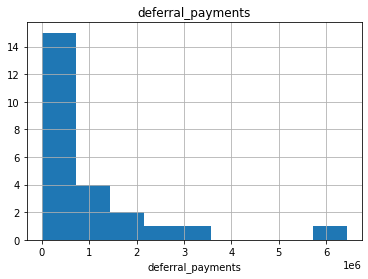

Average bin size: 641902.9
count    2.400000e+01
mean     9.432071e+05
std      1.442653e+06
min      7.961000e+03
25%      8.961775e+04
50%      2.375665e+05
75%      1.171462e+06
max      6.426990e+06
Name: deferral_payments, dtype: float64


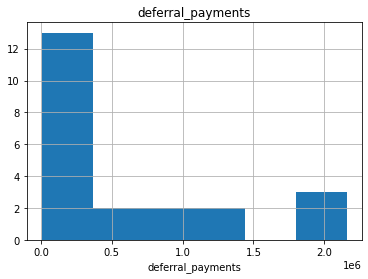

Average bin size: 307080.85714285716
count    2.200000e+01
mean     5.944600e+05
std      7.013893e+05
min      7.961000e+03
25%      8.168325e+04
50%      2.093765e+05
75%      8.672112e+05
max      2.157527e+06
Name: deferral_payments, dtype: float64


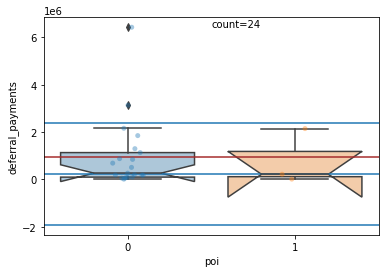

                     salary      bonus  long_term_incentive  deferred_income  \
HORTON STANLEY C        NaN        NaN                  NaN              NaN   
FREVERT MARK A    1060932.0  2000000.0            1617011.0       -3367011.0   

                  deferral_payments      other  expenses  total_payments  \
HORTON STANLEY C          3131860.0        NaN       NaN       3131860.0   
FREVERT MARK A            6426990.0  7427621.0   86987.0      17252530.0   

                  exercised_stock_options  restricted_stock  \
HORTON STANLEY C                5210569.0         2046079.0   
FREVERT MARK A                 10433518.0         4188667.0   

                  restricted_stock_deferred  total_stock_value  to_messages  \
HORTON STANLEY C                        NaN          7256648.0       2350.0   
FREVERT MARK A                          NaN         14622185.0       3275.0   

                  from_poi_to_this_person  from_messages  \
HORTON STANLEY C                     44.0 

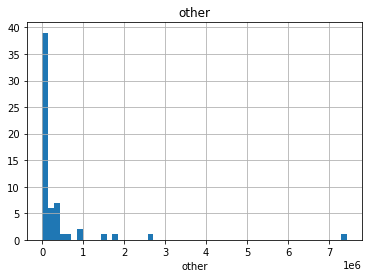

Average bin size: 140143.75471698114
count    6.000000e+01
mean     3.436410e+05
std      1.044314e+06
min      2.000000e+00
25%      9.657500e+02
50%      8.815000e+03
75%      2.824362e+05
max      7.427621e+06
Name: other, dtype: float64


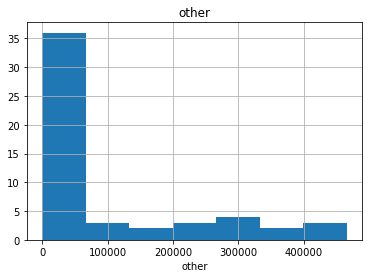

Average bin size: 58169.375
count        53.000000
mean      88575.339623
std      136731.050851
min           2.000000
25%         891.000000
50%        2630.000000
75%      147950.000000
max      465357.000000
Name: other, dtype: float64


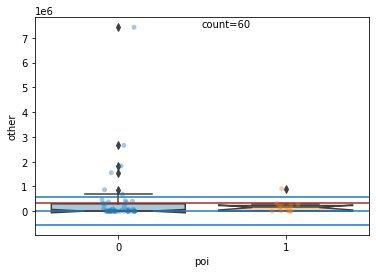

                       salary      bonus  long_term_incentive  \
KOPPER MICHAEL J     224305.0   800000.0             602671.0   
PAI LOU L            261879.0  1000000.0                  NaN   
GRAY RODNEY            6615.0        NaN             365625.0   
BANNANTINE JAMES M      477.0        NaN                  NaN   
IZZO LAWRENCE L       85274.0        NaN             312500.0   
FREVERT MARK A      1060932.0  2000000.0            1617011.0   
BAXTER JOHN C        267102.0  1200000.0            1586055.0   

                    deferred_income  deferral_payments      other  expenses  \
KOPPER MICHAEL J                NaN                NaN   907502.0  118134.0   
PAI LOU L                       NaN                NaN  1829457.0   32047.0   
GRAY RODNEY                     NaN            93585.0   680833.0       NaN   
BANNANTINE JAMES M          -5104.0                NaN   864523.0   56301.0   
IZZO LAWRENCE L                 NaN                NaN  1553729.0   28093.0   
FREVE

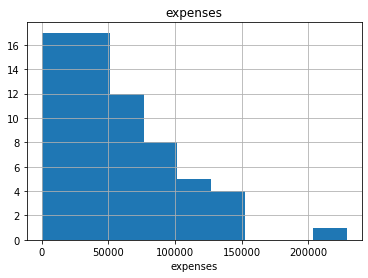

Average bin size: 22828.8
count        64.000000
mean      56002.421875
std       44820.514028
min         475.000000
25%       24924.750000
50%       49242.500000
75%       79255.000000
max      228763.000000
Name: expenses, dtype: float64


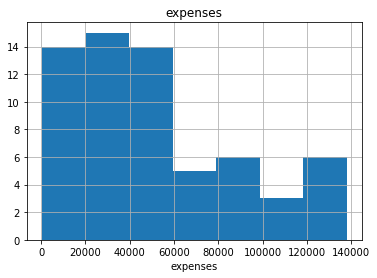

Average bin size: 17173.625
count        63.000000
mean      53260.190476
std       39398.578913
min         475.000000
25%       24064.500000
50%       48405.000000
75%       78265.000000
max      137864.000000
Name: expenses, dtype: float64


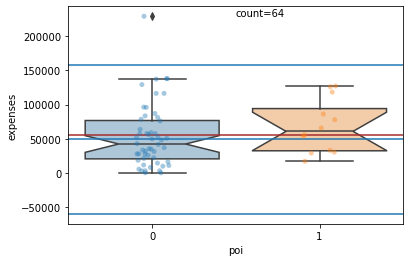

                    salary     bonus  long_term_incentive  deferred_income  \
MCCLELLAN GEORGE  263413.0  900000.0                  NaN        -125000.0   

                  deferral_payments    other  expenses  total_payments  \
MCCLELLAN GEORGE                NaN  51587.0  228763.0       1318763.0   

                  exercised_stock_options  restricted_stock  \
MCCLELLAN GEORGE                 506765.0          441096.0   

                  restricted_stock_deferred  total_stock_value  to_messages  \
MCCLELLAN GEORGE                        NaN           947861.0       1744.0   

                  from_poi_to_this_person  from_messages  \
MCCLELLAN GEORGE                     52.0           49.0   

                  from_this_person_to_poi  shared_receipt_with_poi  
MCCLELLAN GEORGE                      0.0                   1469.0  


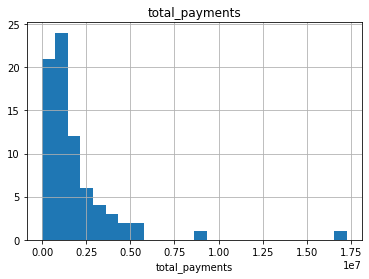

Average bin size: 690101.2
count    7.600000e+01
mean     1.824428e+06
std      2.373565e+06
min      0.000000e+00
25%      6.261040e+05
50%      1.138560e+06
75%      2.168061e+06
max      1.725253e+07
Name: total_payments, dtype: float64


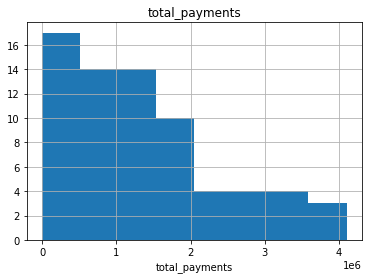

Average bin size: 455530.1111111111
count    7.000000e+01
mean     1.316568e+06
std      1.040443e+06
min      0.000000e+00
25%      5.680930e+05
50%      1.100246e+06
75%      1.835865e+06
max      4.099771e+06
Name: total_payments, dtype: float64


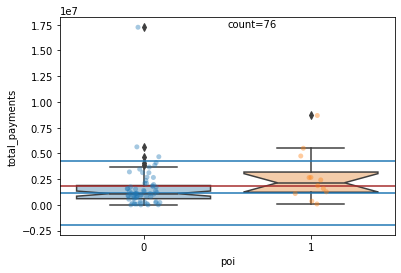

                       salary      bonus  long_term_incentive  \
BELDEN TIMOTHY N     213999.0  5249999.0                  NaN   
WHALLEY LAWRENCE G   510364.0  3000000.0             808346.0   
FREVERT MARK A      1060932.0  2000000.0            1617011.0   
BAXTER JOHN C        267102.0  1200000.0            1586055.0   
DELAINEY DAVID W     365163.0  3000000.0            1294981.0   
SKILLING JEFFREY K  1111258.0  5600000.0            1920000.0   

                    deferred_income  deferral_payments      other  expenses  \
BELDEN TIMOTHY N         -2334434.0          2144013.0   210698.0   17355.0   
WHALLEY LAWRENCE G              NaN                NaN   301026.0   57838.0   
FREVERT MARK A           -3367011.0          6426990.0  7427621.0   86987.0   
BAXTER JOHN C            -1386055.0          1295738.0  2660303.0   11200.0   
DELAINEY DAVID W                NaN                NaN     1661.0   86174.0   
SKILLING JEFFREY K              NaN                NaN    22122.0   29

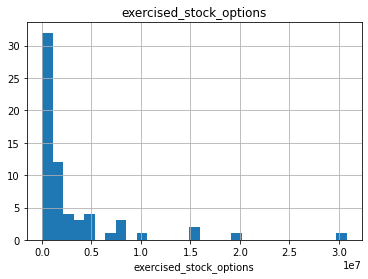

Average bin size: 1024575.5333333333
count    6.400000e+01
mean     3.111820e+06
std      5.233427e+06
min      2.879800e+04
25%      6.085218e+05
50%      1.080187e+06
75%      2.732761e+06
max      3.076606e+07
Name: exercised_stock_options, dtype: float64


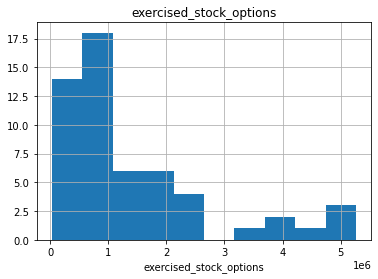

Average bin size: 476161.8181818182
count    5.500000e+01
mean     1.403574e+06
std      1.352647e+06
min      2.879800e+04
25%      5.541015e+05
50%      8.802900e+05
75%      1.636136e+06
max      5.266578e+06
Name: exercised_stock_options, dtype: float64


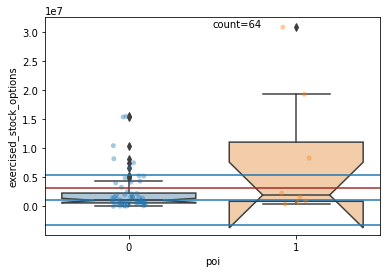

                        salary      bonus  long_term_incentive  \
PAI LOU L             261879.0  1000000.0                  NaN   
REDMOND BRIAN L        96840.0        NaN                  NaN   
YEAGER F SCOTT        158403.0        NaN                  NaN   
FREVERT MARK A       1060932.0  2000000.0            1617011.0   
BAXTER JOHN C         267102.0  1200000.0            1586055.0   
BHATNAGAR SANJAY           NaN        NaN                  NaN   
SKILLING JEFFREY K   1111258.0  5600000.0            1920000.0   
DIMICHELE RICHARD G   262788.0  1000000.0             694862.0   
HIRKO JOSEPH               NaN        NaN                  NaN   

                     deferred_income  deferral_payments      other  expenses  \
PAI LOU L                        NaN                NaN  1829457.0   32047.0   
REDMOND BRIAN L                  NaN                NaN        NaN   14689.0   
YEAGER F SCOTT                   NaN                NaN   147950.0   53947.0   
FREVERT MARK A     

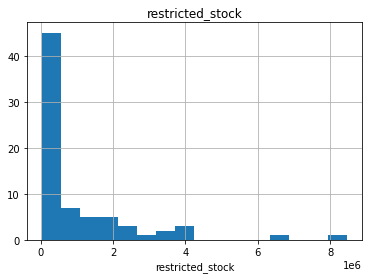

Average bin size: 494686.4705882353
count    7.300000e+01
mean     1.112319e+06
std      1.529334e+06
min      4.409300e+04
25%      2.520550e+05
50%      4.410960e+05
75%      1.392142e+06
max      8.453763e+06
Name: restricted_stock, dtype: float64


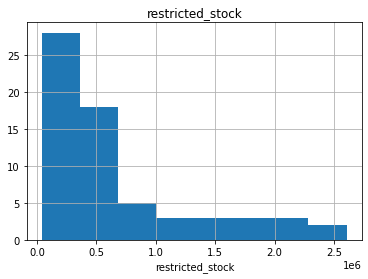

Average bin size: 284488.55555555556
count    6.500000e+01
mean     6.709495e+05
std      6.498675e+05
min      4.409300e+04
25%      2.130630e+05
50%      3.938180e+05
75%      9.340650e+05
max      2.604490e+06
Name: restricted_stock, dtype: float64


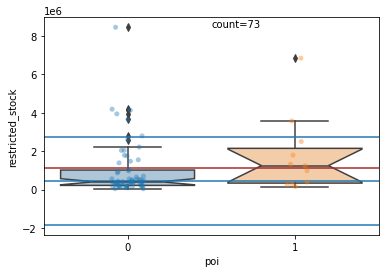

                       salary      bonus  long_term_incentive  \
WHALLEY LAWRENCE G   510364.0  3000000.0             808346.0   
PAI LOU L            261879.0  1000000.0                  NaN   
YEAGER F SCOTT       158403.0        NaN                  NaN   
IZZO LAWRENCE L       85274.0        NaN             312500.0   
FREVERT MARK A      1060932.0  2000000.0            1617011.0   
BAXTER JOHN C        267102.0  1200000.0            1586055.0   
KEAN STEVEN J        404338.0  1000000.0             300000.0   
SKILLING JEFFREY K  1111258.0  5600000.0            1920000.0   

                    deferred_income  deferral_payments      other  expenses  \
WHALLEY LAWRENCE G              NaN                NaN   301026.0   57838.0   
PAI LOU L                       NaN                NaN  1829457.0   32047.0   
YEAGER F SCOTT                  NaN                NaN   147950.0   53947.0   
IZZO LAWRENCE L                 NaN                NaN  1553729.0   28093.0   
FREVERT MARK A     

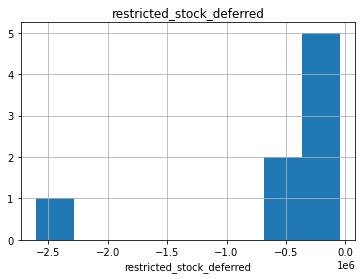

Average bin size: 284488.55555555556
count    8.000000e+00
mean    -5.607872e+05
std      8.439377e+05
min     -2.604490e+06
25%     -4.472210e+05
50%     -3.224465e+05
75%     -1.258935e+05
max     -4.409300e+04
Name: restricted_stock_deferred, dtype: float64


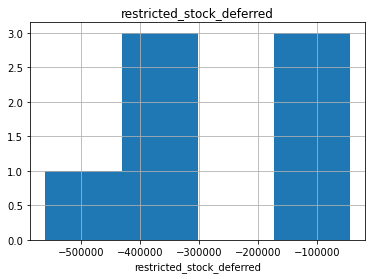

Average bin size: 103225.8
count         7.000000
mean    -268829.714286
std      188069.436795
min     -560222.000000
25%     -369689.500000
50%     -315068.000000
75%     -111523.000000
max      -44093.000000
Name: restricted_stock_deferred, dtype: float64


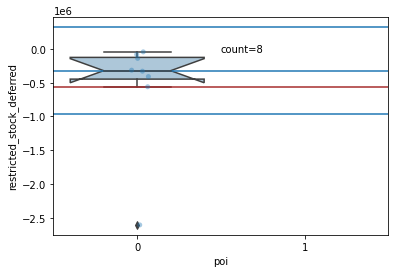

                  salary  bonus  long_term_incentive  deferred_income  \
BHATNAGAR SANJAY     NaN    NaN                  NaN              NaN   

                  deferral_payments  other  expenses  total_payments  \
BHATNAGAR SANJAY                NaN    NaN  137864.0        137864.0   

                  exercised_stock_options  restricted_stock  \
BHATNAGAR SANJAY               15456290.0         2604490.0   

                  restricted_stock_deferred  total_stock_value  to_messages  \
BHATNAGAR SANJAY                 -2604490.0         15456290.0        523.0   

                  from_poi_to_this_person  from_messages  \
BHATNAGAR SANJAY                      0.0           29.0   

                  from_this_person_to_poi  shared_receipt_with_poi  
BHATNAGAR SANJAY                      1.0                    463.0  


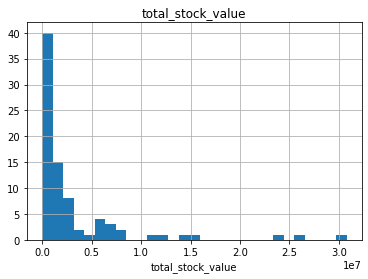

Average bin size: 1025535.4666666667
count    8.200000e+01
mean     3.364262e+06
std      5.633350e+06
min      0.000000e+00
25%      6.129080e+05
50%      1.095846e+06
75%      2.949847e+06
max      3.076606e+07
Name: total_stock_value, dtype: float64


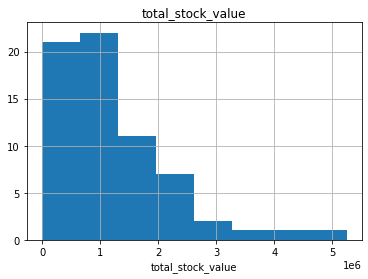

Average bin size: 582609.6666666666
count    6.600000e+01
mean     1.230341e+06
std      1.049275e+06
min      0.000000e+00
25%      4.945102e+05
50%      9.805345e+05
75%      1.822954e+06
max      5.243487e+06
Name: total_stock_value, dtype: float64


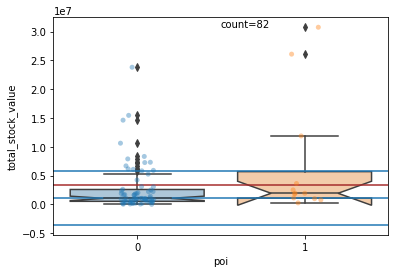

                        salary      bonus  long_term_incentive  \
HORTON STANLEY C           NaN        NaN                  NaN   
WHALLEY LAWRENCE G    510364.0  3000000.0             808346.0   
OVERDYKE JR JERE C     94941.0        NaN             135836.0   
PAI LOU L             261879.0  1000000.0                  NaN   
REDMOND BRIAN L        96840.0        NaN                  NaN   
YEAGER F SCOTT        158403.0        NaN                  NaN   
IZZO LAWRENCE L        85274.0        NaN             312500.0   
FREVERT MARK A       1060932.0  2000000.0            1617011.0   
BAXTER JOHN C         267102.0  1200000.0            1586055.0   
ELLIOTT STEVEN        170941.0   350000.0                  NaN   
BHATNAGAR SANJAY           NaN        NaN                  NaN   
KEAN STEVEN J         404338.0  1000000.0             300000.0   
SKILLING JEFFREY K   1111258.0  5600000.0            1920000.0   
WALLS JR ROBERT H     357091.0   850000.0             540751.0   
DIMICHELE 

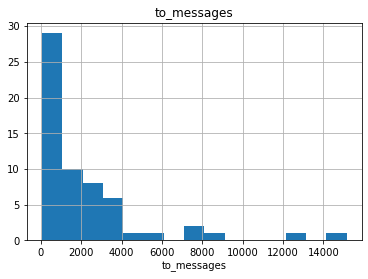

Average bin size: 943.25
count       60.000000
mean      2205.166667
std       2906.348843
min         57.000000
25%        555.250000
50%       1136.000000
75%       2647.500000
max      15149.000000
Name: to_messages, dtype: float64


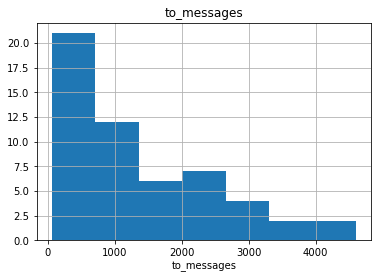

Average bin size: 568.75
count      54.000000
mean     1384.759259
std      1164.401230
min        57.000000
25%       518.500000
50%       901.000000
75%      2310.500000
max      4607.000000
Name: to_messages, dtype: float64


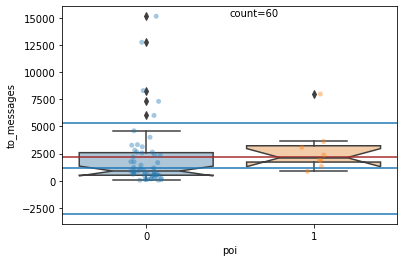

                      salary      bonus  long_term_incentive  deferred_income  \
BELDEN TIMOTHY N    213999.0  5249999.0                  NaN       -2334434.0   
BECK SALLY W        231330.0   700000.0                  NaN              NaN   
WHALLEY LAWRENCE G  510364.0  3000000.0             808346.0              NaN   
SHAPIRO RICHARD S   269076.0   650000.0                  NaN              NaN   
KITCHEN LOUISE      271442.0  3100000.0                  NaN              NaN   
KEAN STEVEN J       404338.0  1000000.0             300000.0              NaN   

                    deferral_payments     other  expenses  total_payments  \
BELDEN TIMOTHY N            2144013.0  210698.0   17355.0       5501630.0   
BECK SALLY W                      NaN     566.0   37172.0        969068.0   
WHALLEY LAWRENCE G                NaN  301026.0   57838.0       4677574.0   
SHAPIRO RICHARD S                 NaN     705.0  137767.0       1057548.0   
KITCHEN LOUISE                    NaN   93925.0

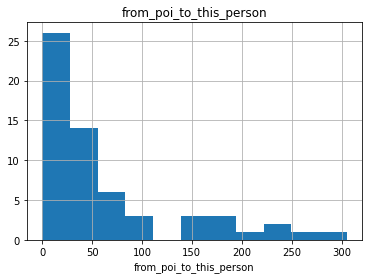

Average bin size: 25.416666666666668
count     60.000000
mean      61.350000
std       74.321296
min        0.000000
25%       10.000000
50%       36.000000
75%       68.750000
max      305.000000
Name: from_poi_to_this_person, dtype: float64


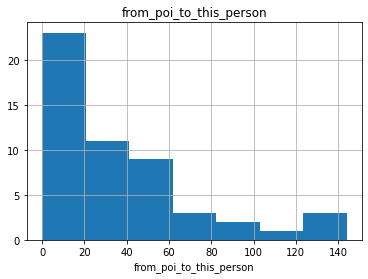

Average bin size: 18.0
count     52.000000
mean      36.480769
std       37.571104
min        0.000000
25%        9.250000
50%       26.500000
75%       53.250000
max      144.000000
Name: from_poi_to_this_person, dtype: float64


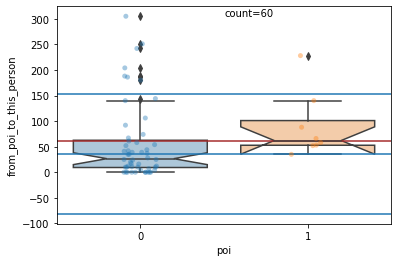

                         salary      bonus  long_term_incentive  \
BELDEN TIMOTHY N       213999.0  5249999.0                  NaN   
DONAHUE JR JEFFREY M   278601.0   800000.0                  NaN   
WHALLEY LAWRENCE G     510364.0  3000000.0             808346.0   
REDMOND BRIAN L         96840.0        NaN                  NaN   
DIETRICH JANET R       250100.0   600000.0             556416.0   
HAEDICKE MARK E        374125.0  1150000.0             983346.0   
FREVERT MARK A        1060932.0  2000000.0            1617011.0   
KITCHEN LOUISE         271442.0  3100000.0                  NaN   

                      deferred_income  deferral_payments      other  expenses  \
BELDEN TIMOTHY N           -2334434.0          2144013.0   210698.0   17355.0   
DONAHUE JR JEFFREY M        -300000.0                NaN      891.0   96268.0   
WHALLEY LAWRENCE G                NaN                NaN   301026.0   57838.0   
REDMOND BRIAN L                   NaN                NaN        NaN   14

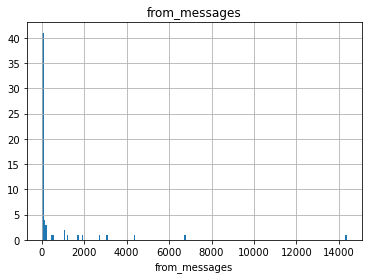

Average bin size: 71.78
count       60.000000
mean       698.500000
std       2139.115844
min         12.000000
25%         21.750000
50%         48.500000
75%        163.250000
max      14368.000000
Name: from_messages, dtype: float64


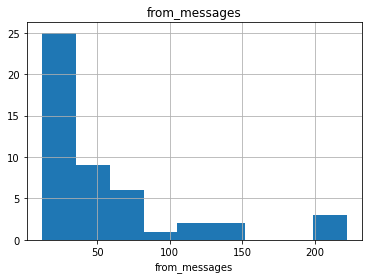

Average bin size: 21.0
count     48.000000
mean      53.562500
std       53.988536
min       12.000000
25%       19.000000
50%       33.500000
75%       61.500000
max      222.000000
Name: from_messages, dtype: float64


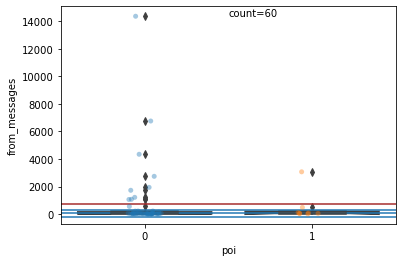

                       salary      bonus  long_term_incentive  \
KAMINSKI WINCENTY J  275101.0   400000.0             323466.0   
BELDEN TIMOTHY N     213999.0  5249999.0                  NaN   
BECK SALLY W         231330.0   700000.0                  NaN   
HORTON STANLEY C          NaN        NaN                  NaN   
WHALLEY LAWRENCE G   510364.0  3000000.0             808346.0   
SHAPIRO RICHARD S    269076.0   650000.0                  NaN   
HAEDICKE MARK E      374125.0  1150000.0             983346.0   
MCCONNELL MICHAEL S  365038.0  1100000.0             554422.0   
DELAINEY DAVID W     365163.0  3000000.0            1294981.0   
KITCHEN LOUISE       271442.0  3100000.0                  NaN   
KEAN STEVEN J        404338.0  1000000.0             300000.0   
HAYSLETT RODERICK J       NaN        NaN                  NaN   

                     deferred_income  deferral_payments     other  expenses  \
KAMINSKI WINCENTY J              NaN                NaN    4669.0   83585.0

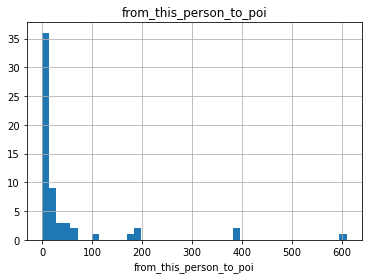

Average bin size: 13.840909090909092
count     60.00000
mean      45.25000
std      107.85122
min        0.00000
25%        0.00000
50%        6.50000
75%       27.75000
max      609.00000
Name: from_this_person_to_poi, dtype: float64


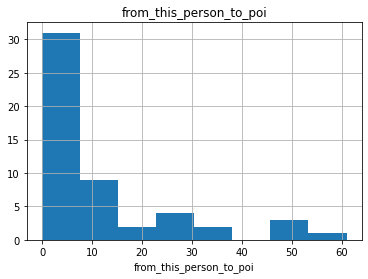

Average bin size: 6.777777777777778
count    52.000000
mean     11.557692
std      15.429045
min       0.000000
25%       0.000000
50%       5.000000
75%      15.000000
max      61.000000
Name: from_this_person_to_poi, dtype: float64


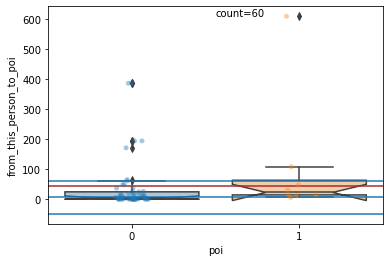

                       salary      bonus  long_term_incentive  \
KAMINSKI WINCENTY J  275101.0   400000.0             323466.0   
BELDEN TIMOTHY N     213999.0  5249999.0                  NaN   
BECK SALLY W         231330.0   700000.0                  NaN   
SHAPIRO RICHARD S    269076.0   650000.0                  NaN   
MCCONNELL MICHAEL S  365038.0  1100000.0             554422.0   
DELAINEY DAVID W     365163.0  3000000.0            1294981.0   
KITCHEN LOUISE       271442.0  3100000.0                  NaN   
KEAN STEVEN J        404338.0  1000000.0             300000.0   

                     deferred_income  deferral_payments     other  expenses  \
KAMINSKI WINCENTY J              NaN                NaN    4669.0   83585.0   
BELDEN TIMOTHY N          -2334434.0          2144013.0  210698.0   17355.0   
BECK SALLY W                     NaN                NaN     566.0   37172.0   
SHAPIRO RICHARD S                NaN                NaN     705.0  137767.0   
MCCONNELL MICHAEL S

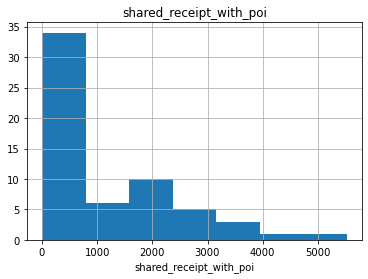

Average bin size: 689.875
count      60.000000
mean     1188.966667
std      1272.160393
min         2.000000
25%       165.250000
50%       724.000000
75%      1937.000000
max      5521.000000
Name: shared_receipt_with_poi, dtype: float64


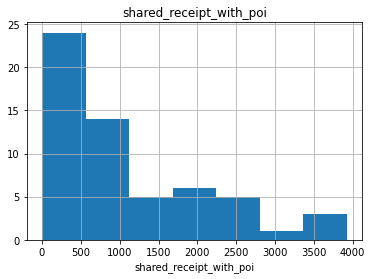

Average bin size: 489.75
count      58.000000
mean     1056.724138
std      1064.266847
min         2.000000
25%       139.750000
50%       659.500000
75%      1786.250000
max      3920.000000
Name: shared_receipt_with_poi, dtype: float64


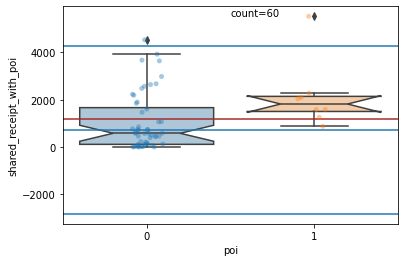

                     salary      bonus  long_term_incentive  deferred_income  \
BELDEN TIMOTHY N   213999.0  5249999.0                  NaN       -2334434.0   
SHAPIRO RICHARD S  269076.0   650000.0                  NaN              NaN   

                   deferral_payments     other  expenses  total_payments  \
BELDEN TIMOTHY N           2144013.0  210698.0   17355.0       5501630.0   
SHAPIRO RICHARD S                NaN     705.0  137767.0       1057548.0   

                   exercised_stock_options  restricted_stock  \
BELDEN TIMOTHY N                  953136.0          157569.0   
SHAPIRO RICHARD S                 607837.0          379164.0   

                   restricted_stock_deferred  total_stock_value  to_messages  \
BELDEN TIMOTHY N                         NaN          1110705.0       7991.0   
SHAPIRO RICHARD S                        NaN           987001.0      15149.0   

                   from_poi_to_this_person  from_messages  \
BELDEN TIMOTHY N                   

In [9]:
uni_all(data=X_train, labels=y_train, bins='auto')

#### Financial features

salary: same

bonus: same, this looks the least skewed when outliers are removed, except salary

long_term_incentive: same as rest

deferred_income: bottom code? No, don't top code FREVERT. He's a CEO and not a POI. That's important information. He looks like a POI in some ways, but isn't.

deferral_payments: top code FREVERT?, NaN to median

other: top code FREVERT?, NaN to median
FREVERT MARK A keeps showing up as a high outlier (total_payments). He was CEO

expenses: top code upper outlier?, NaN to median, probably won't matter, no real difference between classes.

total_payments: keep, top code FREVERT?, median 

exercised_stock_options: keep, median

restricted_stock:
outliers: keep
impute NaNs: median

restricted_stock_deferred: no POIs, no use. Remove the feature.

total_stock_value:
outliers: keep
impute NaNs: median

#### Email features
Email features are skewed, some more than others.

Only 60 inboxes.

There's a noticeable difference between the degrees of skew of from_this_person_to_poi and from_poi_to_this_person, it being more rare for a person to email a POI than to receive from a POI. May just be due to high-level people being more likely to both send executive mass emails and be a POI.

to_messages: same; surprisingly much less extreme outliers than from_messages.

from_messages: these outliers might be worth removing, except that the features doesn't seem indicative in and of itself. It might be useful to keep them and use the feature to engineer the ratio features.
KAMINSKI WINCENTY J is extremely out there. Might be worth removing her. We'll see how the residuals look on from_this_person_to_poi / from_messages
impute NaNs: median

from_poi_to_this_person: same as shared_receipt_with_poi, except not quite as significant difference in medians between target class.
impute NaNs: median

from_this_person_to_poi: same as shared_receipt_with_poi, except not such a significant difference in medians between target class.
impute NaNs: median

shared_receipt_with_poi:
outliers: 2; don't remove; indicative; not far out; skew not improved; data-rich records.
impute NaNs: median

In [10]:
### Drop restricted_stock_deferred since there are so few in the training set.
fin_features.remove('restricted_stock_deferred')
stock_features.remove('restricted_stock_deferred')
features_list.remove('restricted_stock_deferred')
# data_df.drop(columns='restricted_stock_deferred', inplace=True)
X_train.drop(columns='restricted_stock_deferred', inplace=True)
X_test.drop(columns='restricted_stock_deferred', inplace=True)

###### Ambiguous features to maybe check for clustering with others
deferred_income, expenses, other, long_term_incentive, restricted_stock (maybe)

In [11]:
ambiguous_feats_lst = ['deferred_income', 'expenses', 'other',
                       'long_term_incentive', 'restricted_stock']
x_exclude = [item for item in X_train.columns \
             if item not in ambiguous_feats_lst]
x_exclude

['salary',
 'bonus',
 'deferral_payments',
 'total_payments',
 'exercised_stock_options',
 'total_stock_value',
 'to_messages',
 'from_poi_to_this_person',
 'from_messages',
 'from_this_person_to_poi',
 'shared_receipt_with_poi']

#### Multivariate

##### Bivariate scatter, colored by POI

In [12]:
def target_scat_x(df, x, c, x_exclude=[], cols=3):

    x_include = [item for item in df.columns if item not in x_exclude]
    rows = math.ceil(len(x_include) / cols)
    
    fig = plt.figure()
    fig.set_size_inches(cols*4, rows*4)
    
    i = 0
    for xn in df[x_include]:
        if (x != xn) & (x not in x_exclude) & (xn != c.name):
            i += 1

#             ### Can't cluster until NaNs imputed.
#             clf = KMeans(n_clusters=c.unique()).fit(X=df[[x, xn]])
#             pred = clf.predict(X=df[[x, xn]])

            plt.subplot(rows, cols, i)
            plot = plt.scatter(x=df[x], y=df[xn], c=c)#, marker=pred)
            plt.xlabel(x)
            plt.ylabel(xn)
            plt.legend(*plot.legend_elements())
            
    plt.show()
    
    return

def target_scat_all(df, c, x_exclude=[], cols=3):
    for x in df:
        if x not in x_exclude:
            target_scat_x(df=df, x=x, c=c, x_exclude=x_exclude, cols=cols)
    return

<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\numpy\core\_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\matplotlib\ticker.py:665: UserWarning: Warning: converting a masked element to nan.
  s = self.format % xp


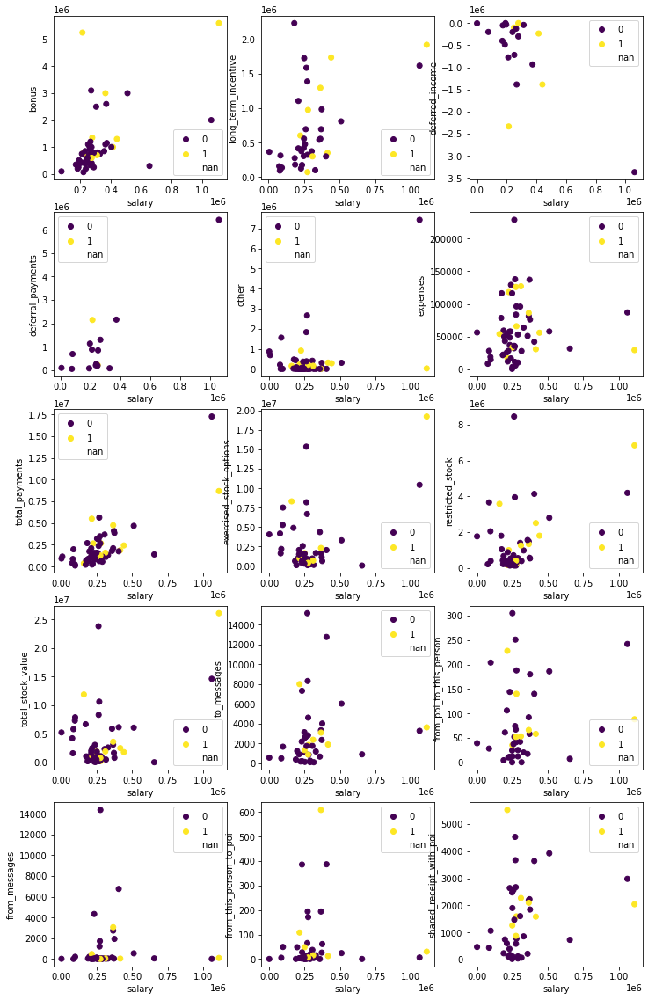

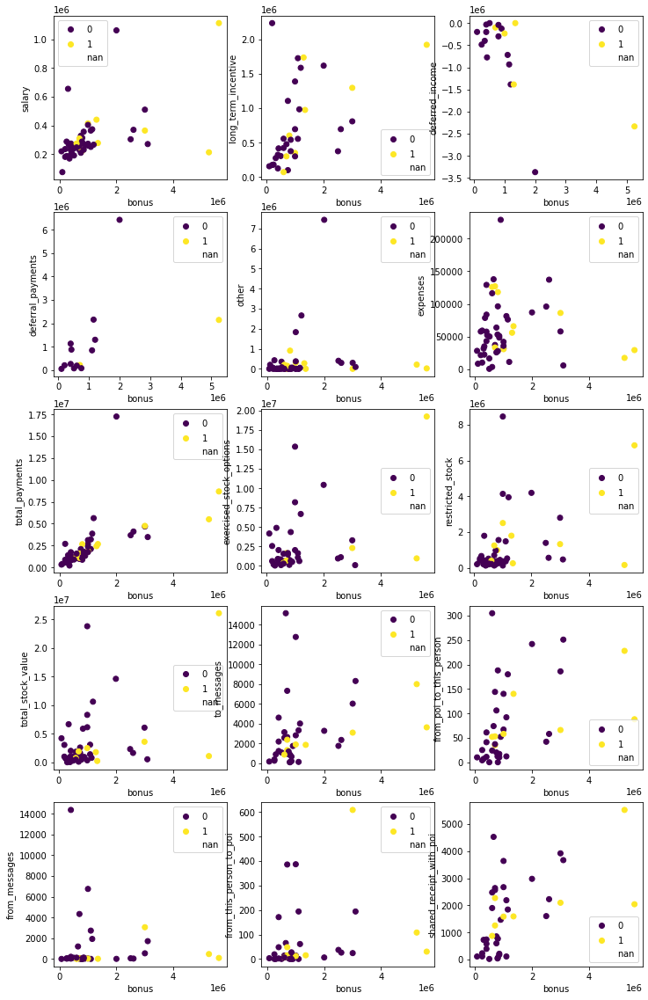

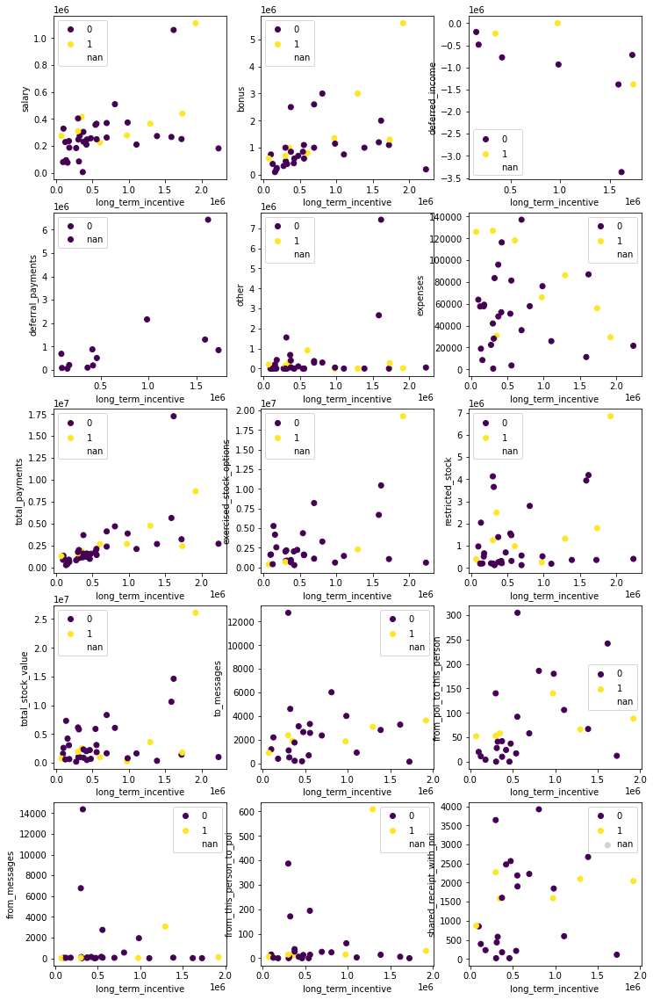

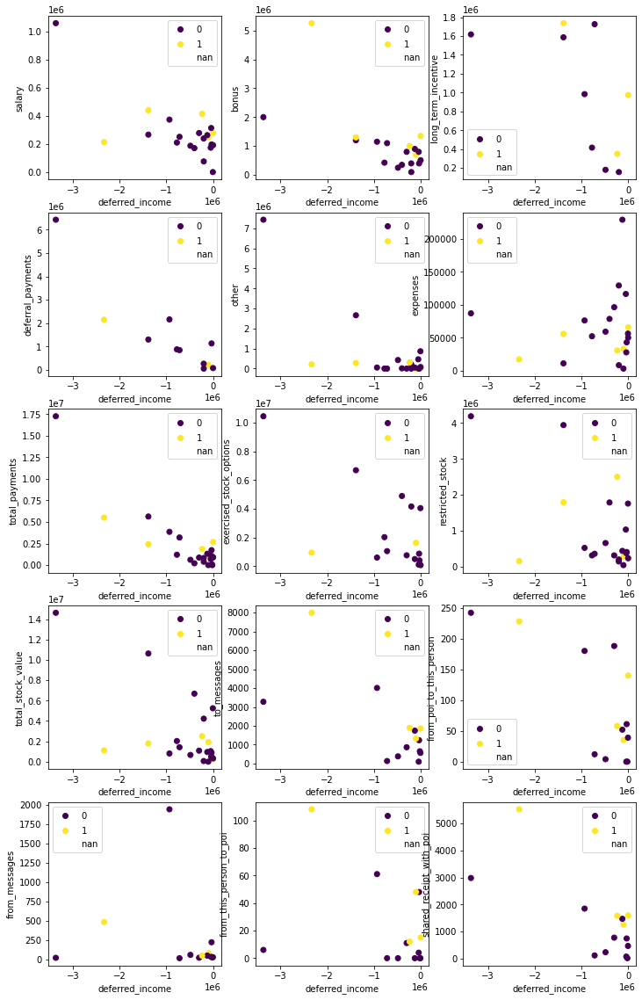

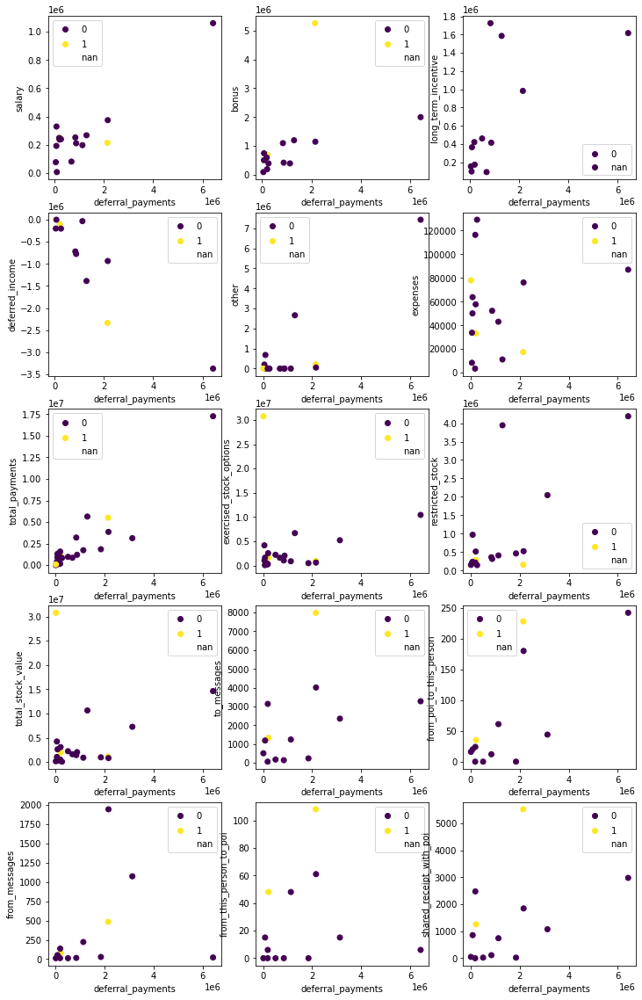

...

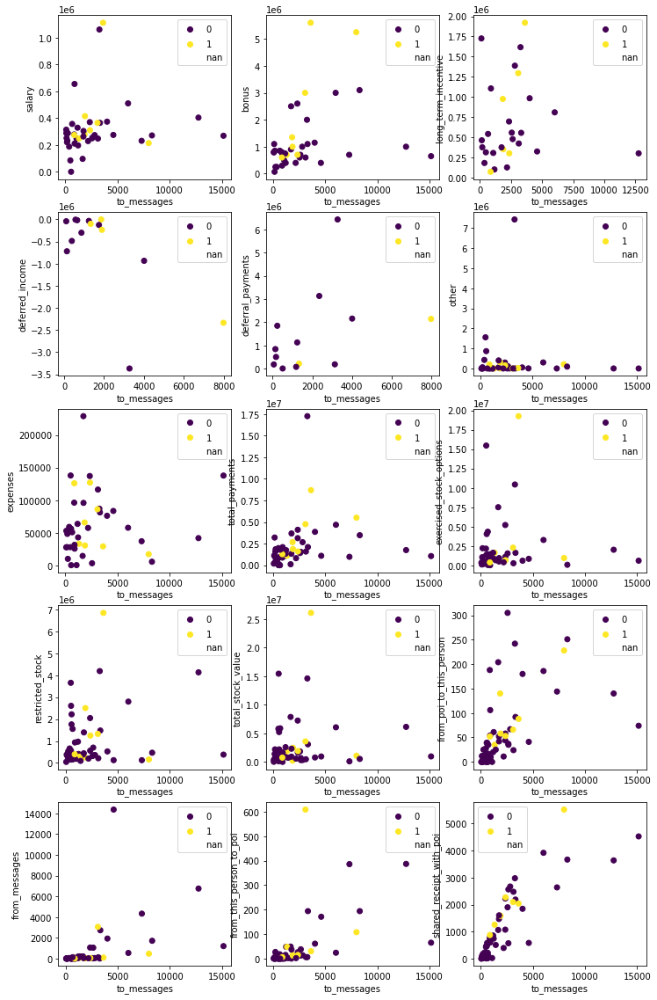

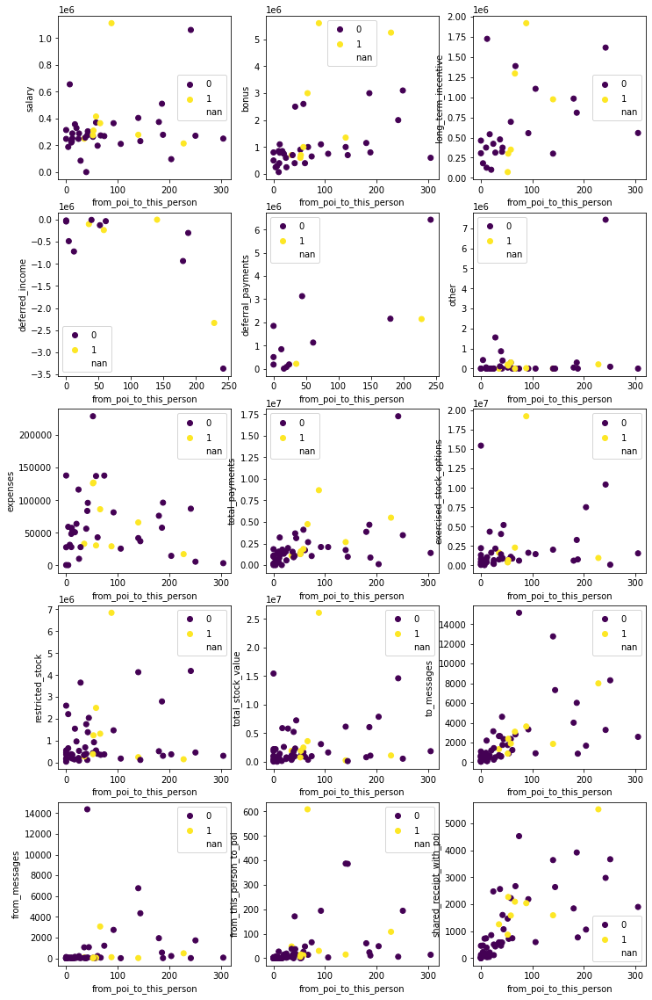

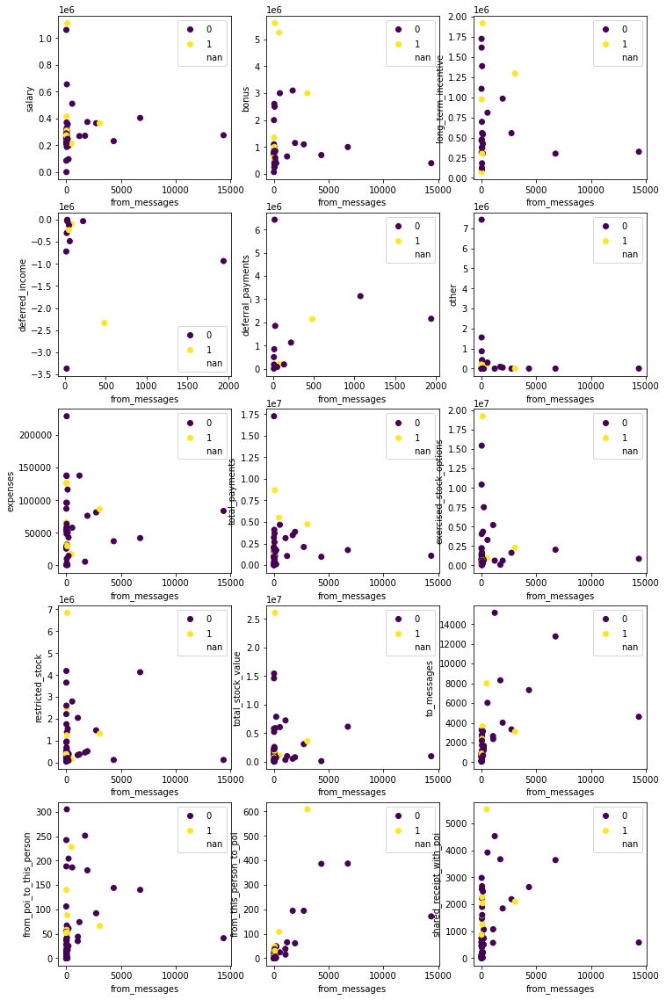

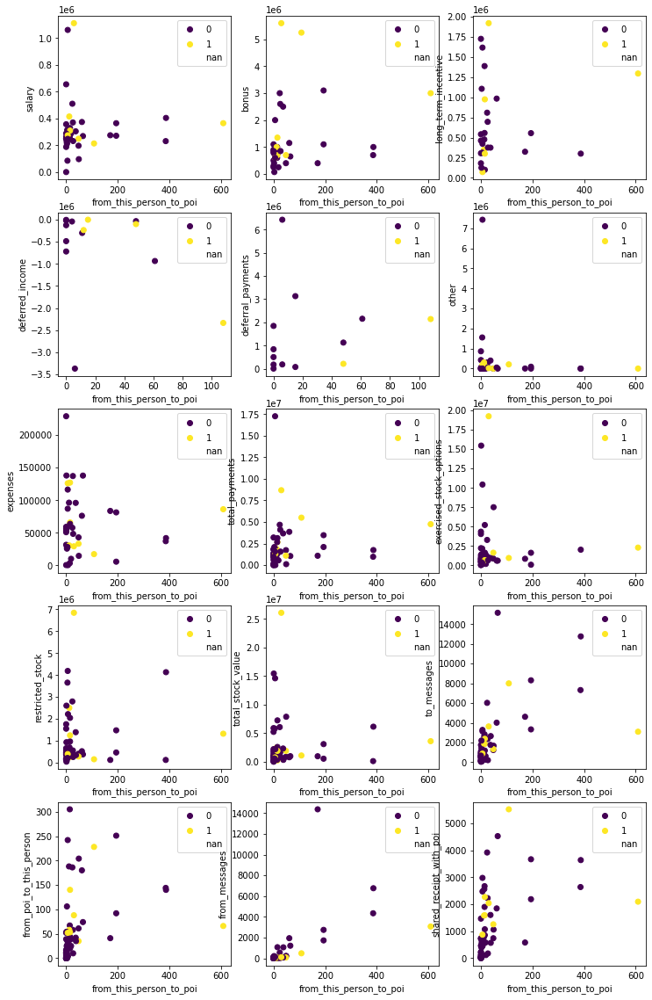

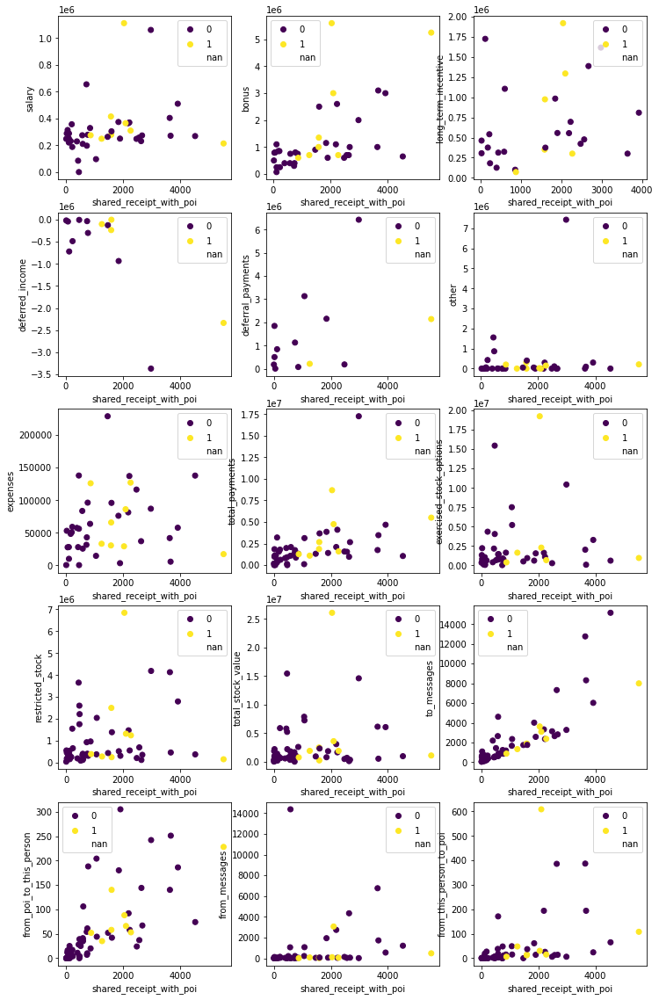

In [13]:
target_scat_all(df=X_train, c=y_train)

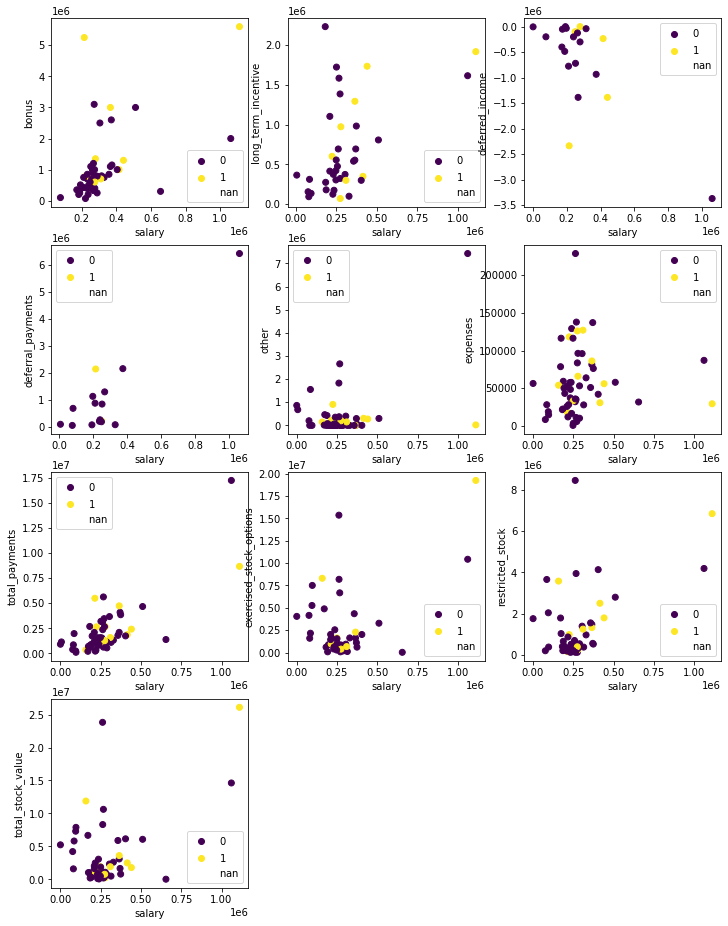

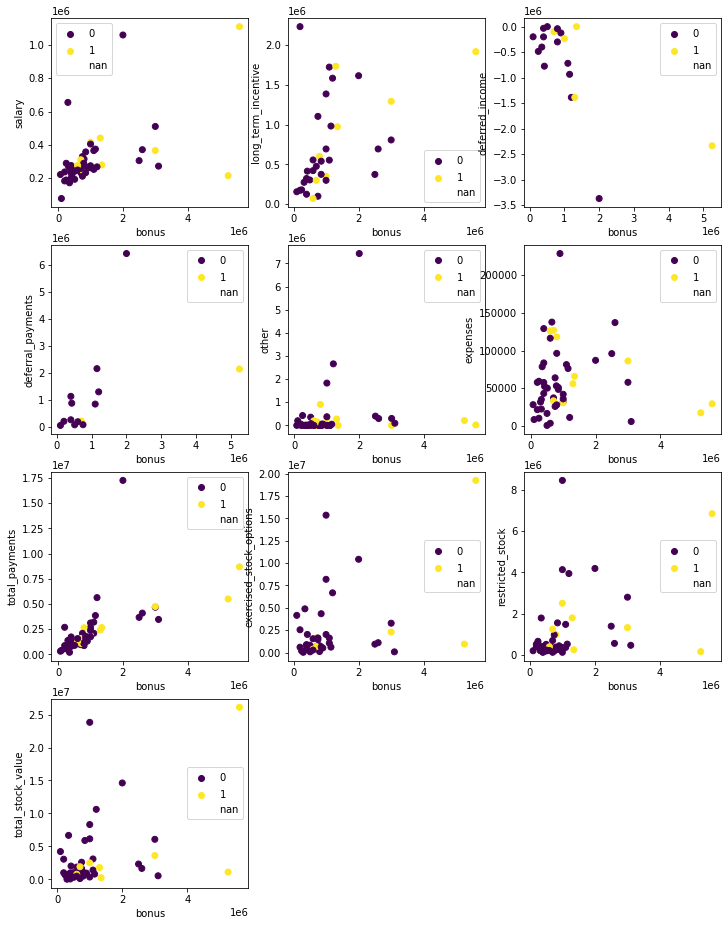

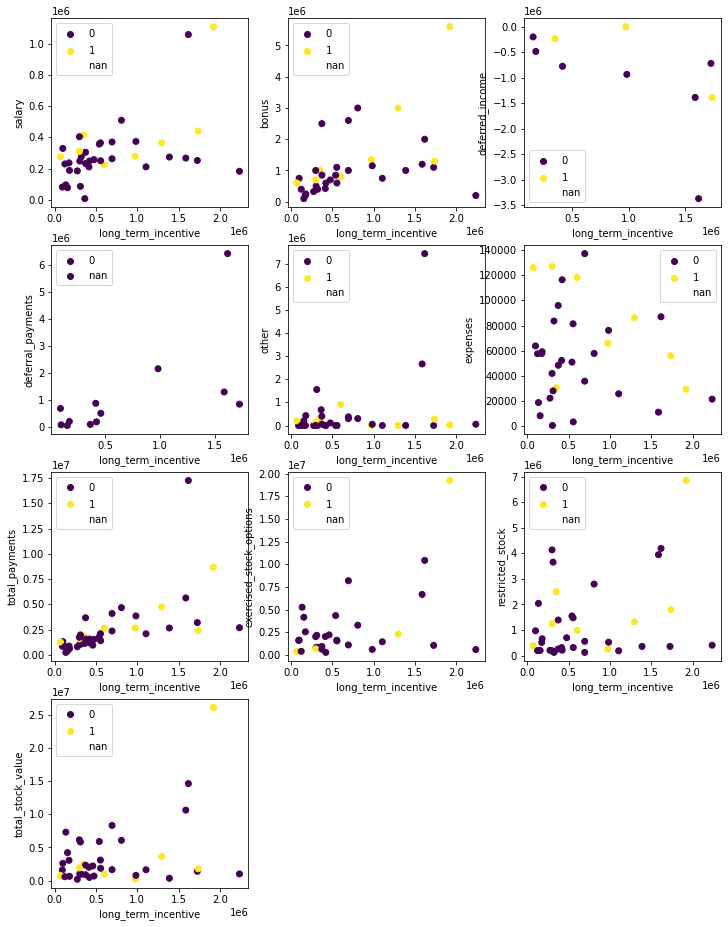

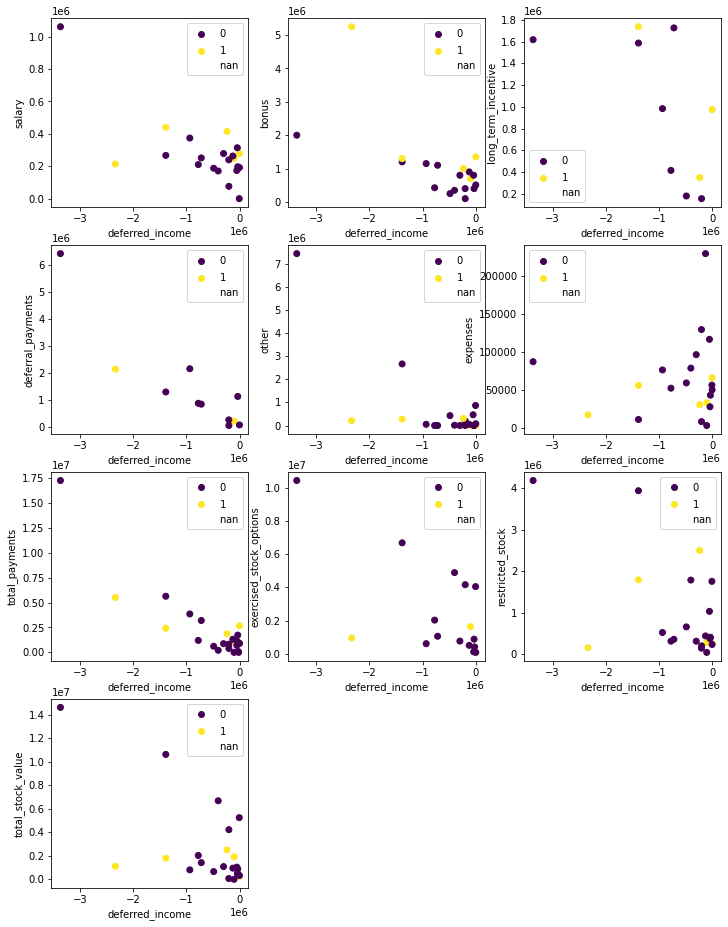

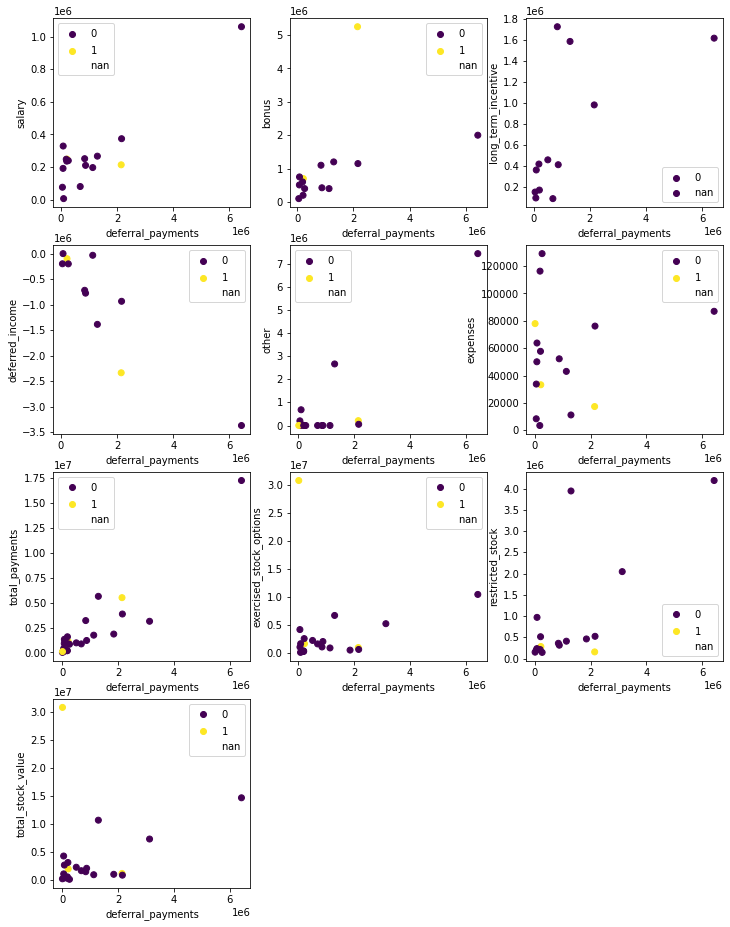

...

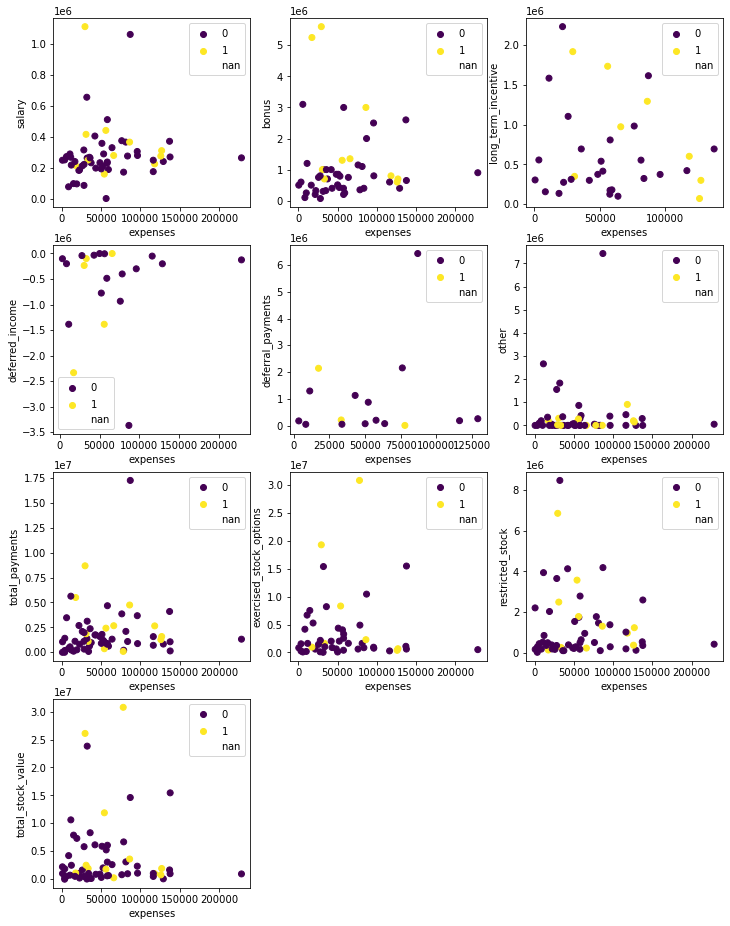

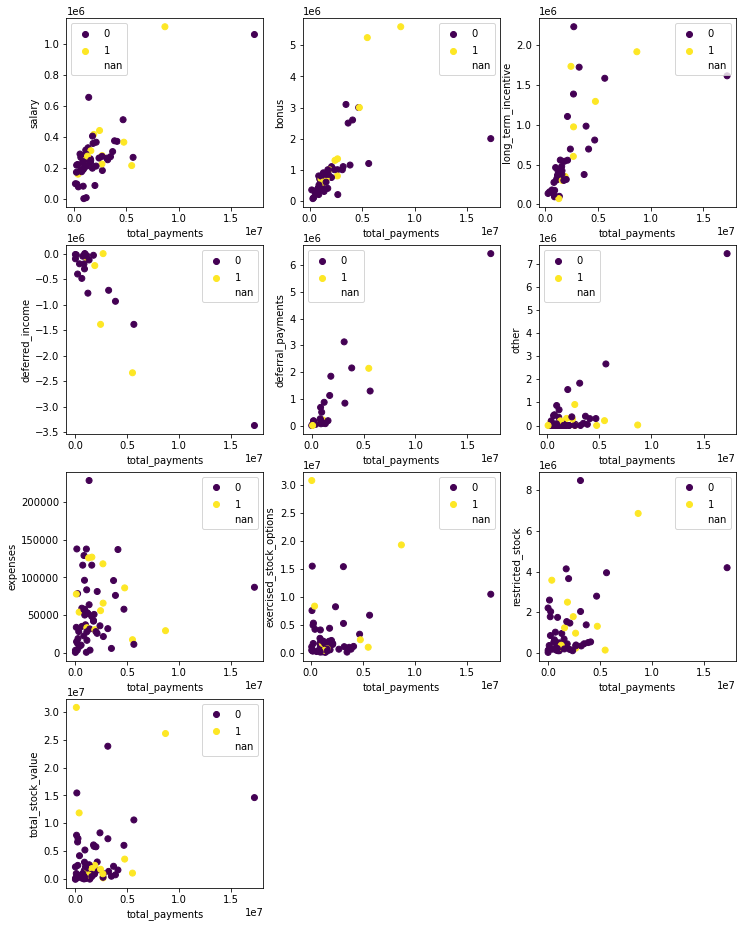

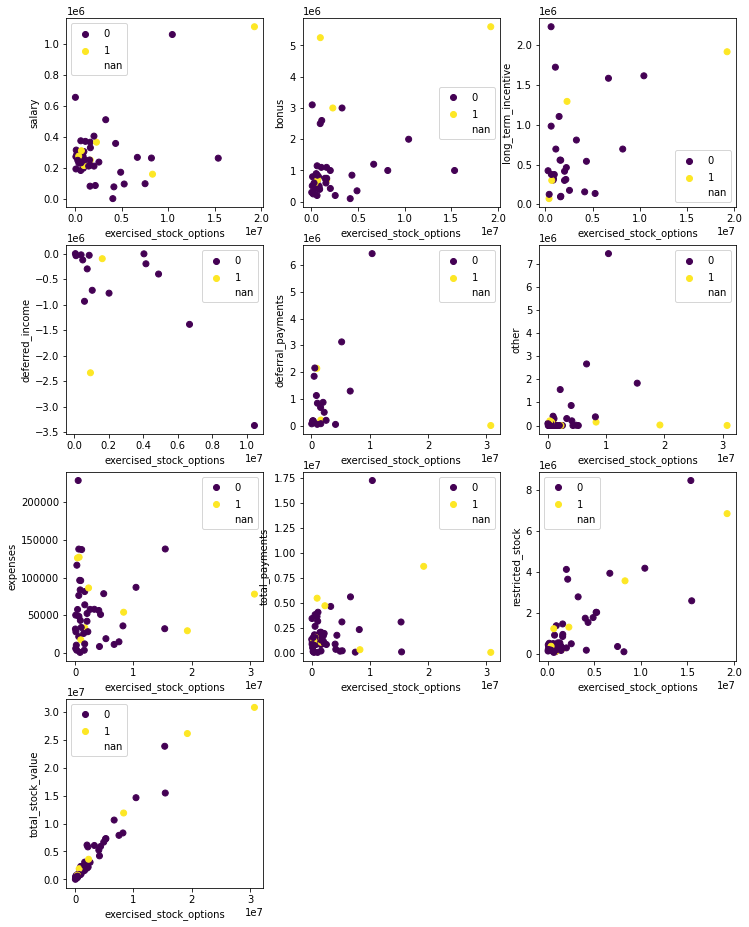

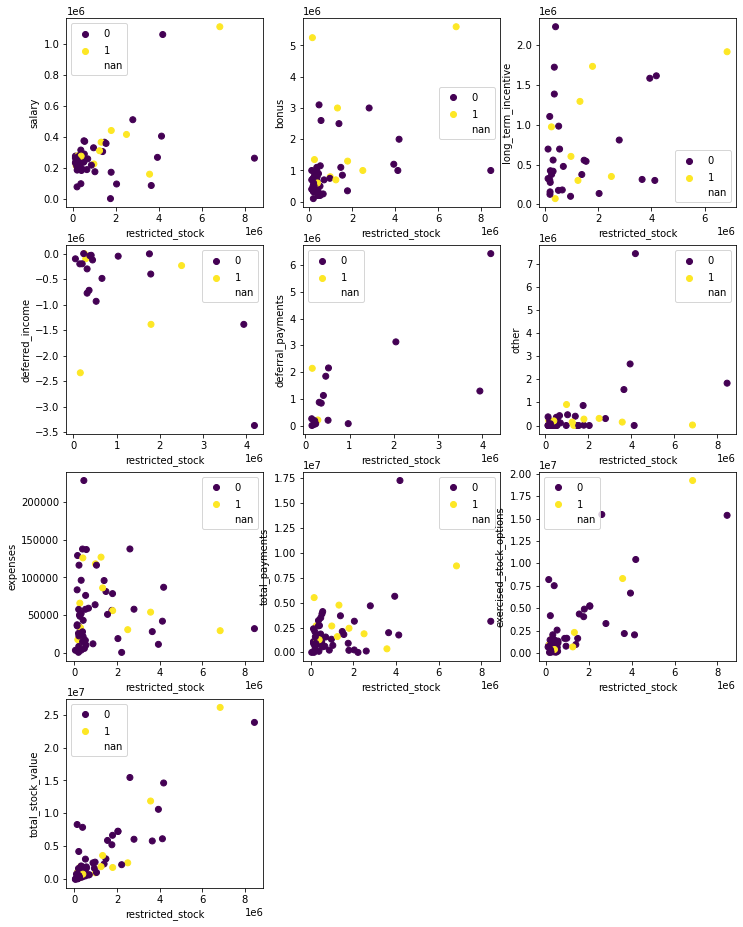

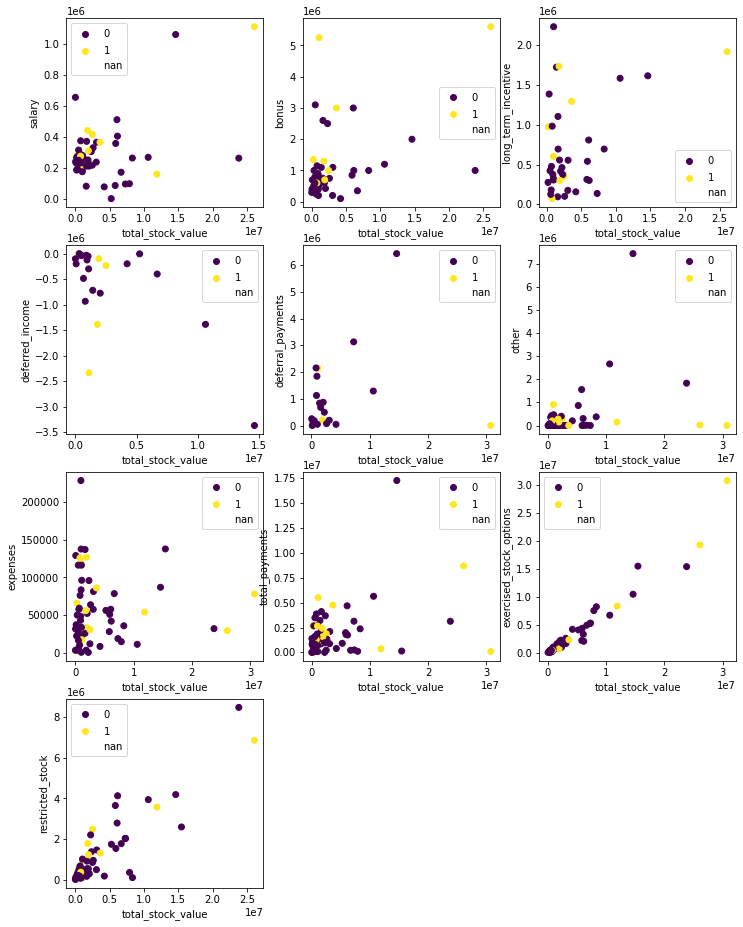

In [14]:
target_scat_all(df=X_train[fin_features], c=y_train)

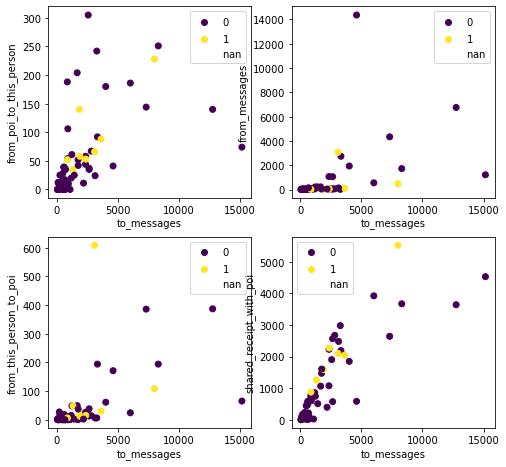

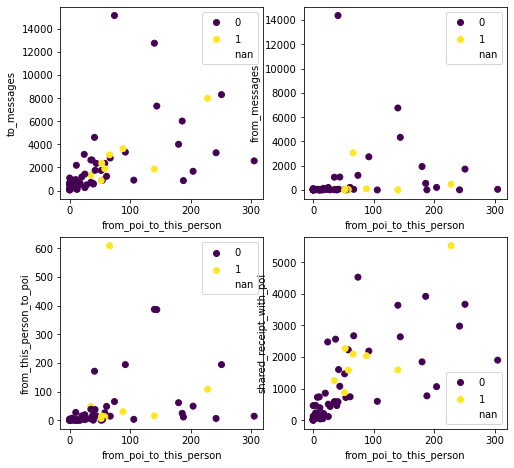

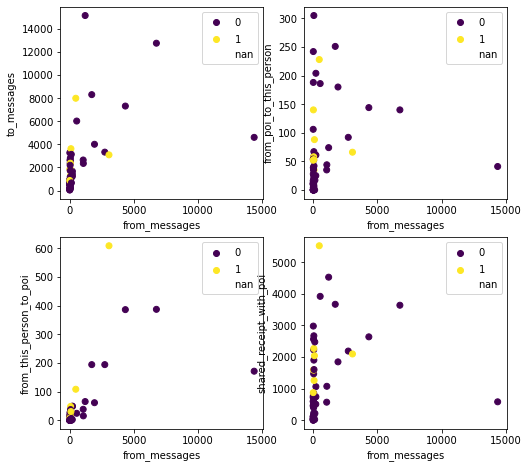

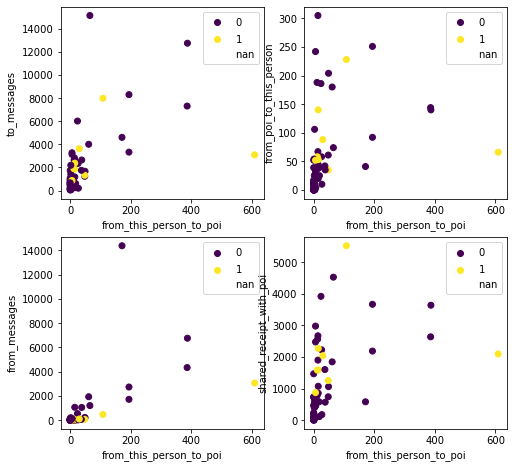

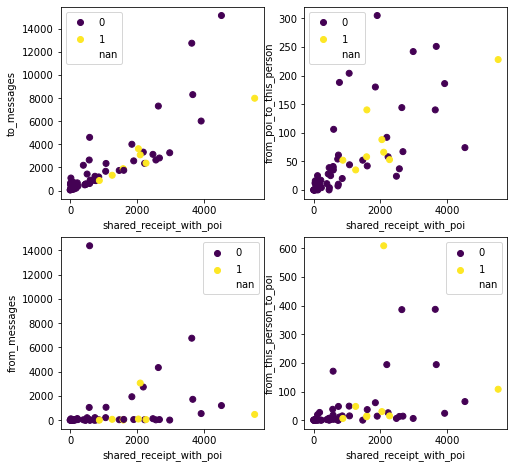

In [15]:
target_scat_all(df=X_train[email_features], c=y_train, cols=2)

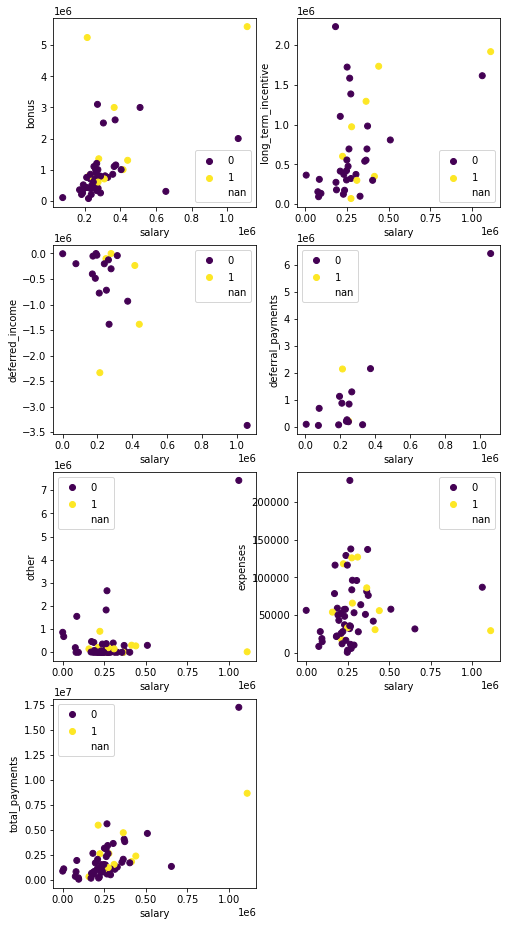

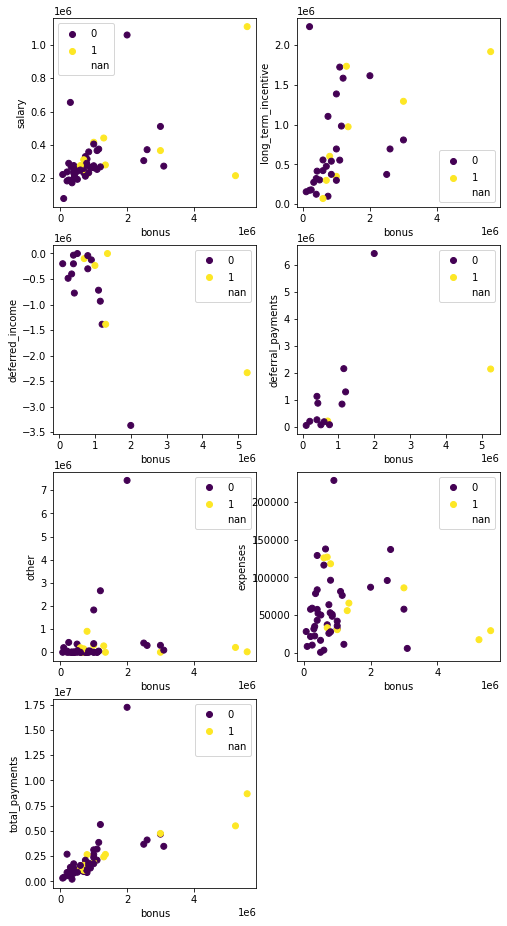

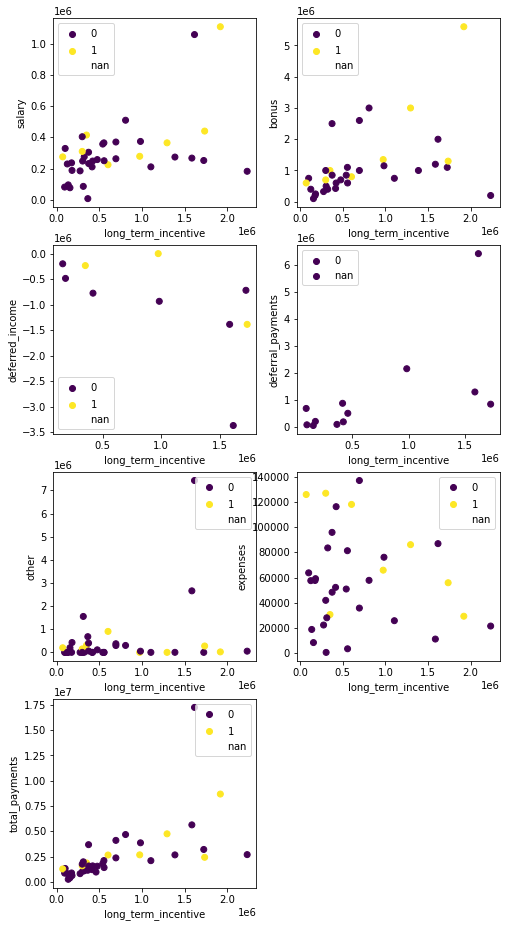

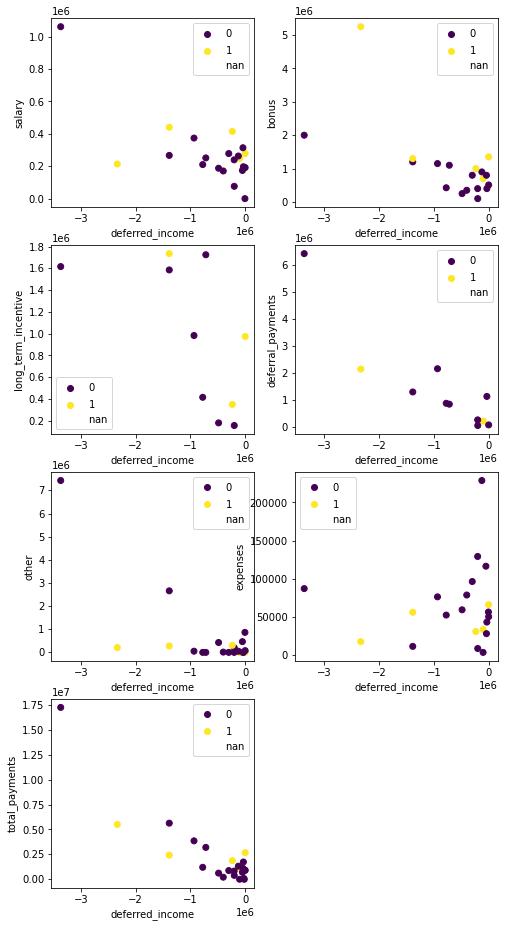

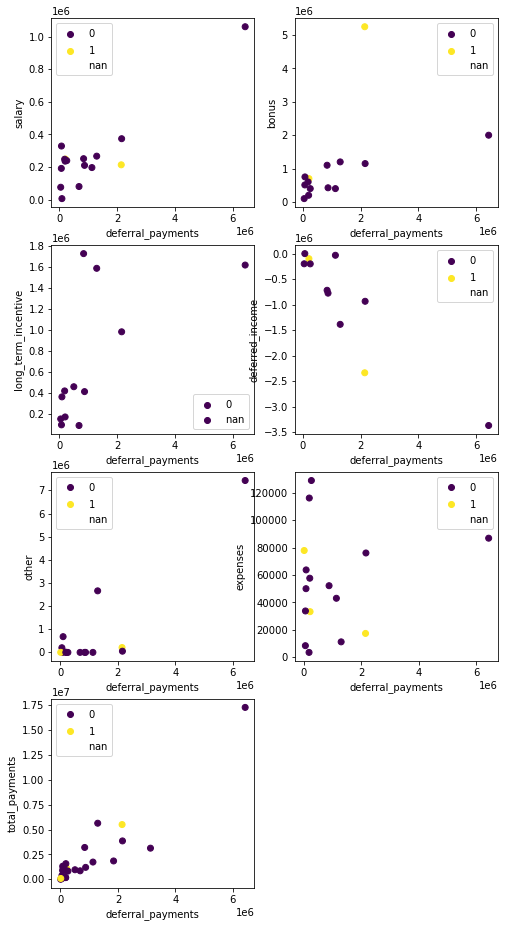

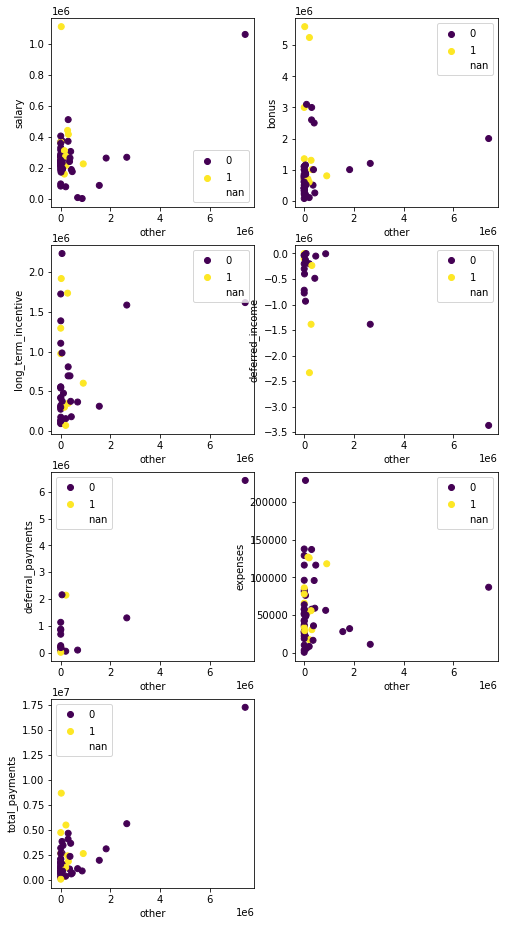

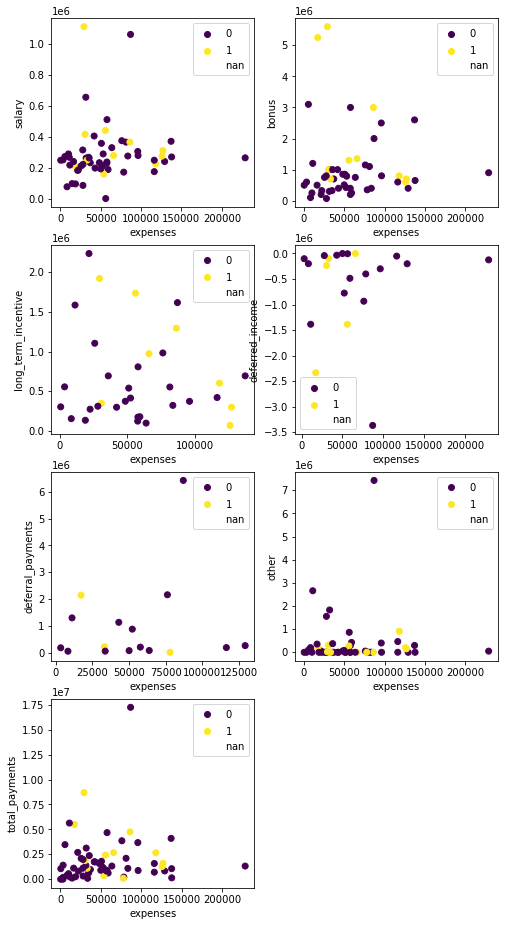

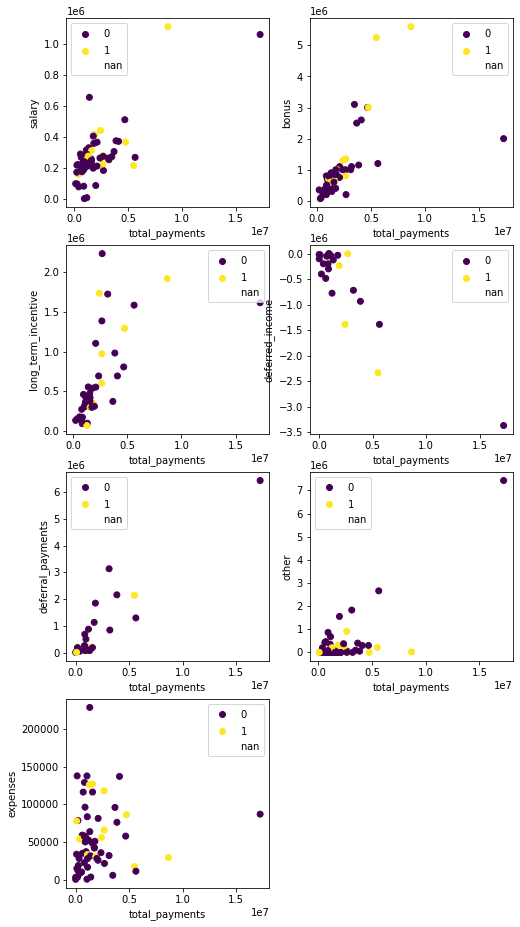

In [16]:
target_scat_all(df=X_train[pay_features], c=y_train,
               cols=2)

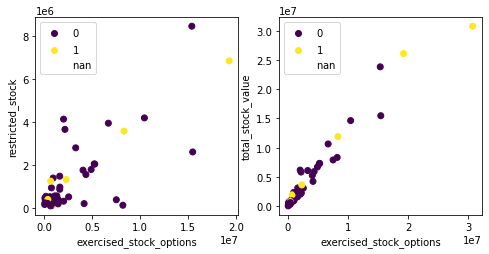

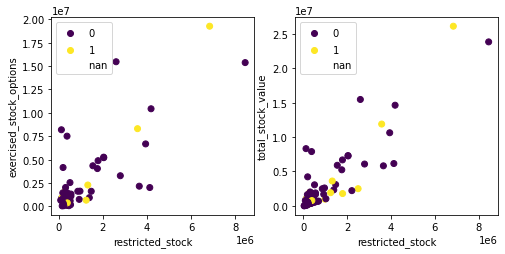

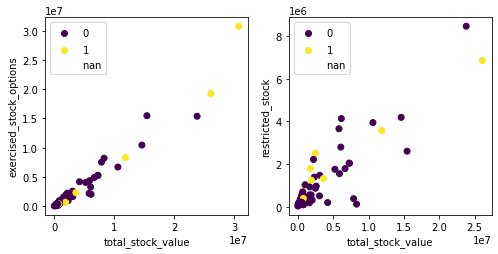

In [17]:
target_scat_all(df=X_train[stock_features], c=y_train,
               cols=2)

I don't see any financial bivariate quadrants/clusters that stand out as significantly helping POI recall or nonPOI precision.

Maybe:
Low bonus and high to_messages aids nonPOI precision.
High to_messages combines interestingly with several other features to indicate nonPOIs.

More stand out as aiding POI precision or nonPOI recall, which is not as helpful as the inverse, but better than not.
e.g. deffered_income with many others
I can let clustering and other derived features suss this out in feature seleciton and PCA.

POI deferral payments becomes very sparse once combined with other features.

As expected, POIs look to have a higher proportion of their to_messages as shared receipts with other POIs, a higher proportion of their from_messages are from_this_person_to_POI, a higher proportion of their emails from another POI are also shared receipts with other POIs.
In general, you might say that POIs don't send a lot of emails, but when they do, they're typically to other POIs. And, they receive and share proportionately more emails with other POIs.

##### Feature ratios

Let's look closer as this apparent relationship.

In [18]:
def get_reg_errors(x, y, q):
    x = np.reshape(np.array(x), (len(x), 1))
    y = np.reshape(np.array(y), (len(y), 1))
    reg = LinearRegression()
    reg.fit(X=x, y=y)
    pred = reg.predict(X=x)
    errors = abs(y - pred)
    out = np.quantile(a=errors, q=q)
    return reg, pred, out
    

def plot_ratio(data, x, y, labels, ratio_name, bins='auto', q=.9):
    print(ratio_name)
    plt.scatter(x=data[x], y=data[y], c=labels)
    df = data[[x, y]].dropna()
    reg, pred, out = get_reg_errors(x=df[x], y=df[y], q=q)
    plt.plot(df[x], pred, color='blue')
    plt.plot(df[x], pred+out, color='orange')
    plt.plot(df[x], pred-out, color='orange')
    plt.axline([0, 0], [1, 1], color='green')
#     plt.axline([0, 0], [-1, -1], color='red')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.show()
    ratio = data[y] / data[x]
    ratio.name = ratio_name
    scat_box(feat=ratio, labels=labels)
    return

In [19]:
### Change zero totals back to nan at least, to avoid div by 0 errors
# ### Actually, just drop POWERS WILLIAM
# X_train.drop(index='POWERS WILLIAM', inplace=True)
# y_train.drop(index='POWERS WILLIAM', inplace=True)

### Can't drop records now because it will mess up the split for Udacity.
### So, handle 0s when creating the features.
### NaN his financials.
X_train.loc[['POWERS WILLIAM'], pay_features] = np.nan

In [20]:
X_train.loc['POWERS WILLIAM']
y_train.loc['POWERS WILLIAM']

salary                       NaN
bonus                        NaN
long_term_incentive          NaN
deferred_income              NaN
deferral_payments            NaN
other                        NaN
expenses                     NaN
total_payments               NaN
exercised_stock_options      NaN
restricted_stock             NaN
total_stock_value            NaN
to_messages                653.0
from_poi_to_this_person      0.0
from_messages               26.0
from_this_person_to_poi      0.0
shared_receipt_with_poi     12.0
Name: POWERS WILLIAM, dtype: float64

0

from_poi_to


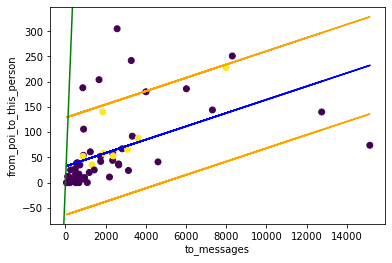

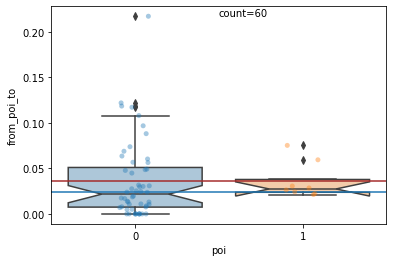

shared_to


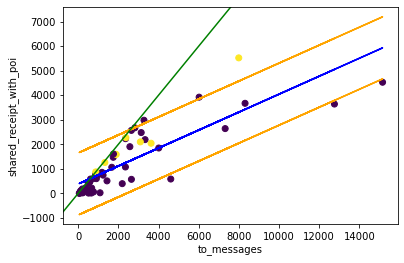

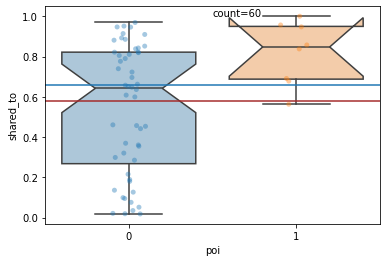

to_poi_from


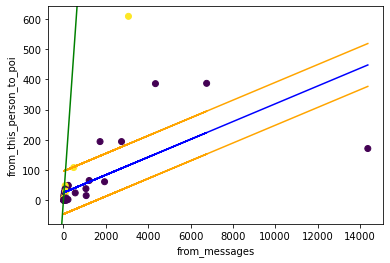

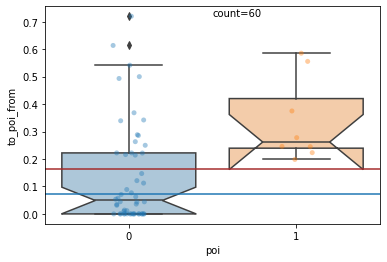

from_poi_shared


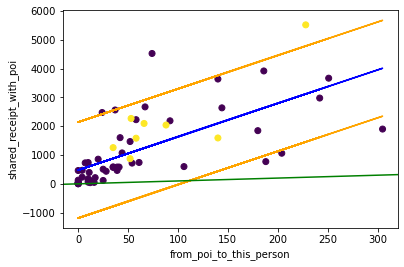

posx and posy should be finite values
posx and posy should be finite values


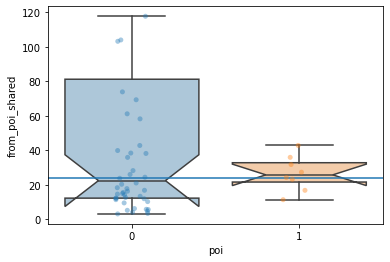

In [21]:
plot_ratio(data=X_train, y='from_poi_to_this_person', x='to_messages',
           labels=y_train, ratio_name='from_poi_to')
plot_ratio(data=X_train, y='shared_receipt_with_poi', x='to_messages',
           labels=y_train, ratio_name='shared_to')
plot_ratio(data=X_train, y='from_this_person_to_poi',
           x='from_messages', labels=y_train, ratio_name='to_poi_from')
plot_ratio(data=X_train, x='from_poi_to_this_person',
           y='shared_receipt_with_poi',
           labels=y_train, ratio_name='from_poi_shared')

These ratios look promising as new features, displaying a bigger difference between the target classes than their constituents. Below average shared_to and/or to_poi_from ratios look to be pretty good indicators of a nonPOI. But, from_poi_shared and from_poi_to don't seem to be that useful.

Top code to_messages to 12k and from_messages to 8k.

Maybe top code from_poi_to_this_person just a little to bias the model toward a higher POI recall. Use highest POI value.

In [22]:
test_X_train = X_train.copy()
test_X_train['to_messages'] = X_train['to_messages'].apply(lambda x: \
                            x if x < 12000 or np.isnan(x) else 12000)
test_X_train['from_messages'] = X_train['from_messages'].apply(lambda x: \
                            x if x < 8000 or np.isnan(x) else 8000)
top = X_train[y_train == 1]['from_poi_to_this_person'].max()
test_X_train['from_poi_to_this_person'] = X_train['from_poi_to_this_person']\
                                     .apply(lambda x: \
                                     x if x < top or math.isnan(x) else top)

from_poi_to


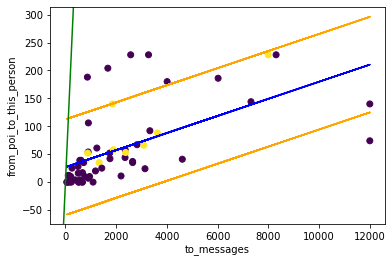

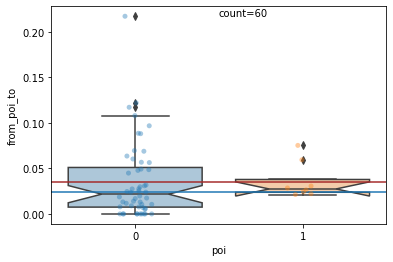

shared_to


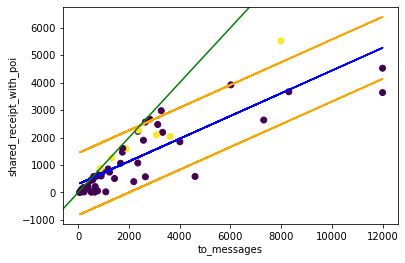

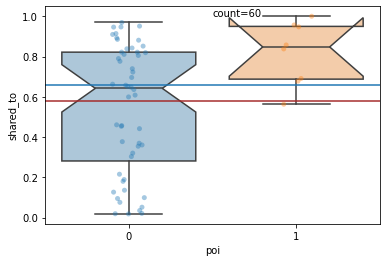

to_poi_from


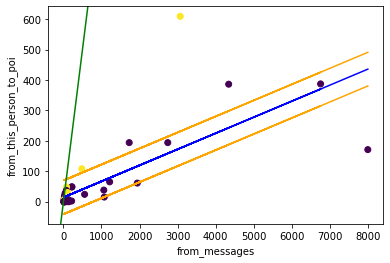

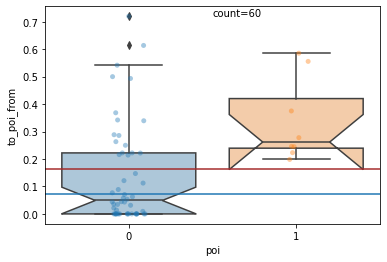

from_poi_shared


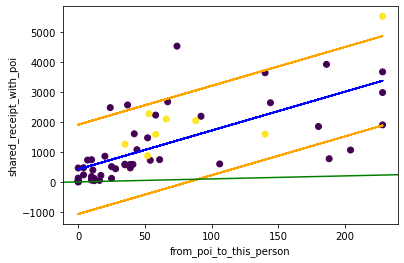

posx and posy should be finite values
posx and posy should be finite values


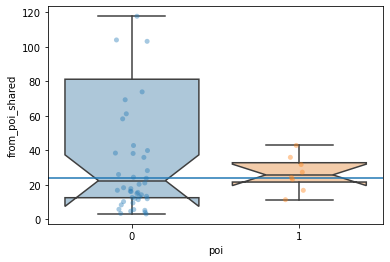

In [23]:
plot_ratio(data=test_X_train, y='from_poi_to_this_person', x='to_messages',
           labels=y_train, ratio_name='from_poi_to')
plot_ratio(data=test_X_train, y='shared_receipt_with_poi', x='to_messages',
           labels=y_train, ratio_name='shared_to')
plot_ratio(data=test_X_train, y='from_this_person_to_poi',
           x='from_messages', labels=y_train, ratio_name='to_poi_from')
plot_ratio(data=test_X_train, x='from_poi_to_this_person',
           y='shared_receipt_with_poi',
           labels=y_train, ratio_name='from_poi_shared')

Only slightly shifted the from_poi_to regression down to aid in POI recall, while not really changing the distribution of the ratio. Not sure it was worth it.

Only shifted a few nonPOIs below the shared_to regression to aid nonPOI precision, while not really changing the distribution of the ratio.

Had a decent steepening effect on the to_poi_from regression to aid nonPOI precision, while not really changing the distribution of the ratio. This might be more worth it.

Centered from_poi_shared regression more in POI sample to slightly hinder POI recall, while not really changing the distribution of the ration. This counteracts any small benefit from the from_poi_to regression.

It doesn't seem worth top coding the from_poi_to_this_person feature, but maybe worth top coding to_messages and from_messages.

In [24]:
### Top code to_messages and from_messages to aid nonPOI precision.
### Only top coding the training set to bias the model,
### since I am less concerned with accuracy than I am with POI recall,
### and by extension, nonPOI precision.
X_train['to_messages'] = X_train['to_messages'].apply(lambda x: \
                            x if x < 12000 or np.isnan(x) else 12000)
X_train['from_messages'] = X_train['from_messages'].apply(lambda x: \
                            x if x < 8000 or np.isnan(x) else 8000)

In [25]:
def plot_ratios_to_x(data, feats, x_pos, labels, bins='auto'):
    for feat in feats:
        if feat != feats[x_pos]:
            plot_ratio(data=data, x=feats[x_pos], y=feat,
                       labels=labels, ratio_name=feat+'__'+feats[x_pos],
                       bins=bins)
    return

salary__total_payments


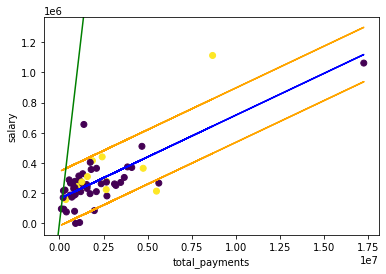

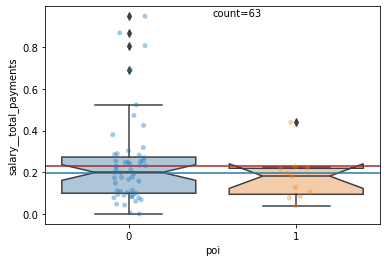

bonus__total_payments


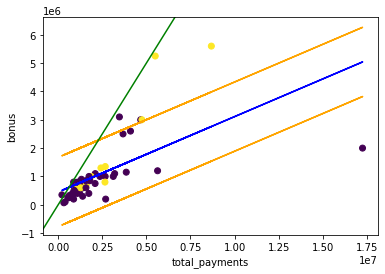

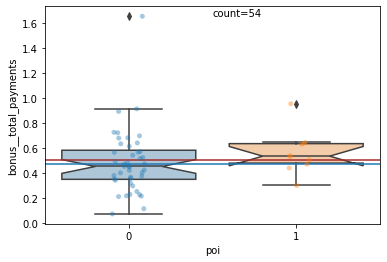

long_term_incentive__total_payments


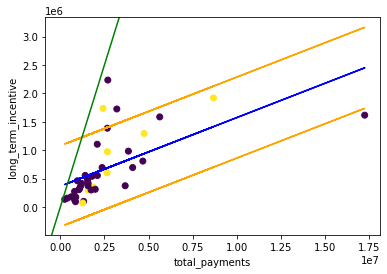

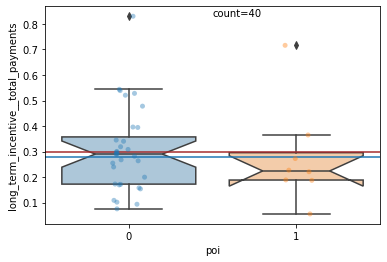

deferred_income__total_payments


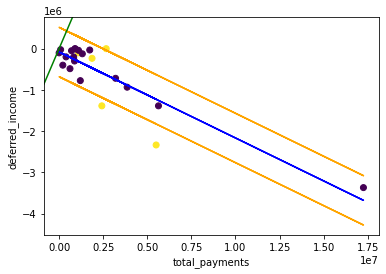

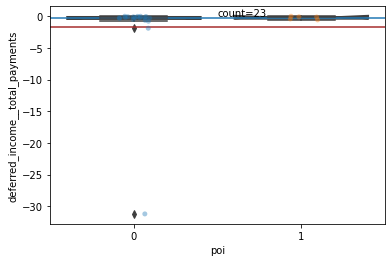

deferral_payments__total_payments


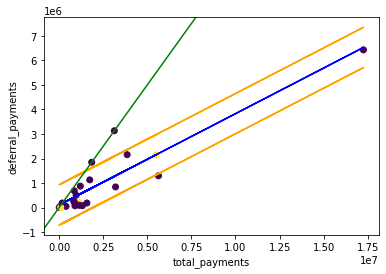

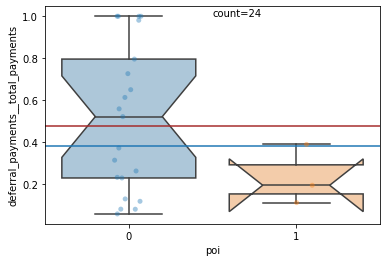

other__total_payments


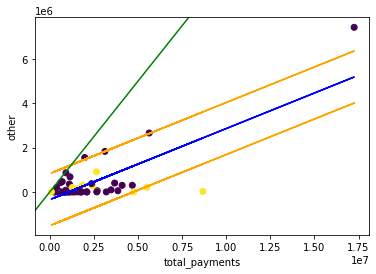

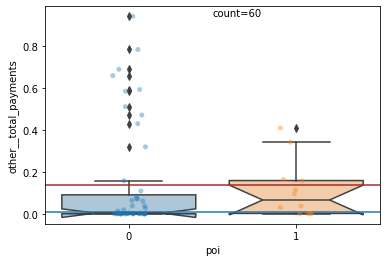

expenses__total_payments


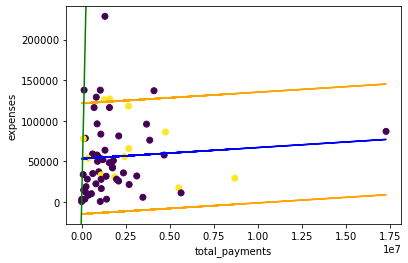

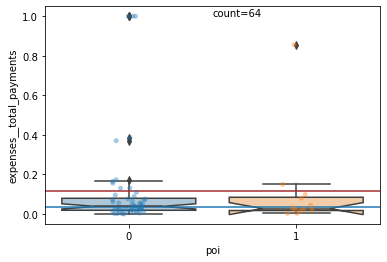

exercised_stock_options__total_stock_value


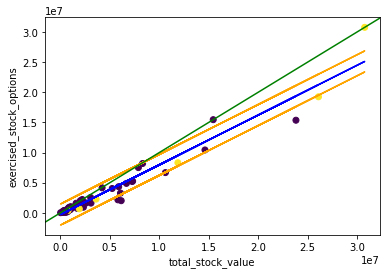

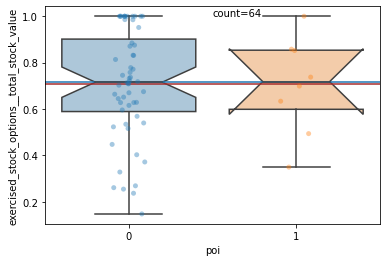

restricted_stock__total_stock_value


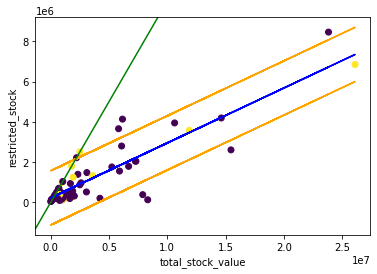

posx and posy should be finite values
posx and posy should be finite values


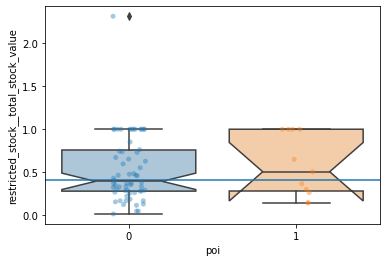

In [26]:
plot_ratios_to_x(data=X_train, feats=pay_features,
                 x_pos=len(pay_features)-1, labels=y_train)
plot_ratios_to_x(data=X_train, feats=stock_features,
                 x_pos=len(stock_features)-1, labels=y_train)

In [27]:
### Try top coding
top = X_train['total_payments'].dropna().sort_values()[-2]
test_X_train['total_payments'] = test_X_train['total_payments']\
                                        .apply(lambda x : \
                                        x if x < top or np.isnan(x) else top)
top = X_train['other'].dropna().sort_values()[-2]
test_X_train['other'] = test_X_train['other']\
                                        .apply(lambda x : \
                                        x if x < top or np.isnan(x) \
                                        else top)
top = X_train['long_term_incentive'].dropna().sort_values()[-2]
test_X_train['long_term_incentive'] = test_X_train['long_term_incentive']\
                                        .apply(lambda x : \
                                        x if x < top or np.isnan(x) \
                                        else top)
test_y_train = y_train.copy()
### Same story as Powers, NaN all of Belfer instead of simply dropping.
test_X_train.loc['BELFER ROBERT'] = np.nan

In [1]:
data_df.loc['BELFER ROBERT']['poi']

NameError: name 'data_df' is not defined

salary__total_payments


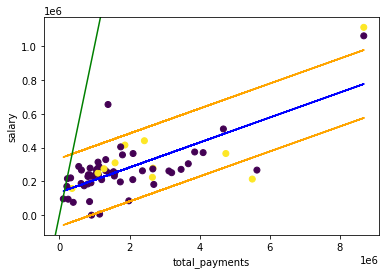

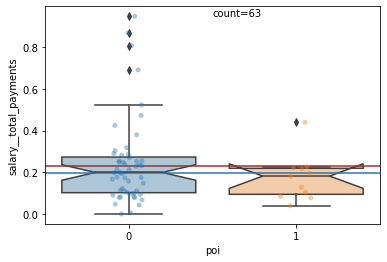

bonus__total_payments


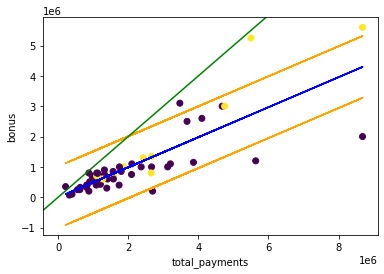

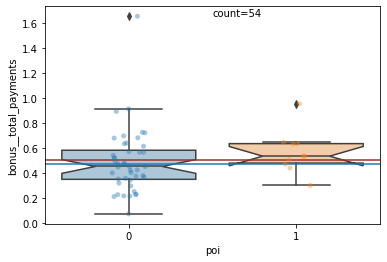

long_term_incentive__total_payments


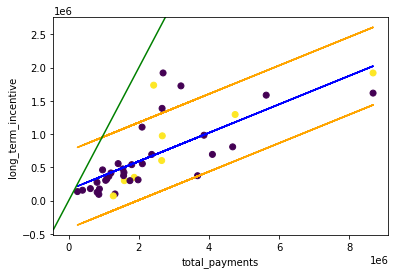

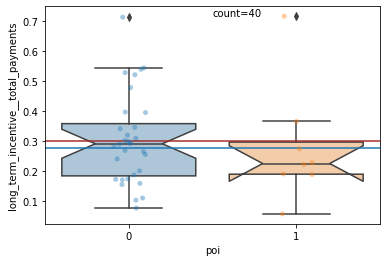

deferred_income__total_payments


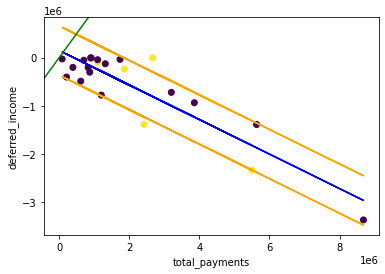

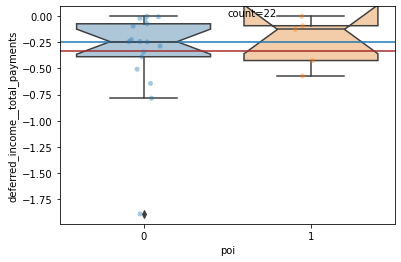

deferral_payments__total_payments


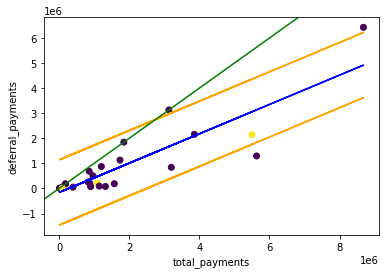

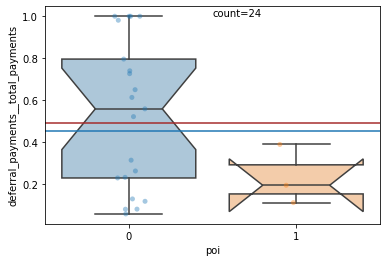

other__total_payments


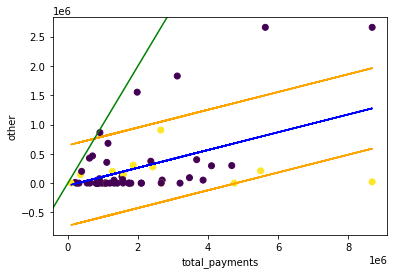

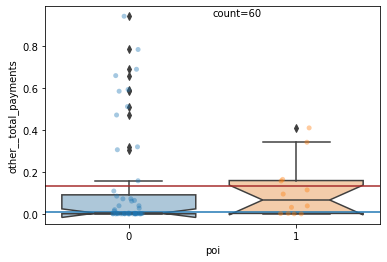

expenses__total_payments


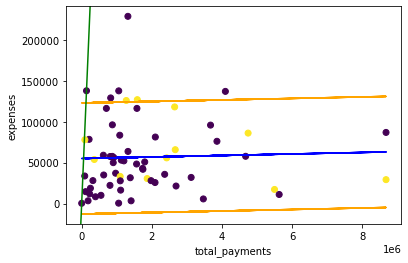

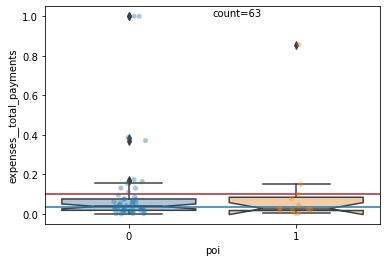

In [28]:
plot_ratios_to_x(data=test_X_train, feats=pay_features,
                 x_pos=len(pay_features)-1, labels=test_y_train)

Financial ratios aren't necessarily very telling. deferral_payments__total_payments has significantly different medians between target classes, but the POI points are so few.
Expenses seem very insignificant.

It's tempting to remove Frevert since he pulls the data so far out, but the model needs to be able to handle CEOs and find a way to differentiate. And, actually, it looks like it might be able to, looking at bonus:total regression vs. salary:total for instance. Frevert's univariate outlierness often falls right in line with a linear regression. The set is small, and I'm reluctant to lose data points, and I don't want to top code him for the reasons already expressed.

But, I'll try it just to see, top coding total_payments to the second highest POI value in the training set. Top code other in the same way to maintain that ratio/regression character. Also, top code long_term_incentive and deferred_income.

Not sure it helped salary__total_payments.
Maybe hurt bonus__total_payments POI recall.
Maybe hurt long_term_incentive__total_payments POI recall.
Not sure it helped deferred_income__total_payments.
Not sure it helped the deferral_payments__total_payments regression, but the ratio as a feature places POIs farther below median and mean.
Maybe slightly helped other__total_payments regression with nonPOI precision, without really changing the ratio distribution.
No real effect on expenses__total_payments, which is a dumb feature anyway.

I will go ahead and make those fixes since it doesn't seem too harmful if at all and does seem to follow best practices. Doing so doesn't seem to hurt the ratios themselves.

In [29]:
top = X_train['total_payments'].dropna().sort_values()[-2]
X_train['total_payments'] = X_train['total_payments']\
                                        .apply(lambda x : \
                                        x if x < top or np.isnan(x) else top)
top = X_train['other'].dropna().sort_values()[-2]
X_train['other'] = X_train['other']\
                                        .apply(lambda x : \
                                        x if x < top or np.isnan(x) \
                                        else top)
top = X_train['long_term_incentive'].dropna().sort_values()[-2]
X_train['long_term_incentive'] = X_train['long_term_incentive']\
                                        .apply(lambda x : \
                                        x if x < top or np.isnan(x) \
                                        else top)
y_train = y_train.copy()
### Same story as Powers, NaN all of Belfer instead of simply dropping.
X_train.loc['BELFER ROBERT'] = np.nan

All in all, some of these ratios divide the set into interesting clusters that look like they may aid classification, if at least nonPOI precision:
shared_receipt_with_poi:to_messages
from_this_person_to_poi:from_messages
other:total_payments
salary:total_payments

I am curious about some of the other ratios. Do them all?

bonus__salary


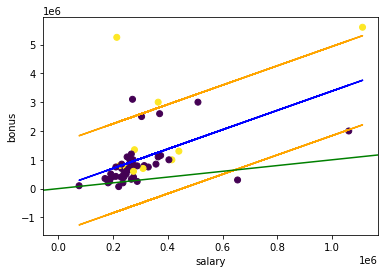

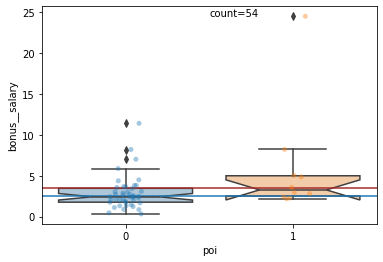

long_term_incentive__salary


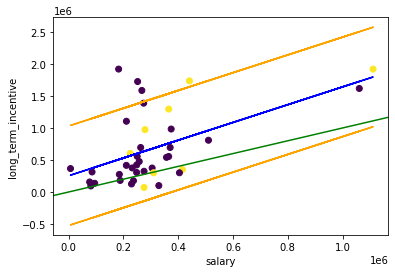

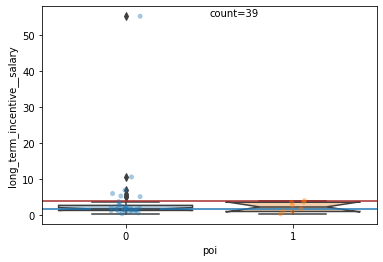

deferred_income__salary


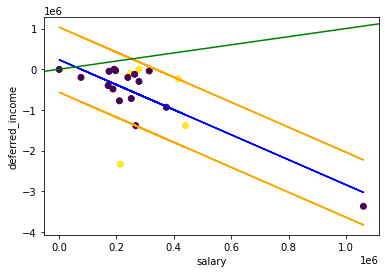

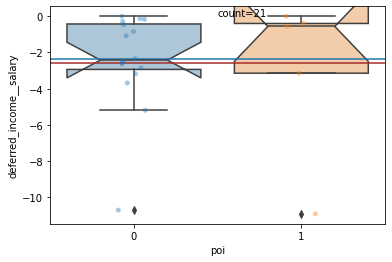

deferral_payments__salary


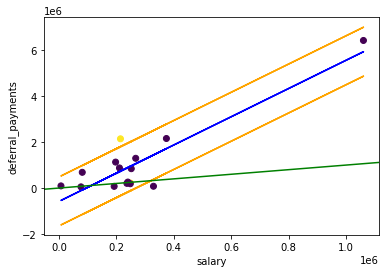

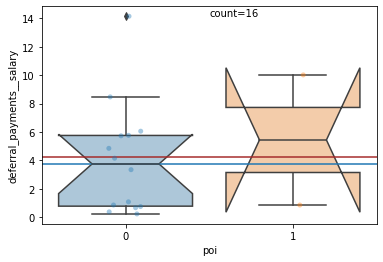

other__salary


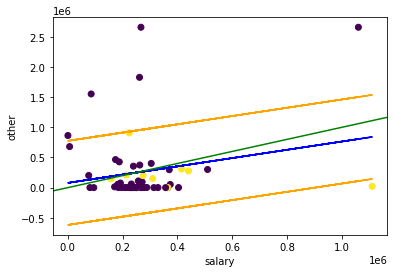

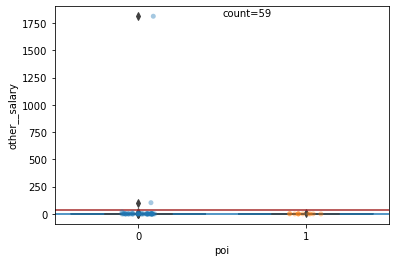

expenses__salary


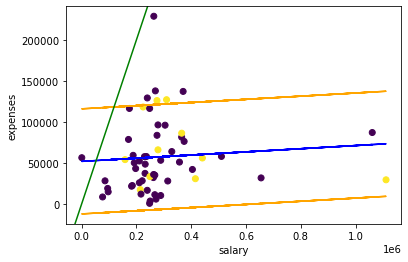

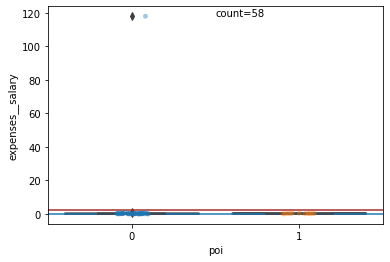

total_payments__salary


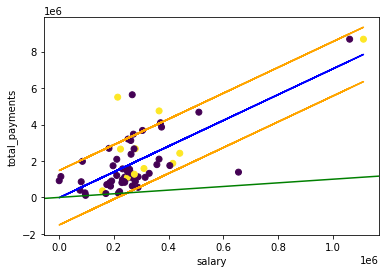

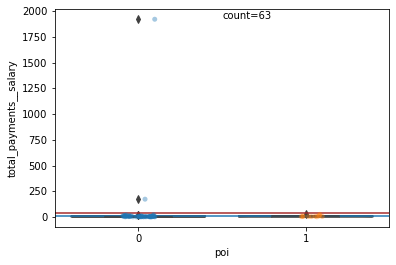

exercised_stock_options__salary


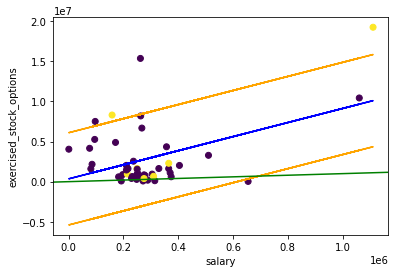

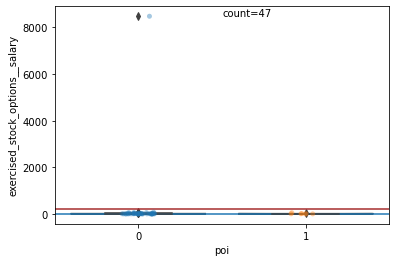

restricted_stock__salary


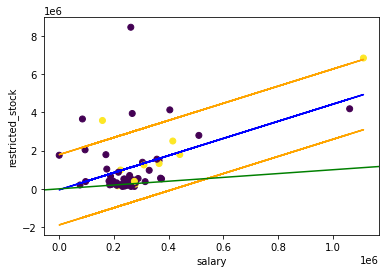

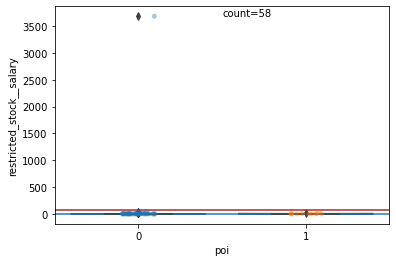

total_stock_value__salary


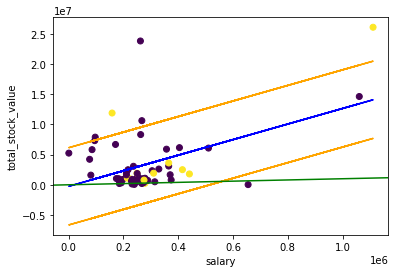

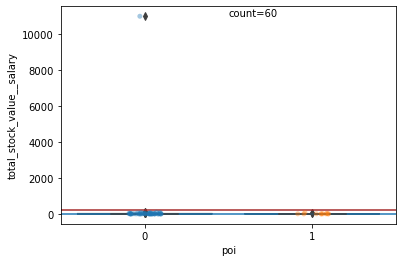

to_messages__salary


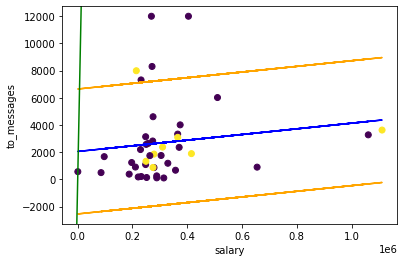

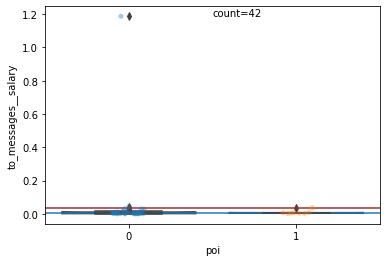

from_poi_to_this_person__salary


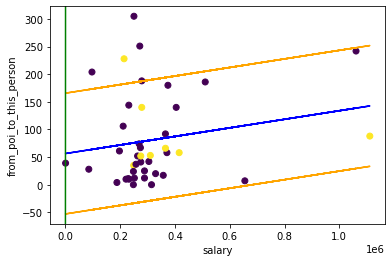

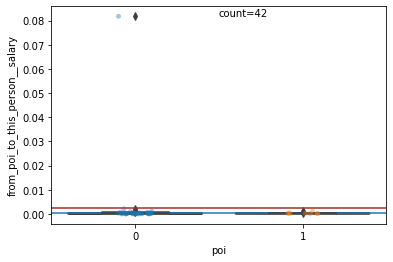

from_messages__salary


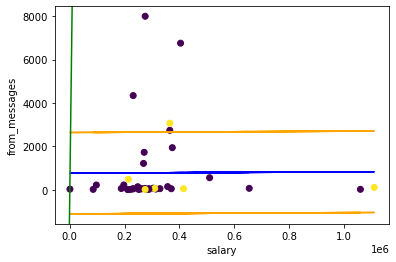

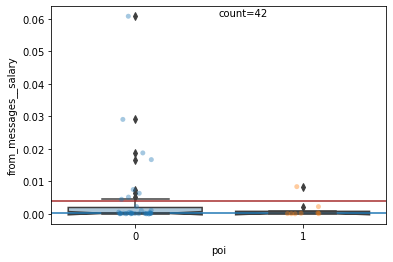

from_this_person_to_poi__salary


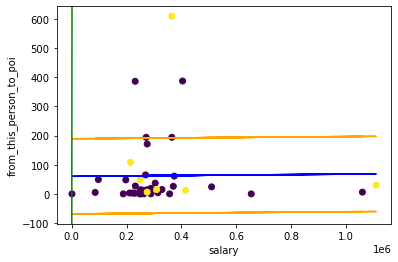

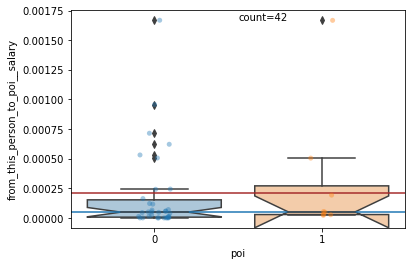

shared_receipt_with_poi__salary


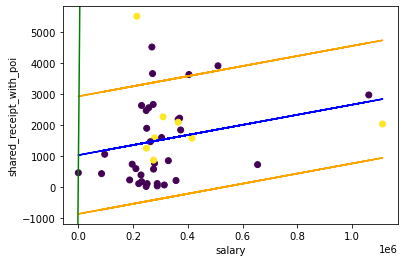

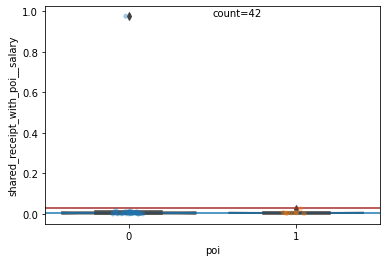

salary__bonus


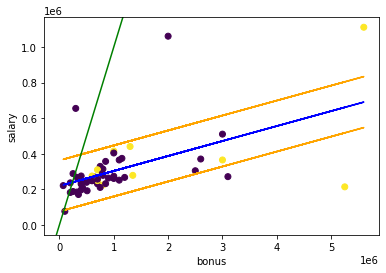

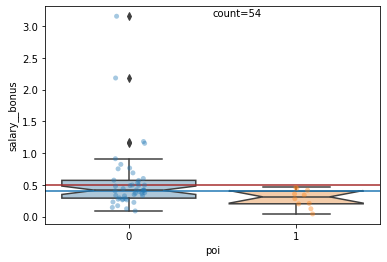

long_term_incentive__bonus


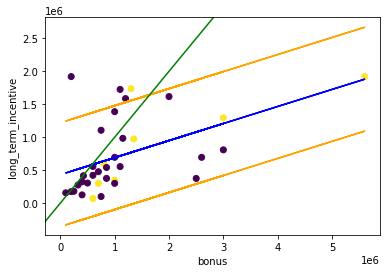

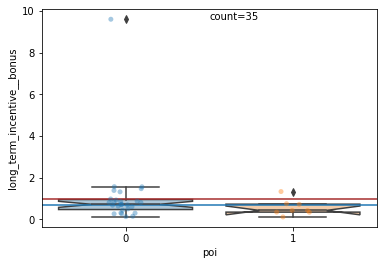

deferred_income__bonus


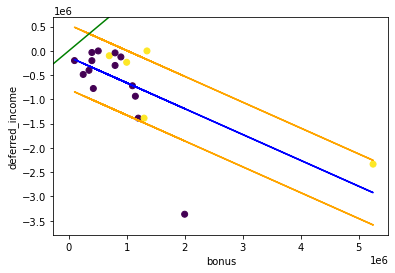

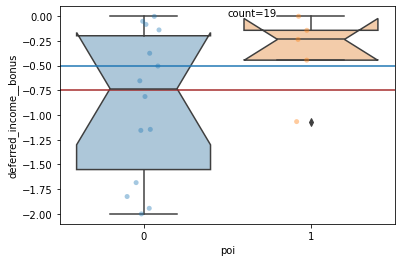

deferral_payments__bonus


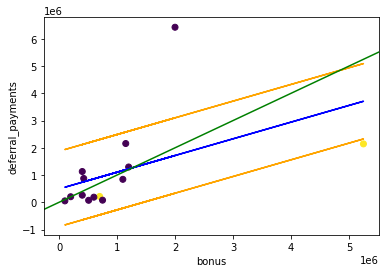

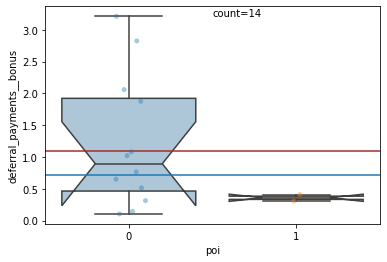

other__bonus


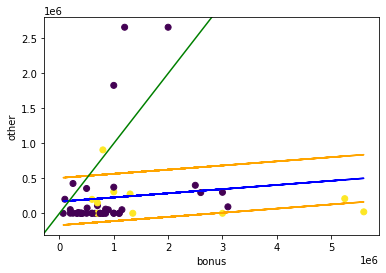

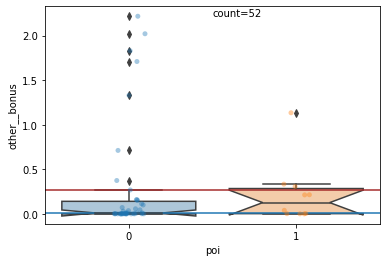

expenses__bonus


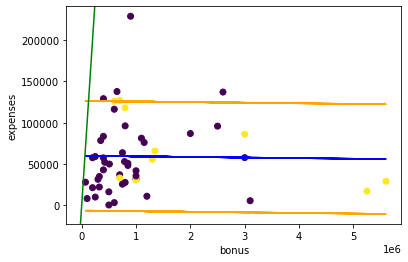

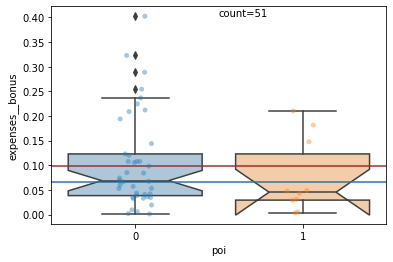

total_payments__bonus


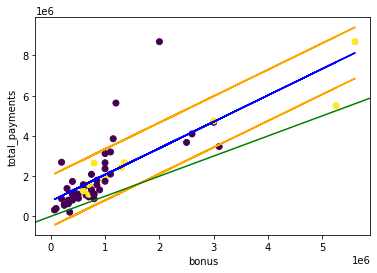

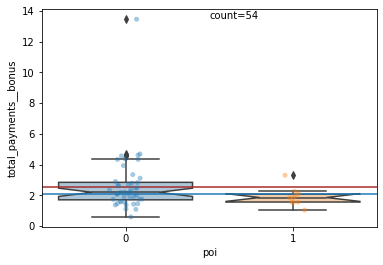

exercised_stock_options__bonus


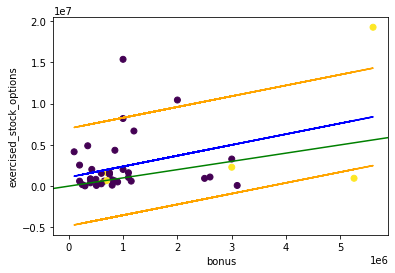

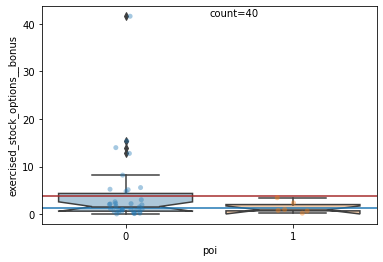

restricted_stock__bonus


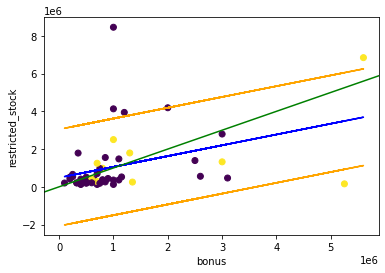

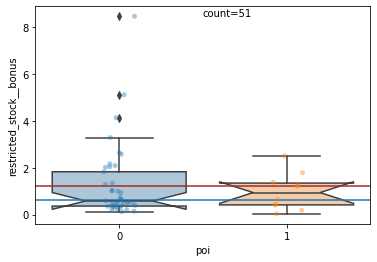

total_stock_value__bonus


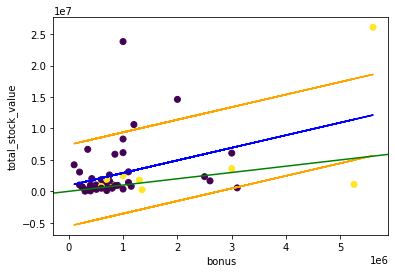

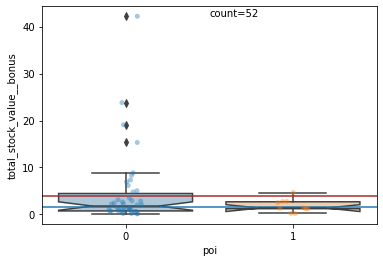

to_messages__bonus


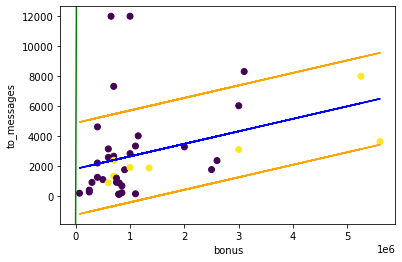

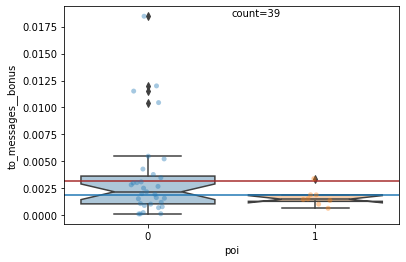

from_poi_to_this_person__bonus


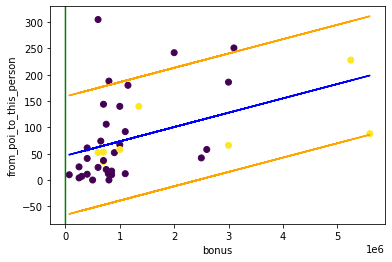

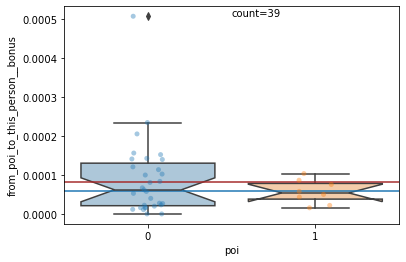

from_messages__bonus


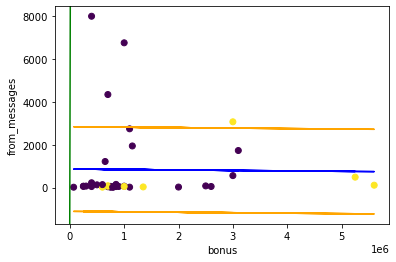

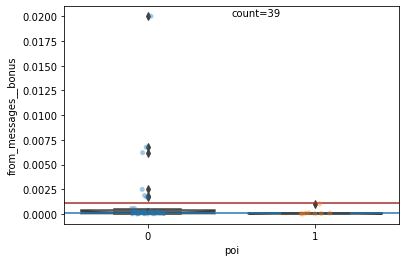

from_this_person_to_poi__bonus


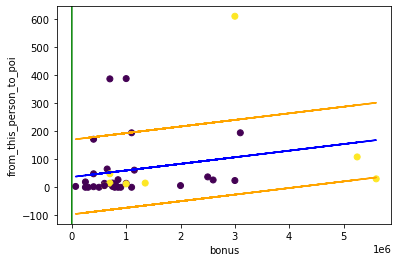

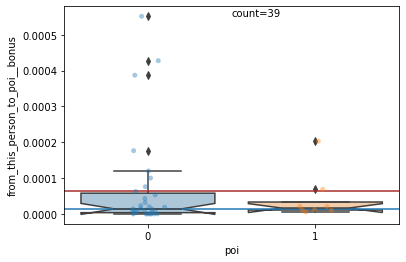

shared_receipt_with_poi__bonus


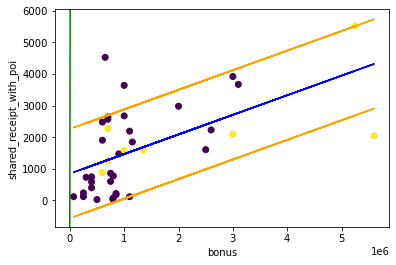

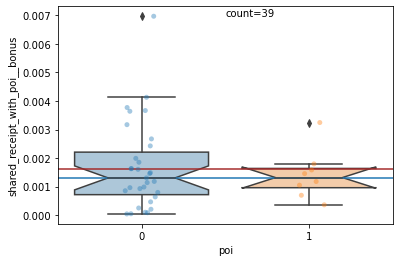

salary__long_term_incentive


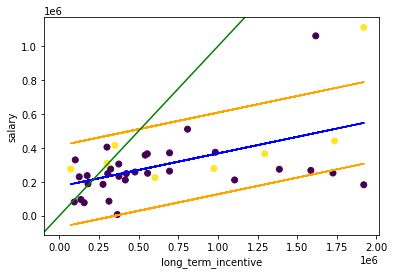

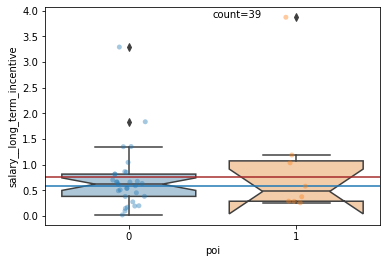

bonus__long_term_incentive


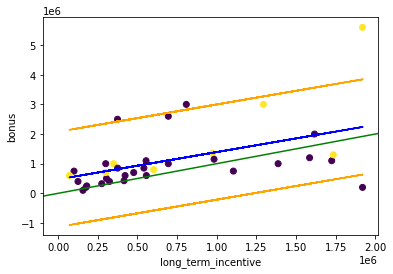

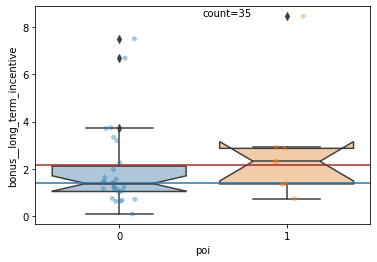

deferred_income__long_term_incentive


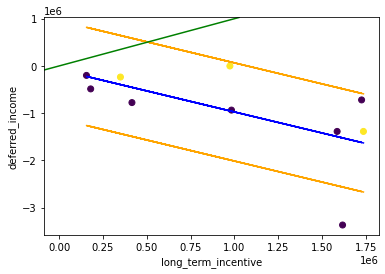

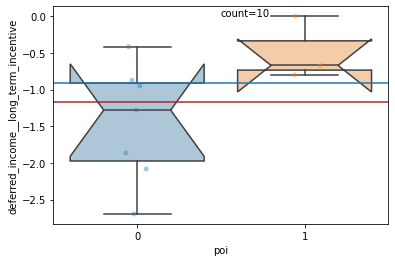

deferral_payments__long_term_incentive


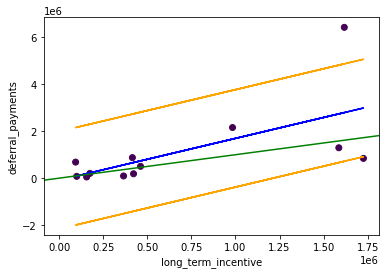

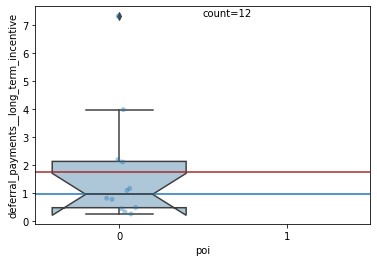

other__long_term_incentive


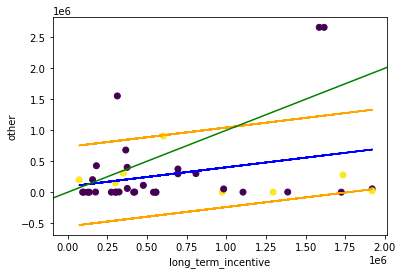

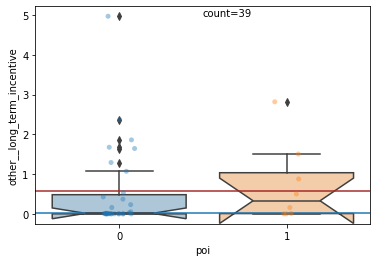

expenses__long_term_incentive


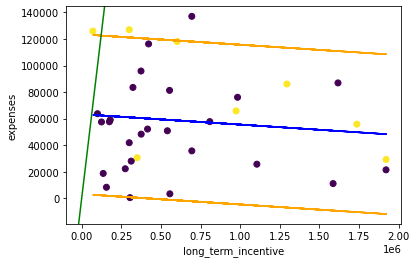

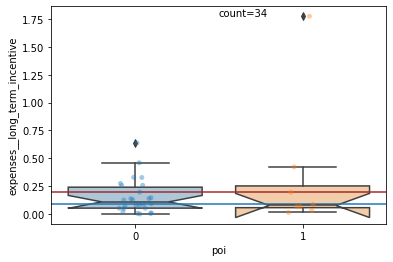

total_payments__long_term_incentive


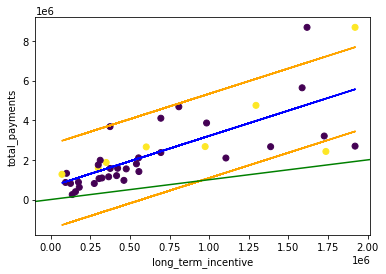

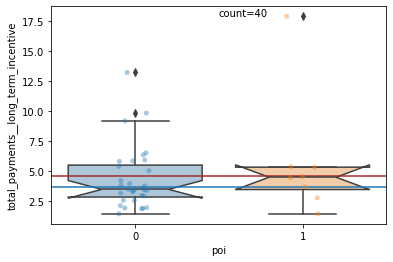

exercised_stock_options__long_term_incentive


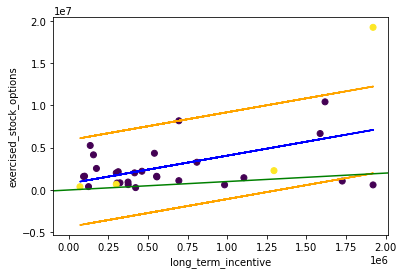

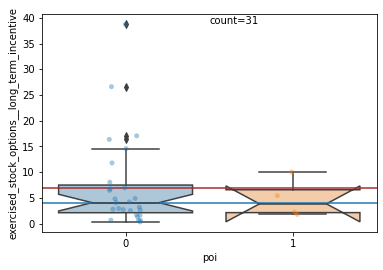

restricted_stock__long_term_incentive


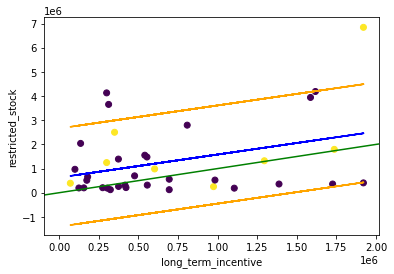

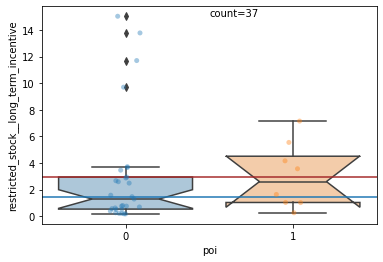

total_stock_value__long_term_incentive


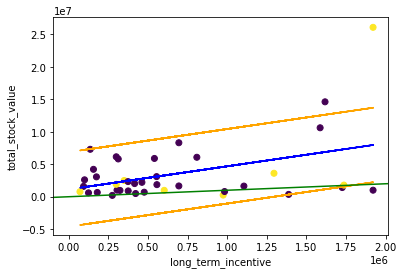

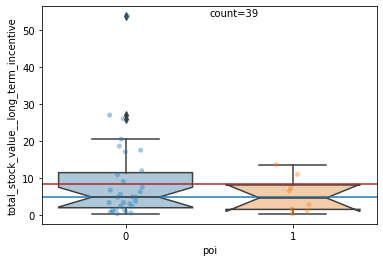

to_messages__long_term_incentive


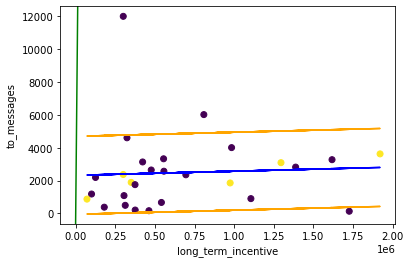

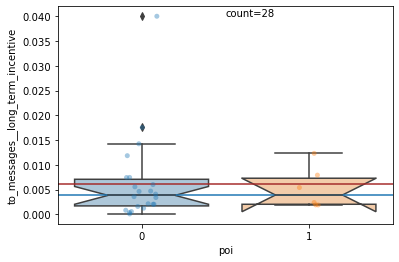

from_poi_to_this_person__long_term_incentive


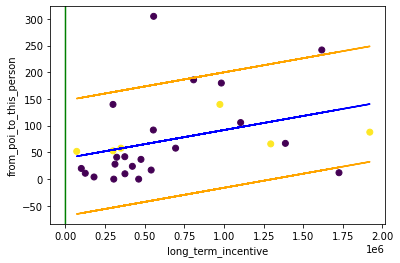

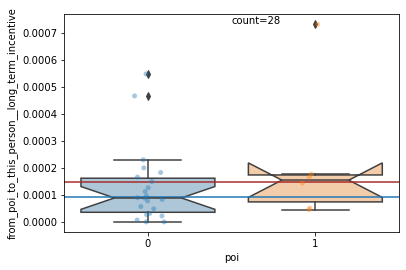

from_messages__long_term_incentive


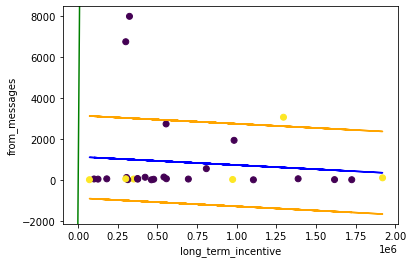

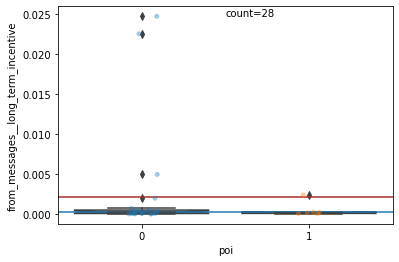

from_this_person_to_poi__long_term_incentive


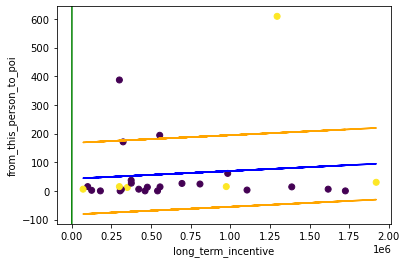

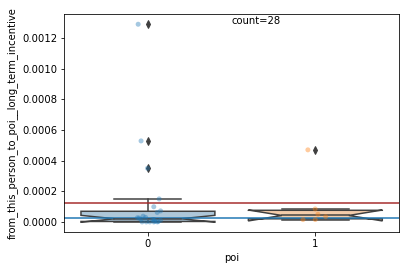

shared_receipt_with_poi__long_term_incentive


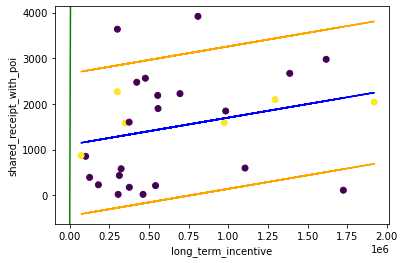

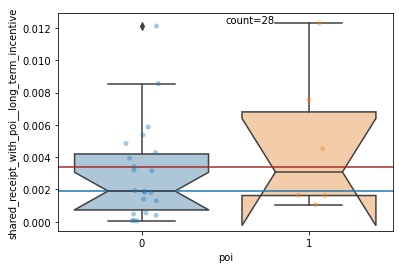

salary__deferred_income


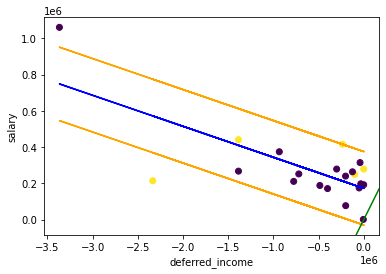

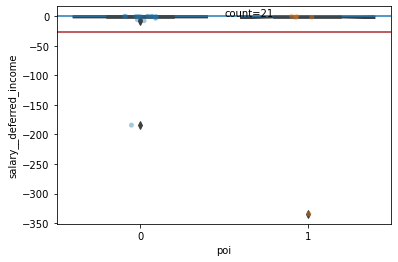

bonus__deferred_income


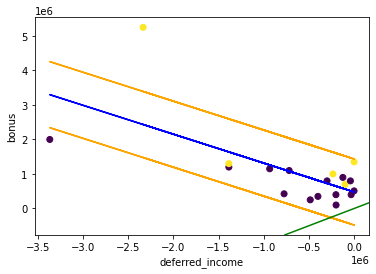

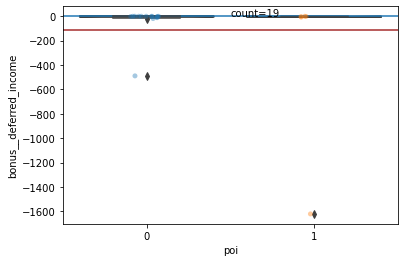

long_term_incentive__deferred_income


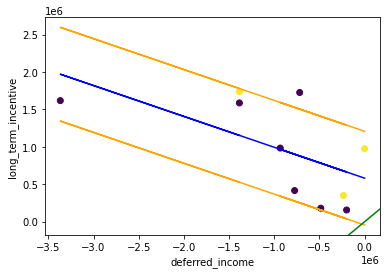

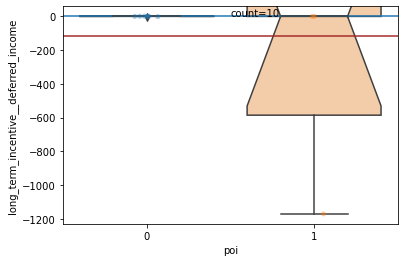

deferral_payments__deferred_income


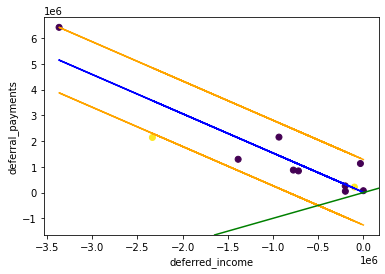

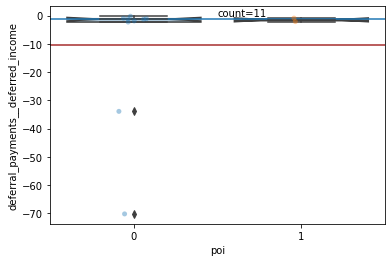

other__deferred_income


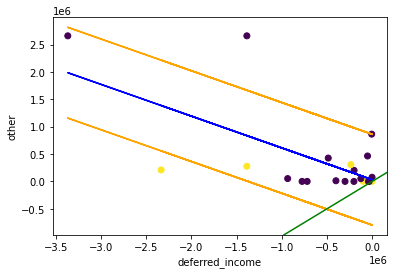

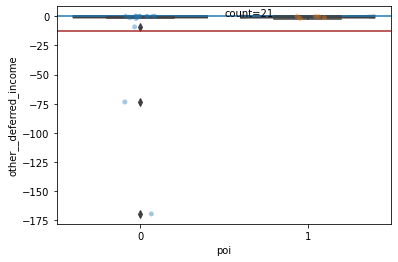

expenses__deferred_income


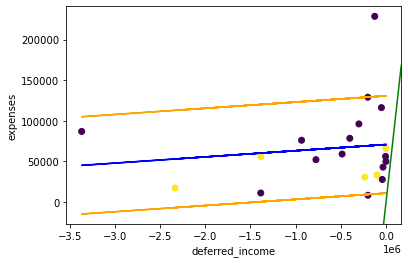

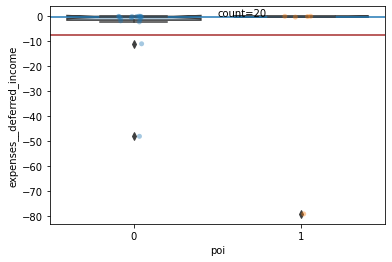

total_payments__deferred_income


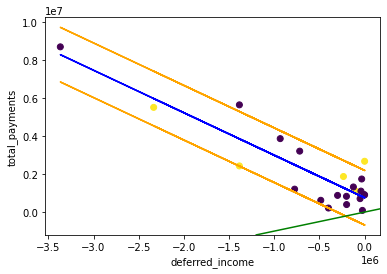

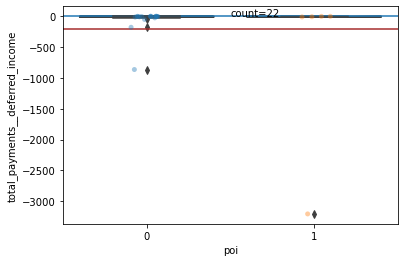

exercised_stock_options__deferred_income


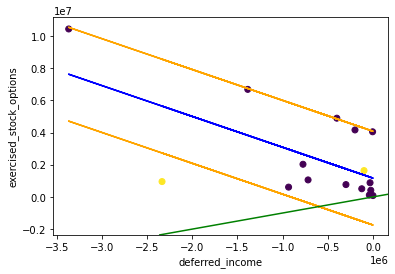

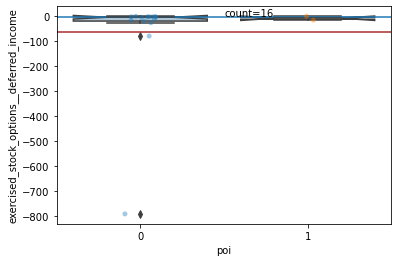

restricted_stock__deferred_income


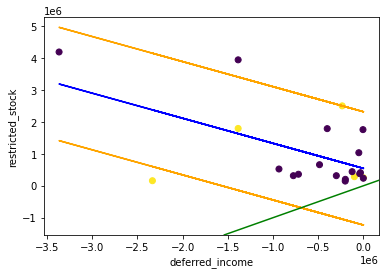

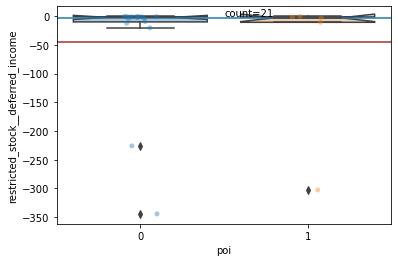

total_stock_value__deferred_income


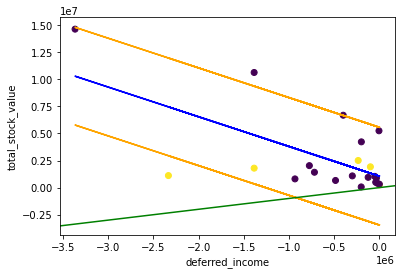

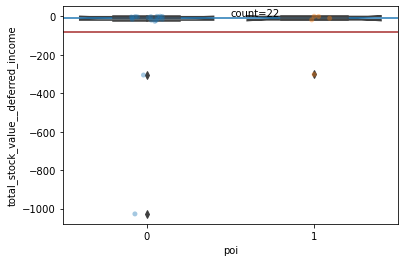

to_messages__deferred_income


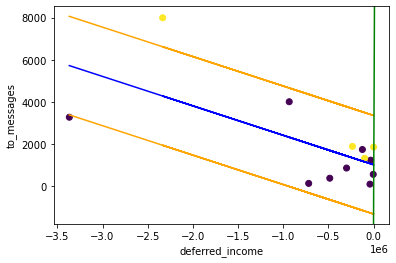

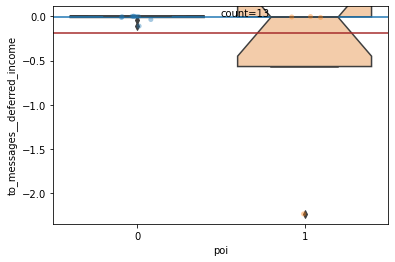

from_poi_to_this_person__deferred_income


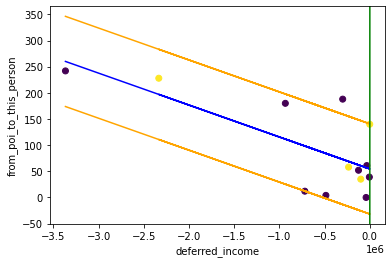

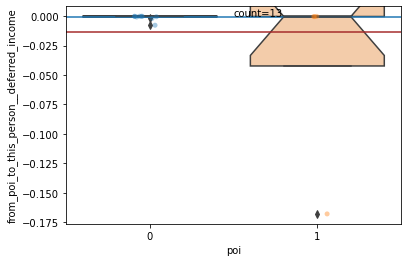

from_messages__deferred_income


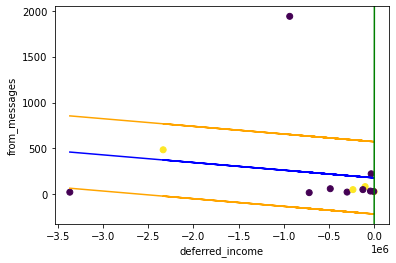

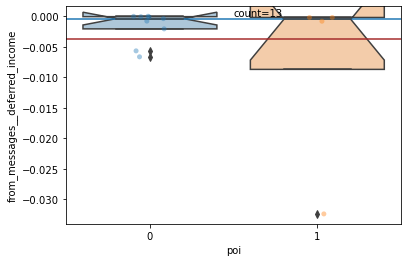

from_this_person_to_poi__deferred_income


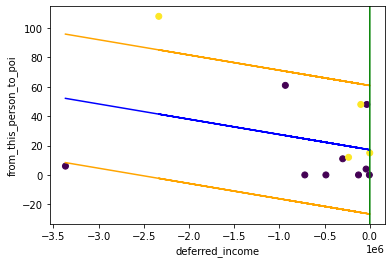

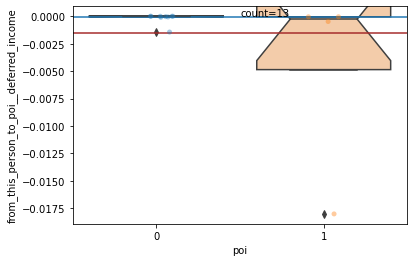

shared_receipt_with_poi__deferred_income


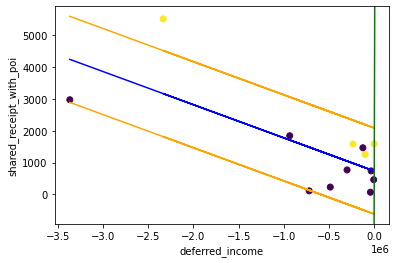

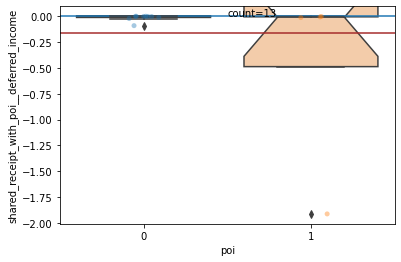

salary__deferral_payments


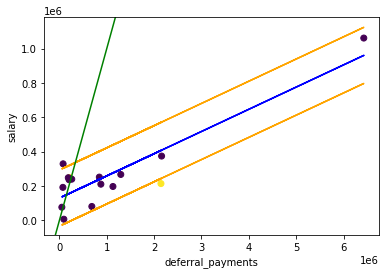

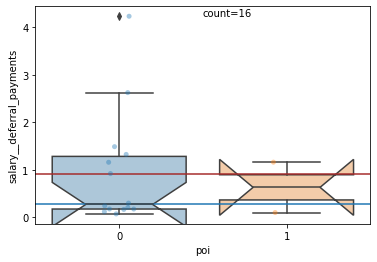

bonus__deferral_payments


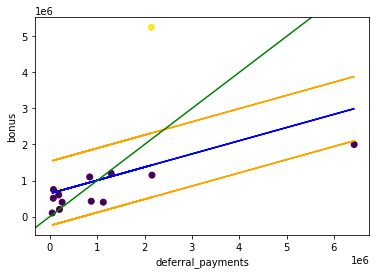

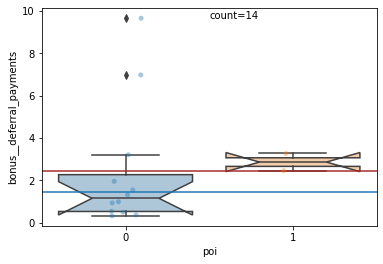

long_term_incentive__deferral_payments


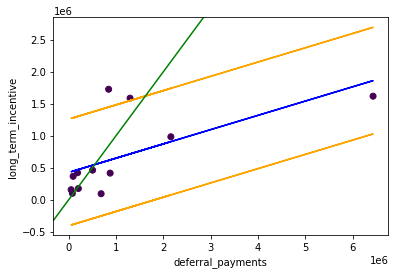

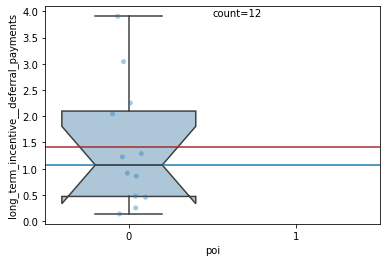

deferred_income__deferral_payments


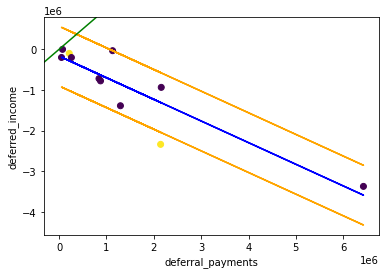

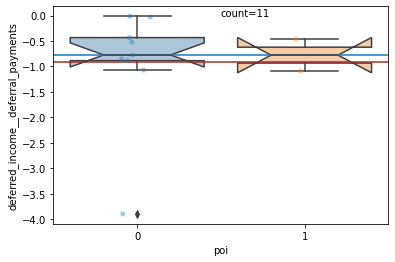

other__deferral_payments


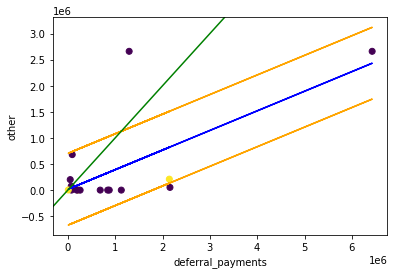

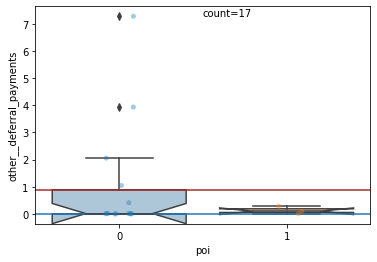

expenses__deferral_payments


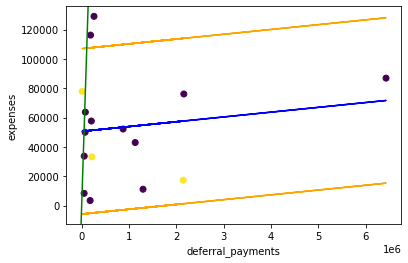

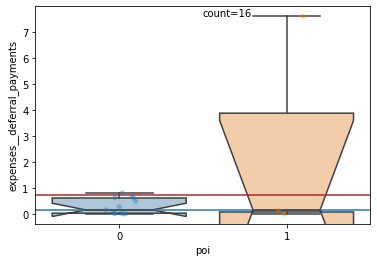

total_payments__deferral_payments


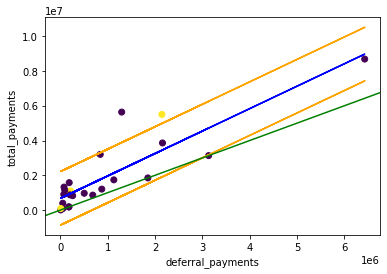

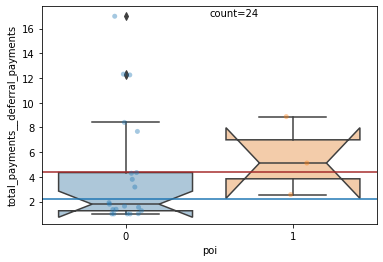

exercised_stock_options__deferral_payments


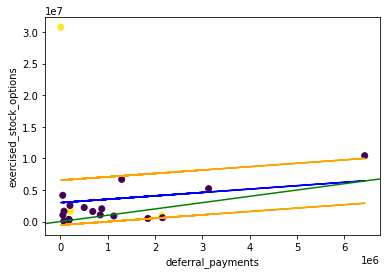

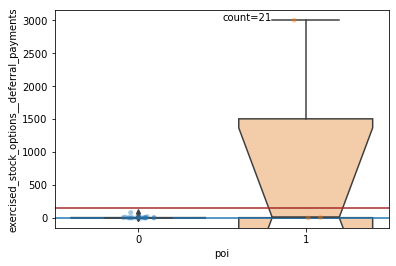

restricted_stock__deferral_payments


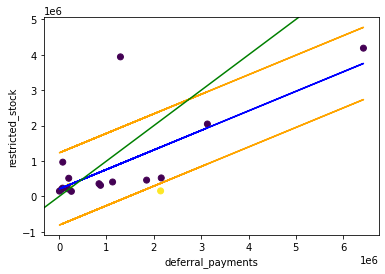

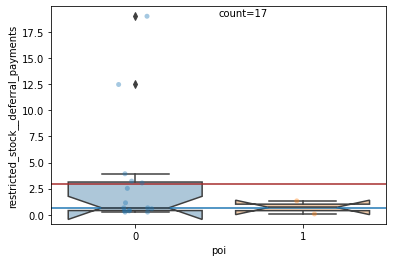

total_stock_value__deferral_payments


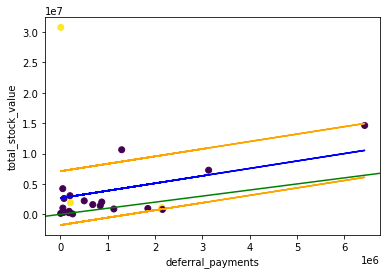

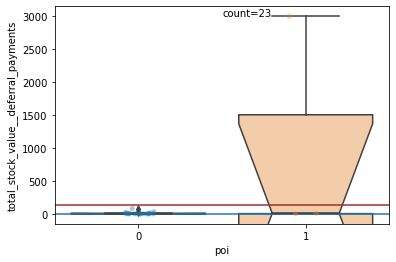

to_messages__deferral_payments


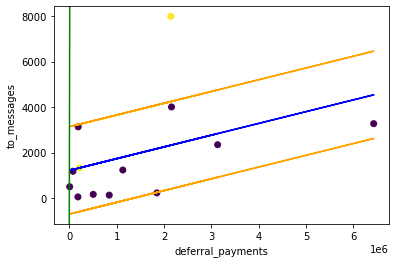

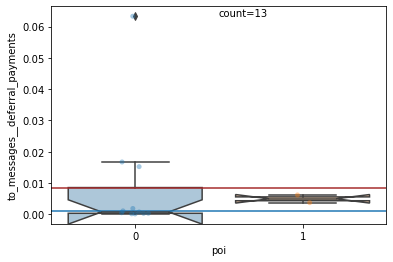

from_poi_to_this_person__deferral_payments


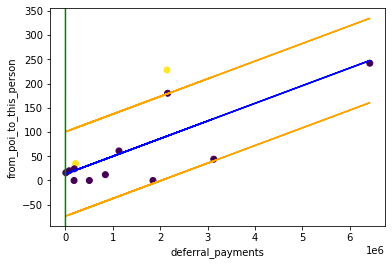

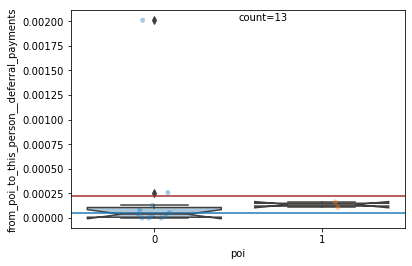

from_messages__deferral_payments


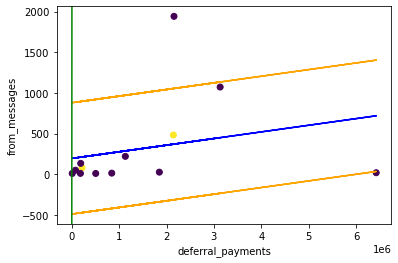

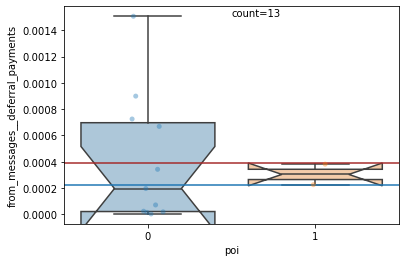

from_this_person_to_poi__deferral_payments


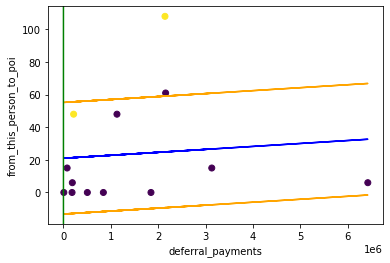

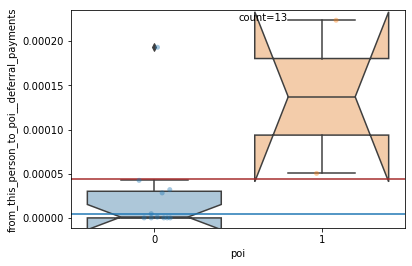

shared_receipt_with_poi__deferral_payments


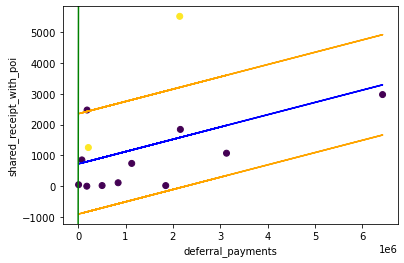

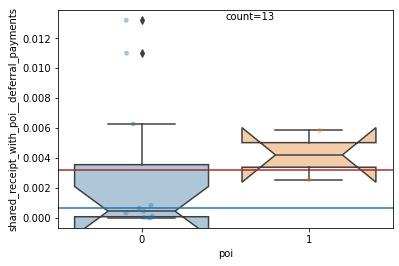

salary__other


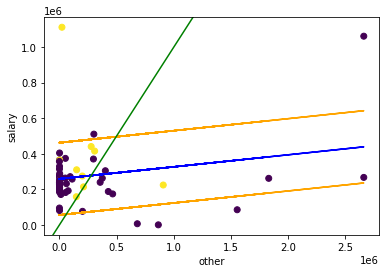

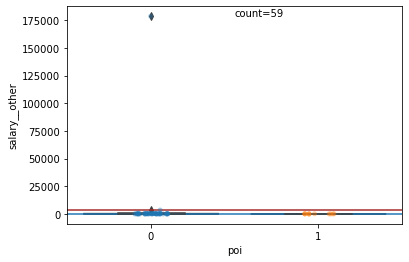

bonus__other


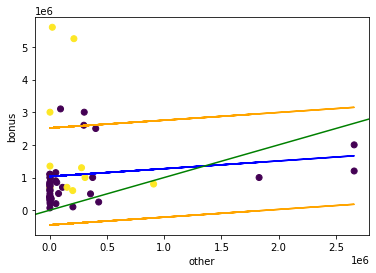

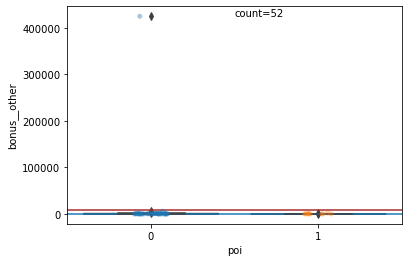

long_term_incentive__other


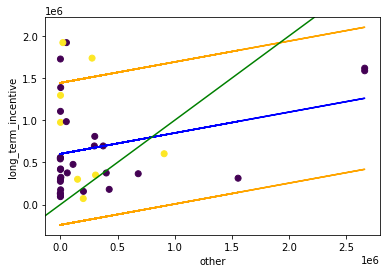

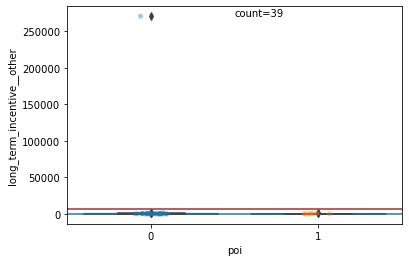

deferred_income__other


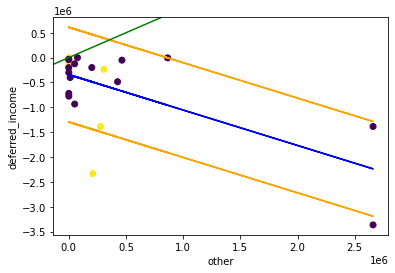

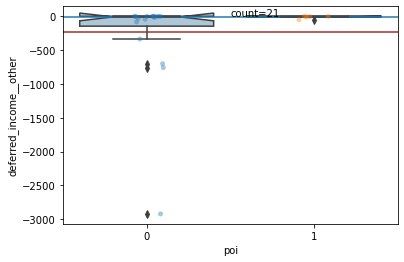

deferral_payments__other


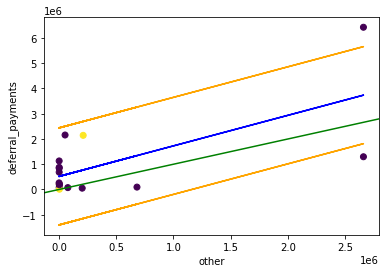

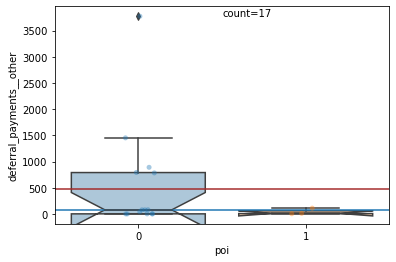

expenses__other


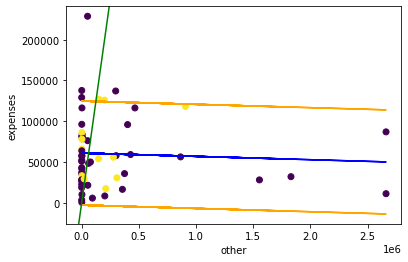

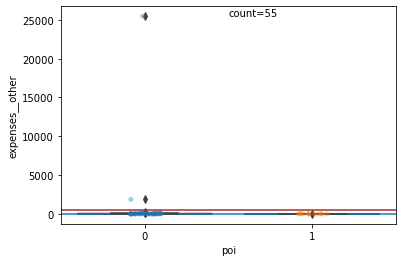

total_payments__other


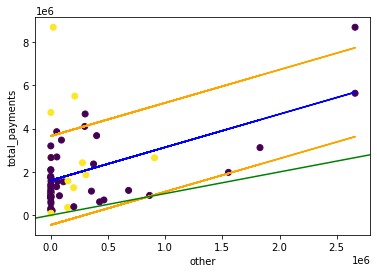

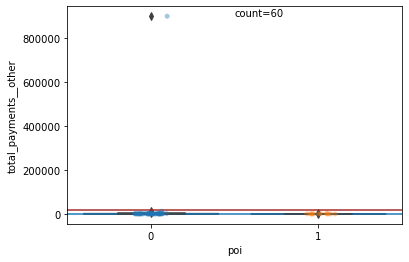

exercised_stock_options__other


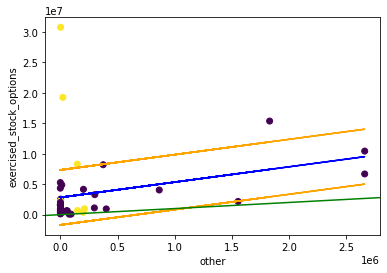

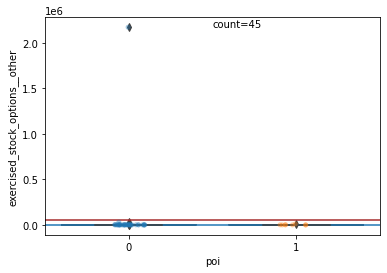

restricted_stock__other


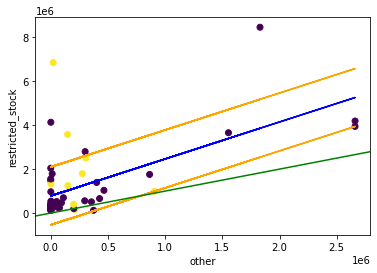

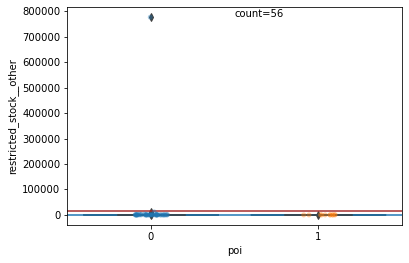

total_stock_value__other


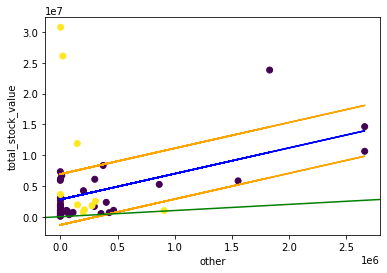

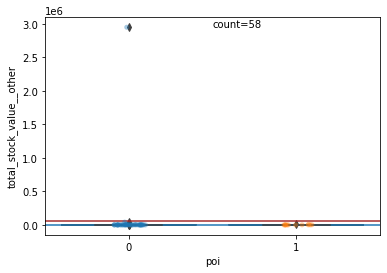

to_messages__other


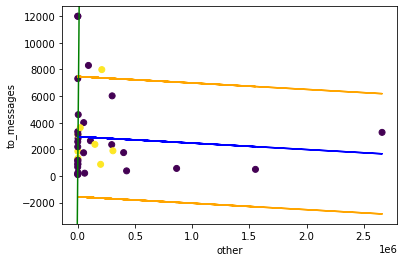

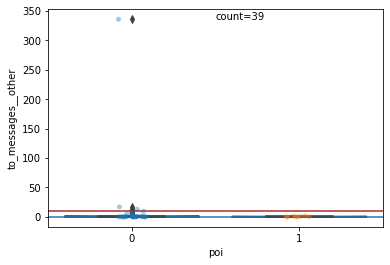

from_poi_to_this_person__other


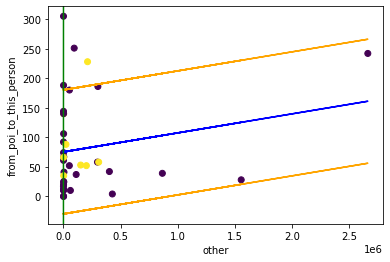

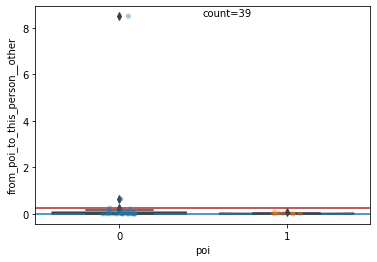

from_messages__other


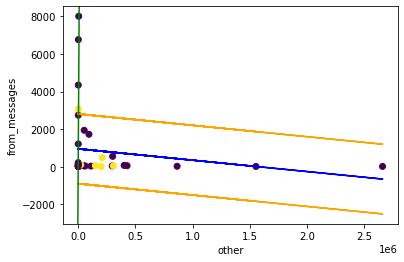

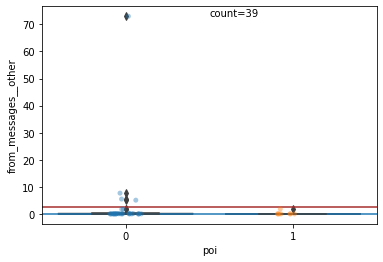

from_this_person_to_poi__other


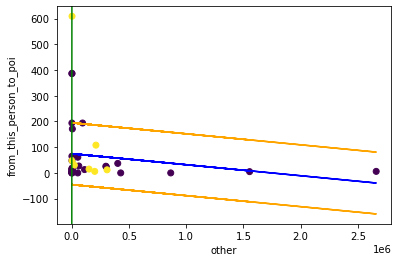

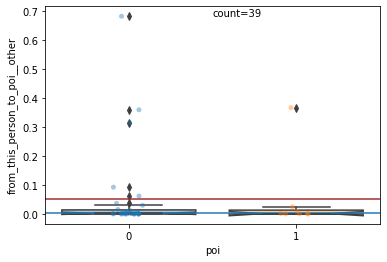

shared_receipt_with_poi__other


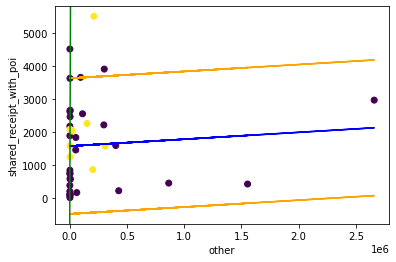

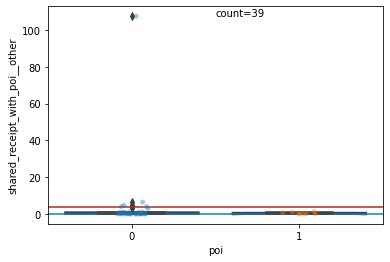

salary__expenses


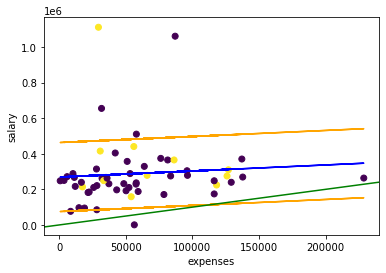

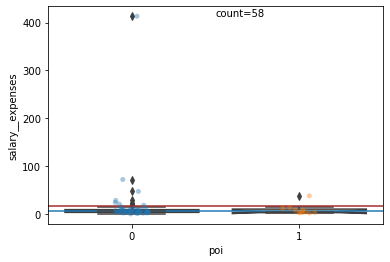

bonus__expenses


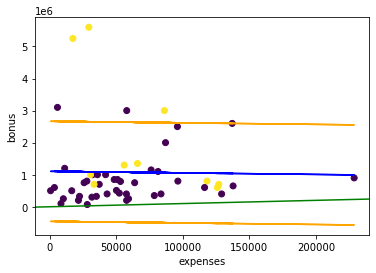

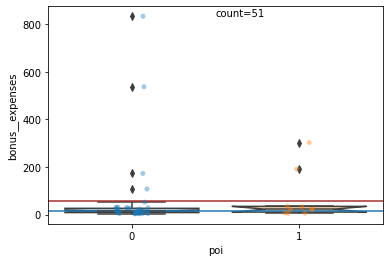

long_term_incentive__expenses


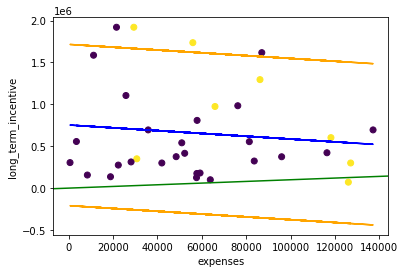

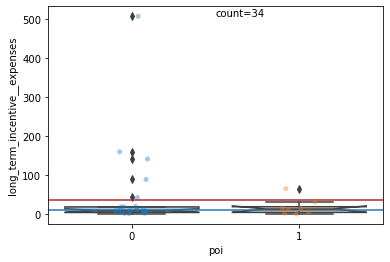

deferred_income__expenses


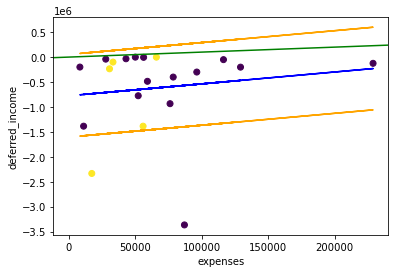

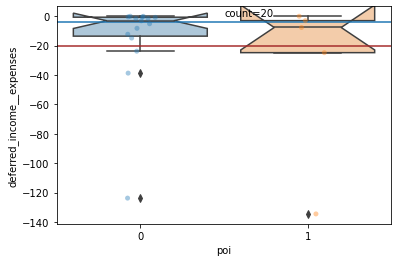

deferral_payments__expenses


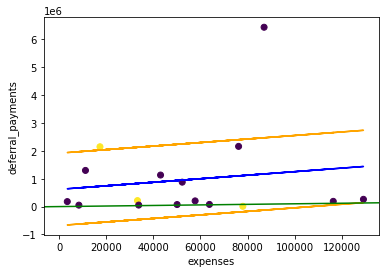

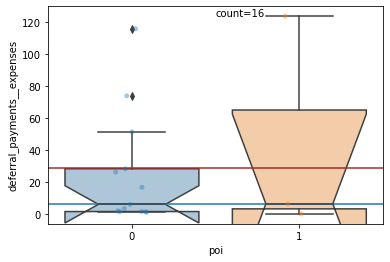

other__expenses


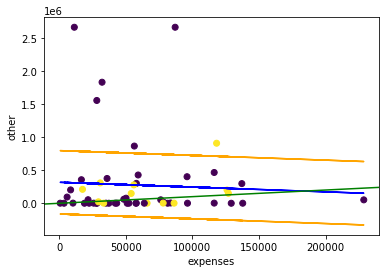

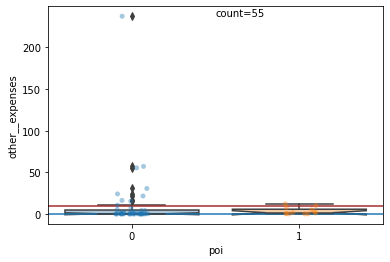

total_payments__expenses


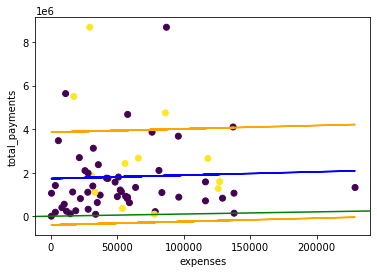

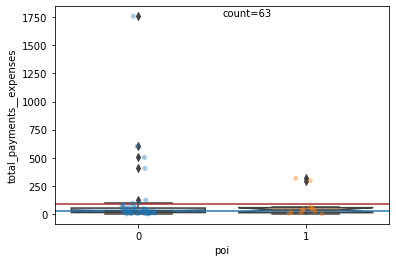

exercised_stock_options__expenses


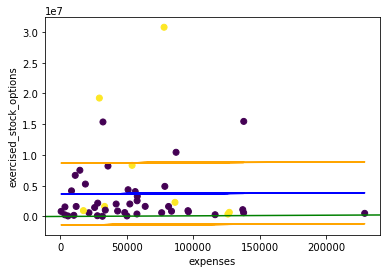

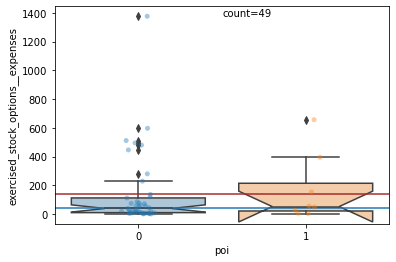

restricted_stock__expenses


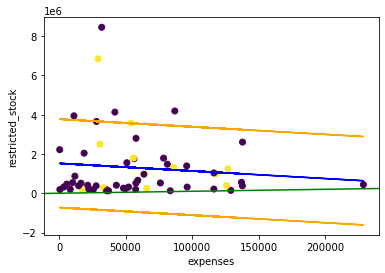

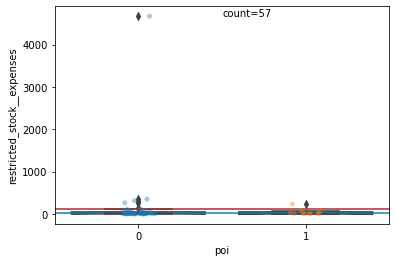

total_stock_value__expenses


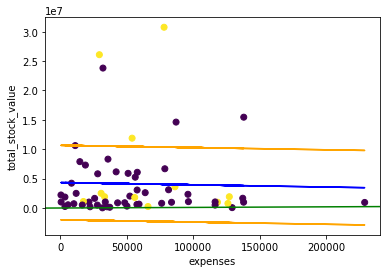

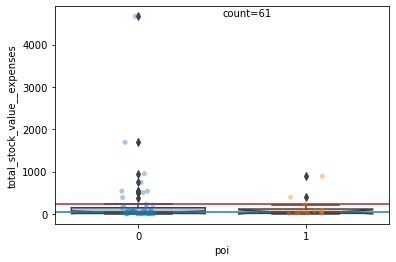

to_messages__expenses


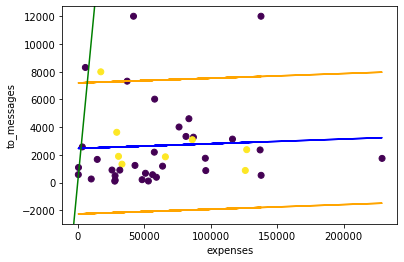

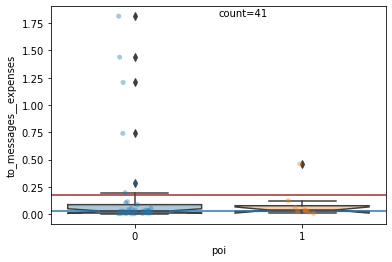

from_poi_to_this_person__expenses


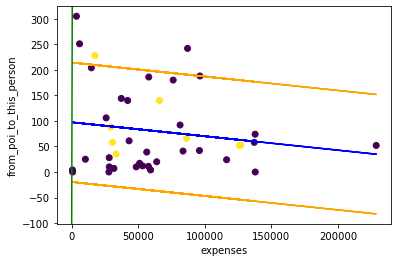

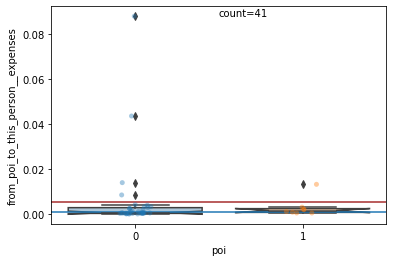

from_messages__expenses


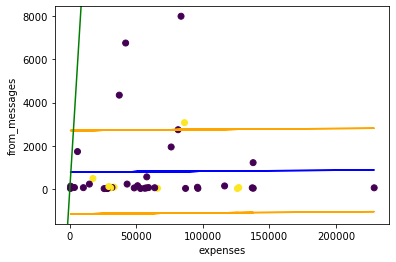

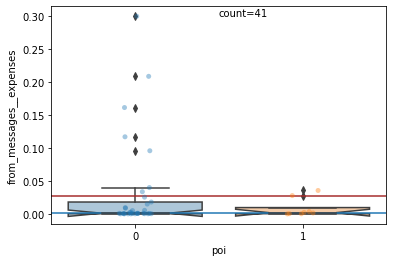

from_this_person_to_poi__expenses


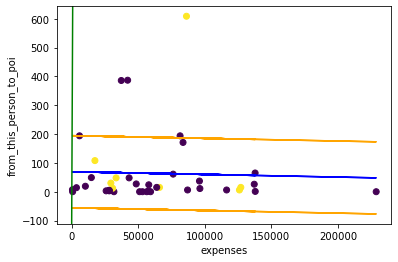

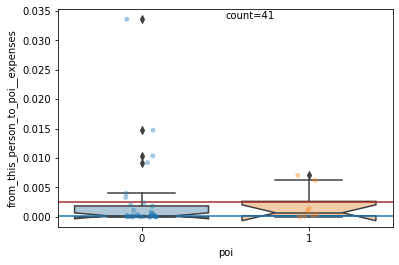

shared_receipt_with_poi__expenses


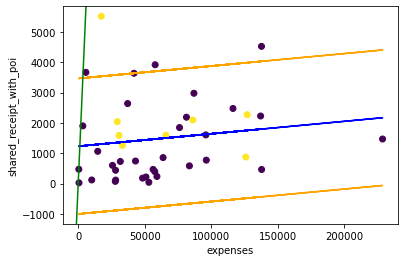

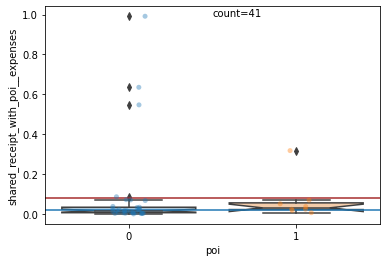

salary__total_payments


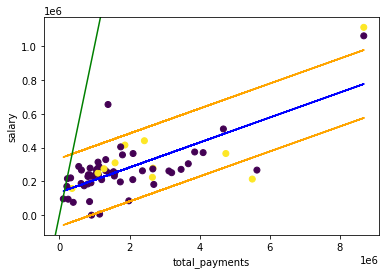

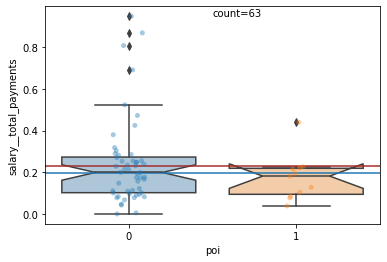

bonus__total_payments


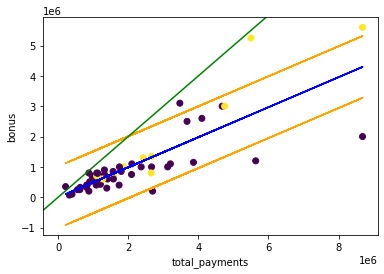

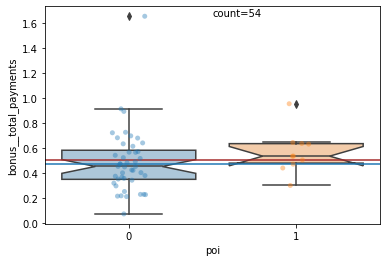

long_term_incentive__total_payments


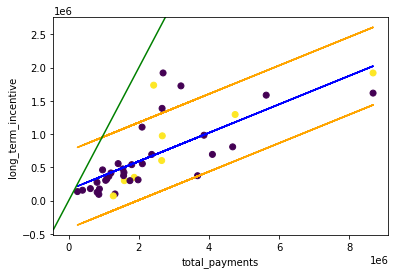

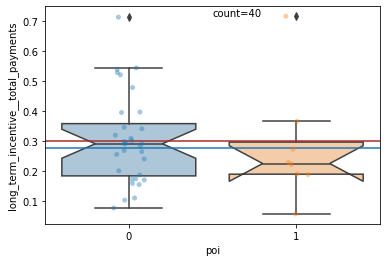

deferred_income__total_payments


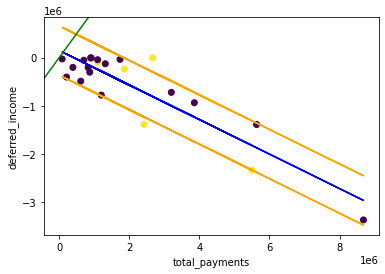

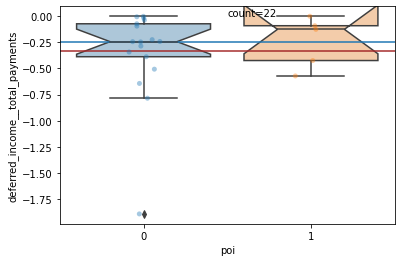

deferral_payments__total_payments


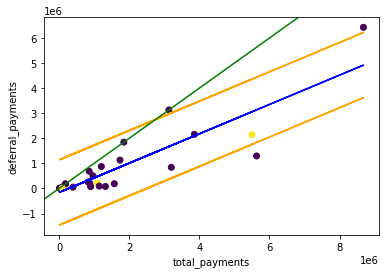

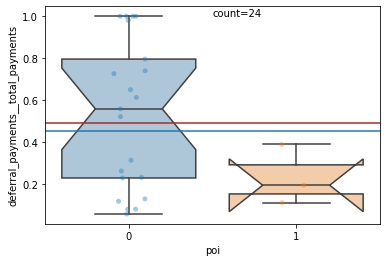

other__total_payments


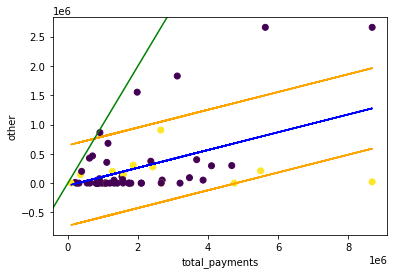

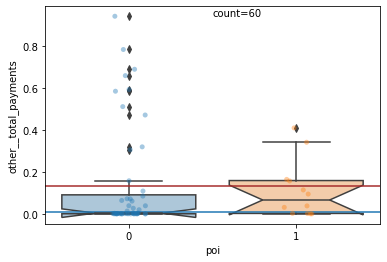

expenses__total_payments


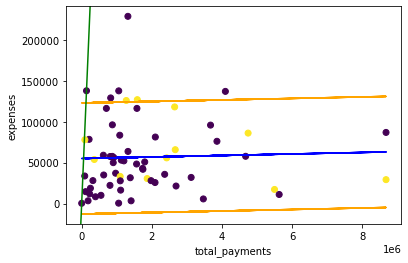

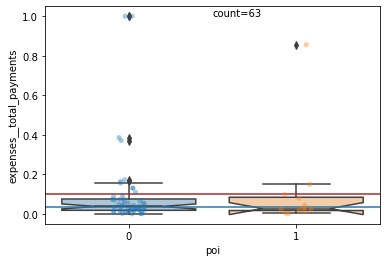

exercised_stock_options__total_payments


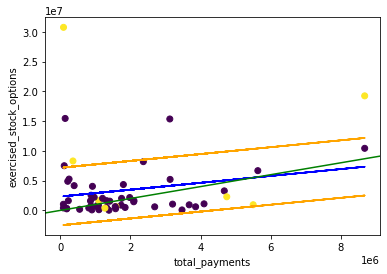

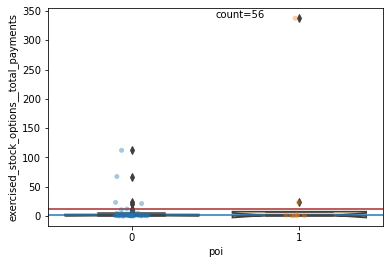

restricted_stock__total_payments


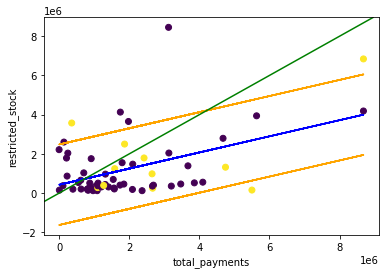

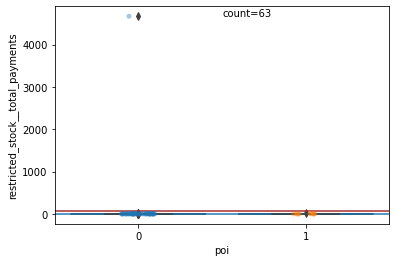

total_stock_value__total_payments


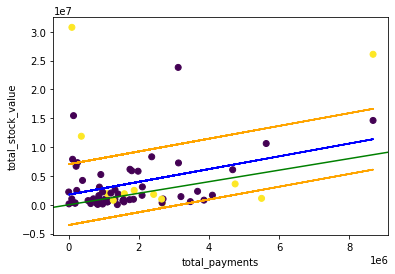

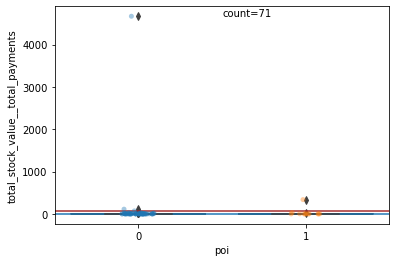

to_messages__total_payments


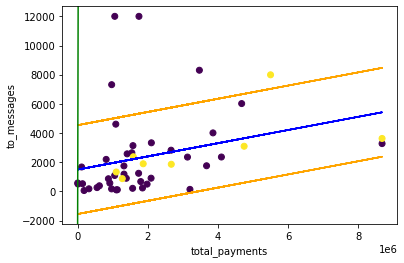

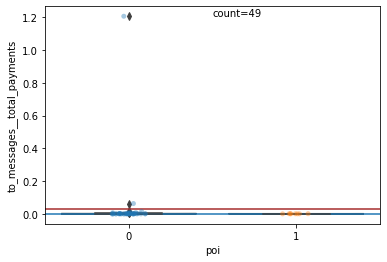

from_poi_to_this_person__total_payments


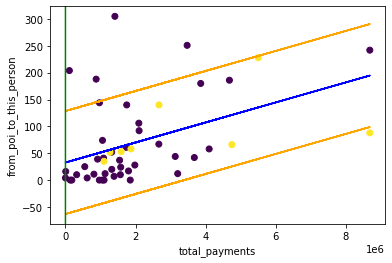

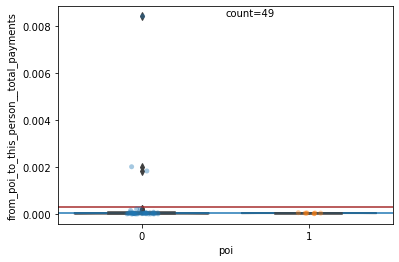

from_messages__total_payments


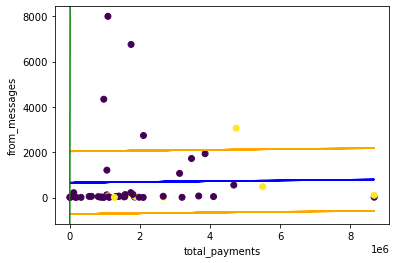

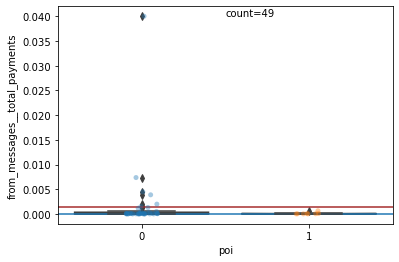

from_this_person_to_poi__total_payments


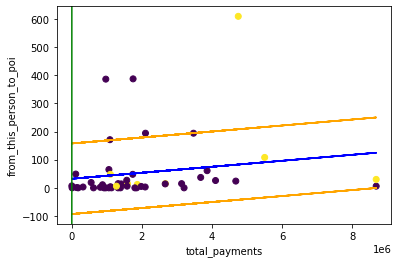

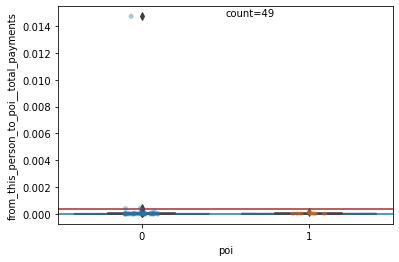

shared_receipt_with_poi__total_payments


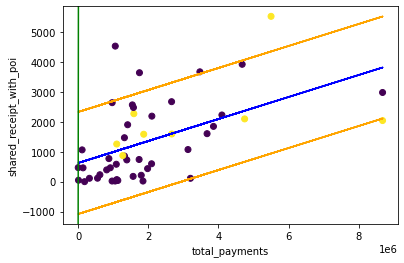

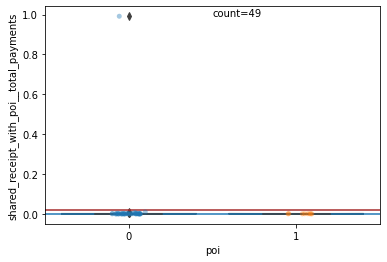

salary__exercised_stock_options


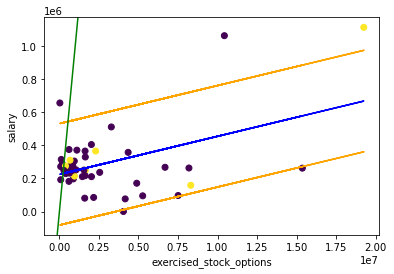

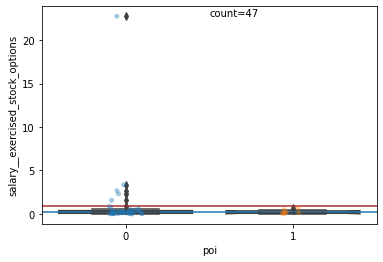

bonus__exercised_stock_options


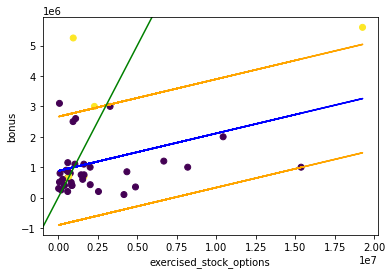

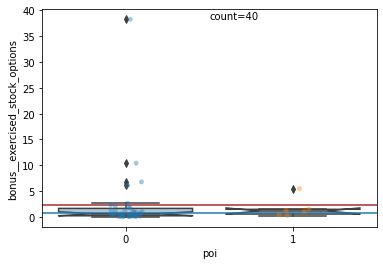

long_term_incentive__exercised_stock_options


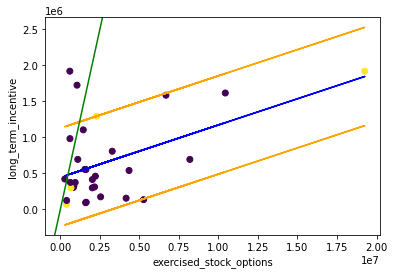

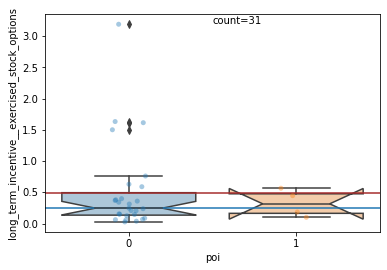

deferred_income__exercised_stock_options


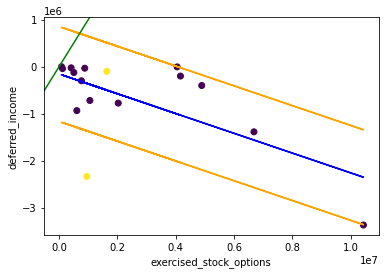

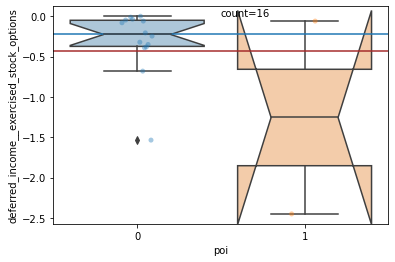

deferral_payments__exercised_stock_options


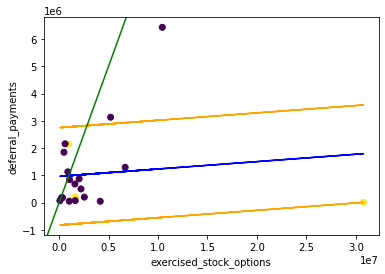

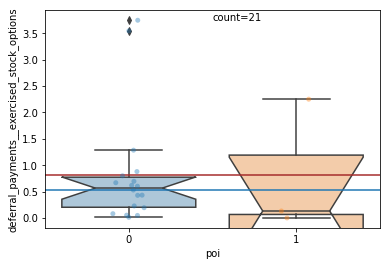

other__exercised_stock_options


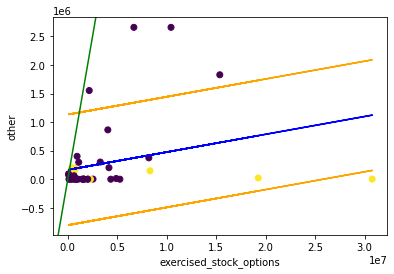

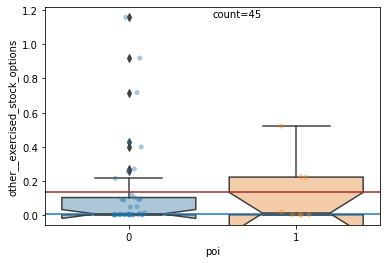

expenses__exercised_stock_options


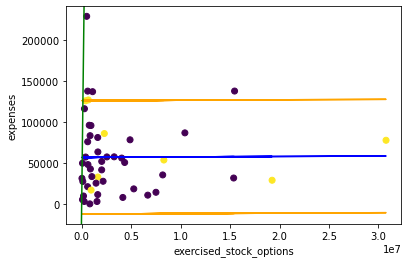

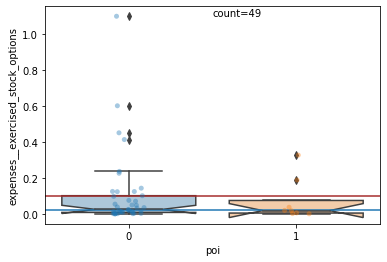

total_payments__exercised_stock_options


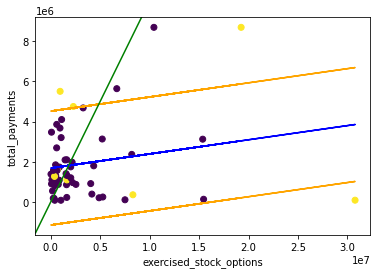

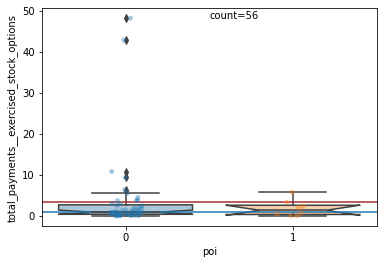

restricted_stock__exercised_stock_options


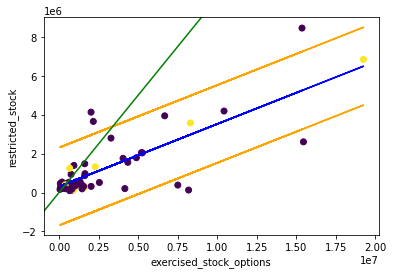

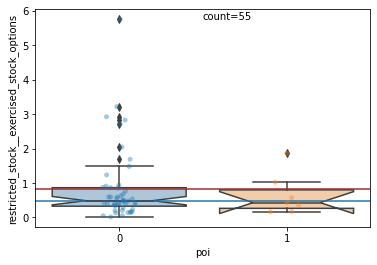

total_stock_value__exercised_stock_options


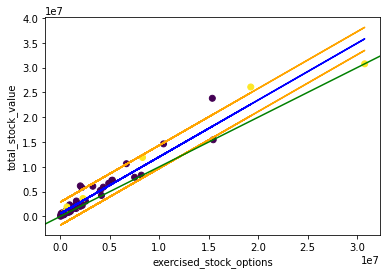

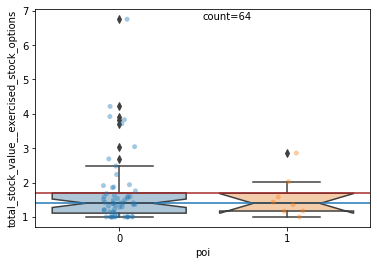

to_messages__exercised_stock_options


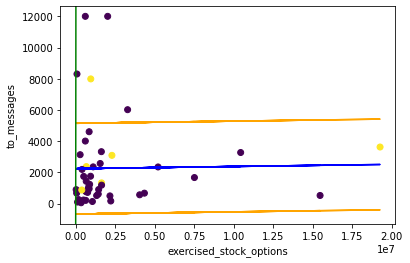

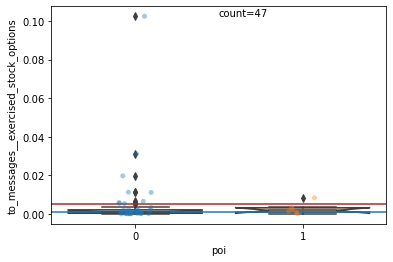

from_poi_to_this_person__exercised_stock_options


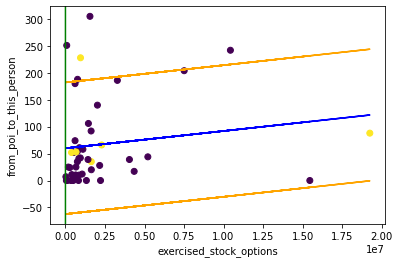

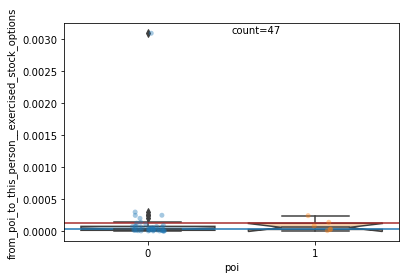

from_messages__exercised_stock_options


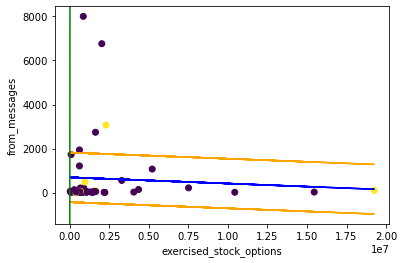

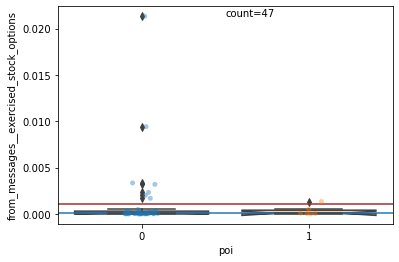

from_this_person_to_poi__exercised_stock_options


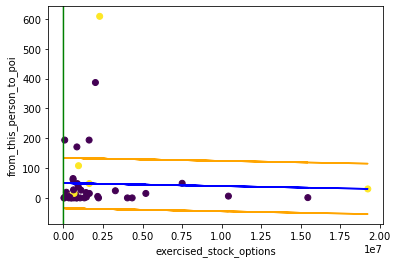

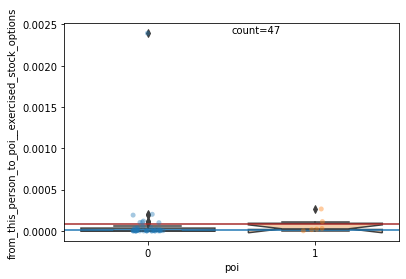

shared_receipt_with_poi__exercised_stock_options


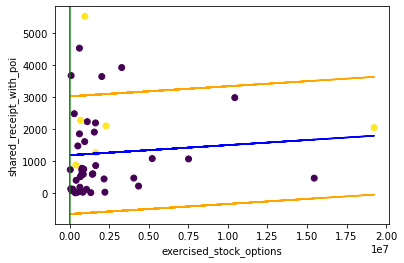

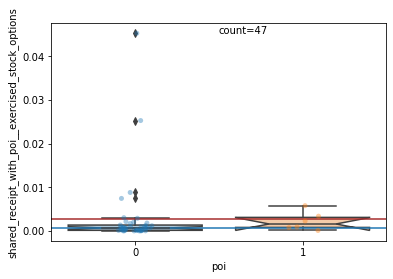

salary__restricted_stock


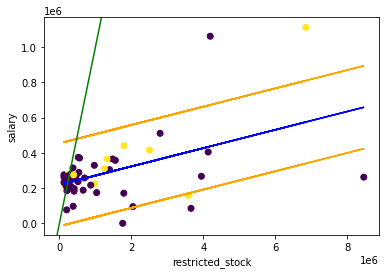

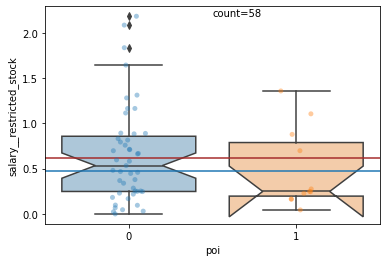

bonus__restricted_stock


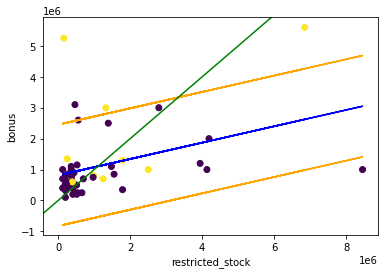

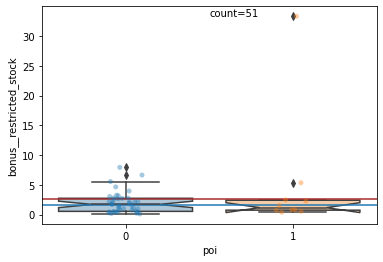

long_term_incentive__restricted_stock


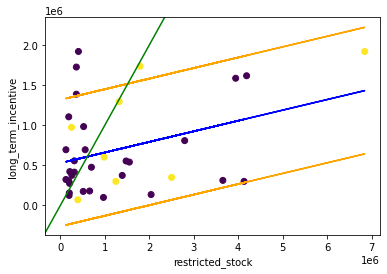

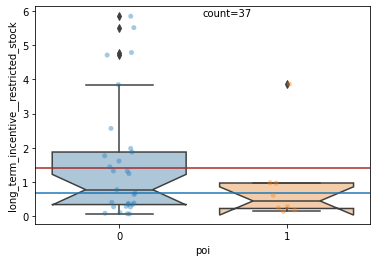

deferred_income__restricted_stock


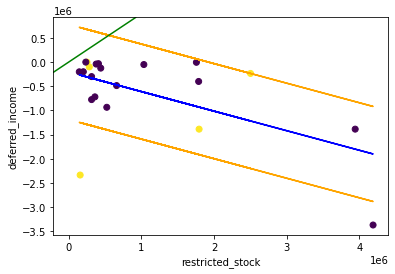

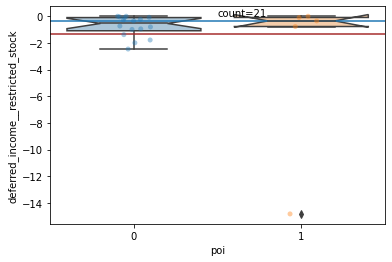

deferral_payments__restricted_stock


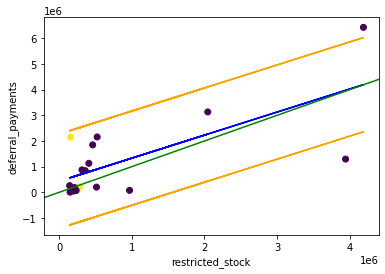

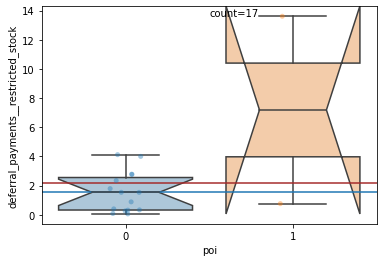

other__restricted_stock


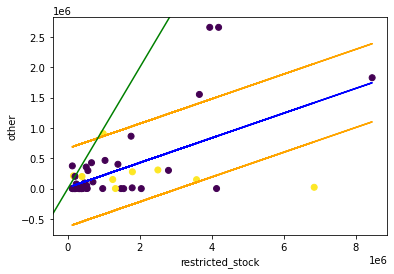

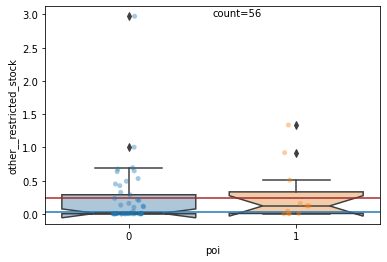

expenses__restricted_stock


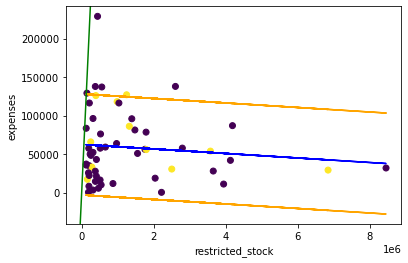

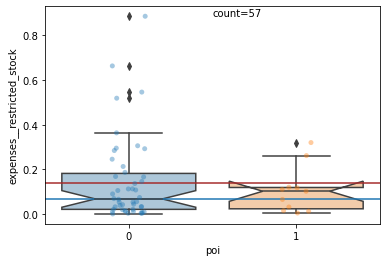

total_payments__restricted_stock


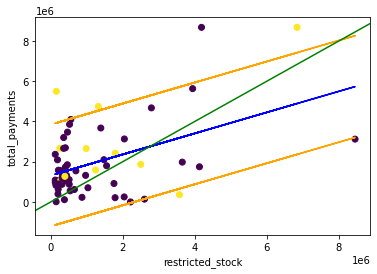

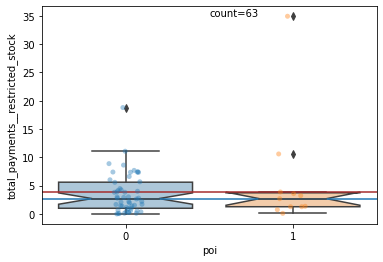

exercised_stock_options__restricted_stock


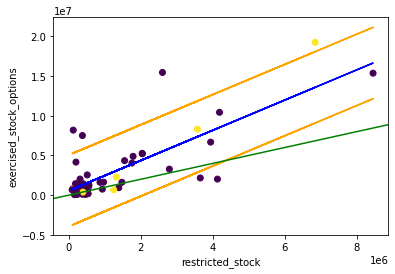

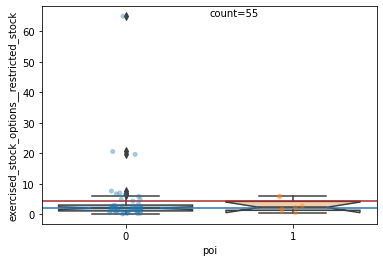

total_stock_value__restricted_stock


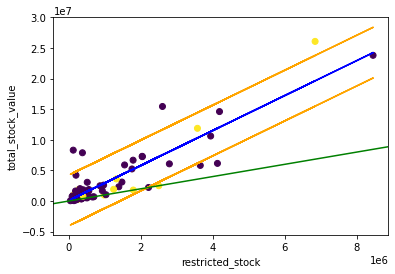

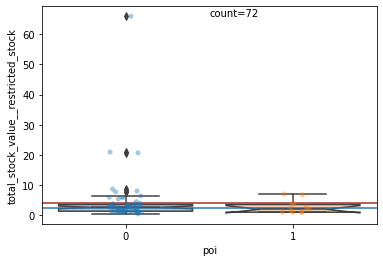

to_messages__restricted_stock


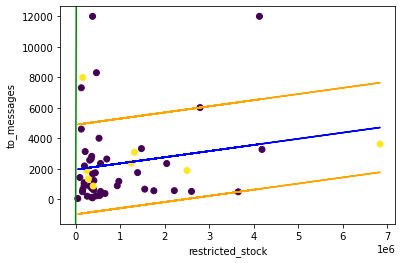

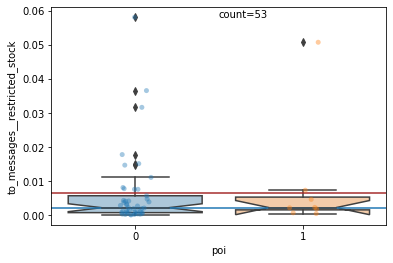

from_poi_to_this_person__restricted_stock


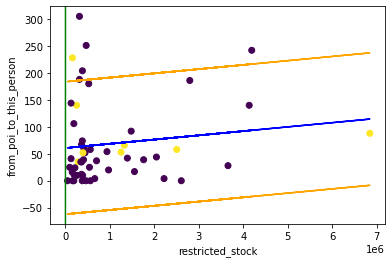

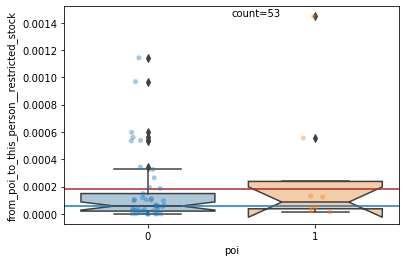

from_messages__restricted_stock


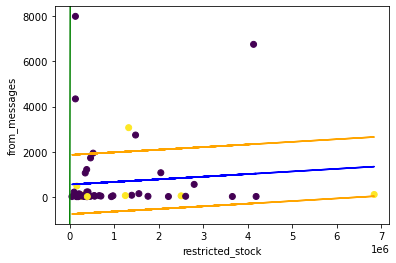

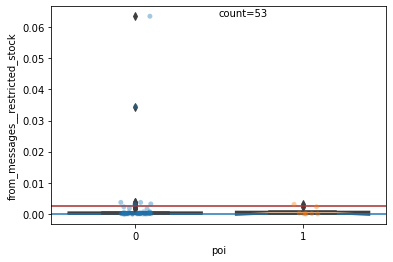

from_this_person_to_poi__restricted_stock


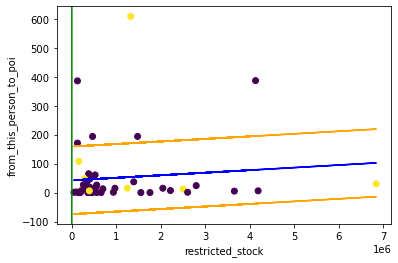

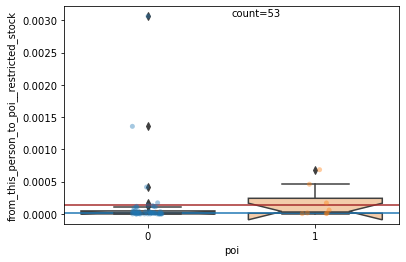

shared_receipt_with_poi__restricted_stock


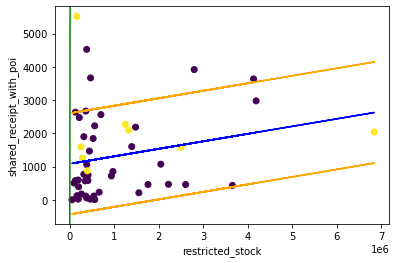

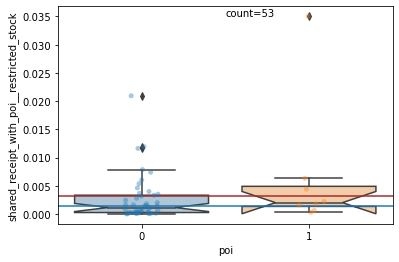

salary__total_stock_value


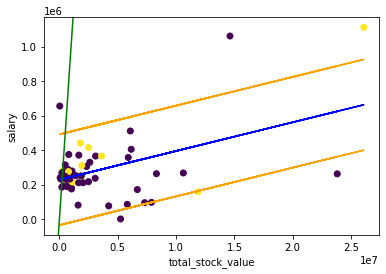

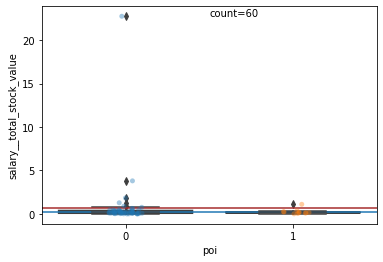

bonus__total_stock_value


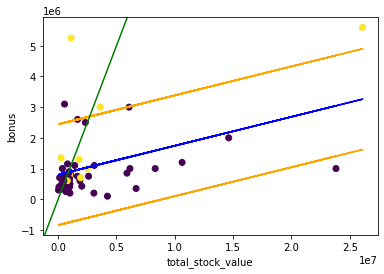

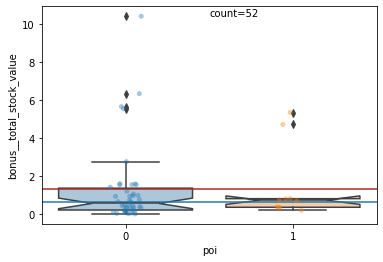

long_term_incentive__total_stock_value


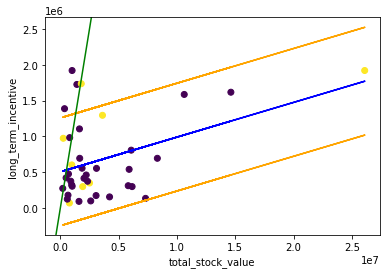

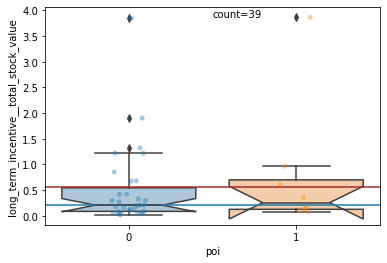

deferred_income__total_stock_value


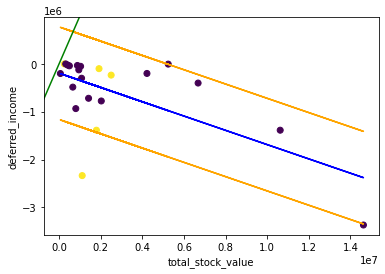

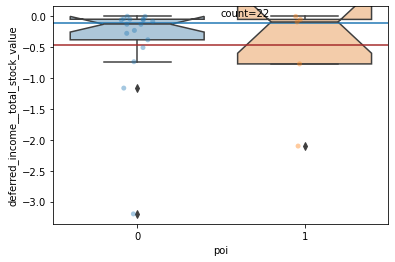

deferral_payments__total_stock_value


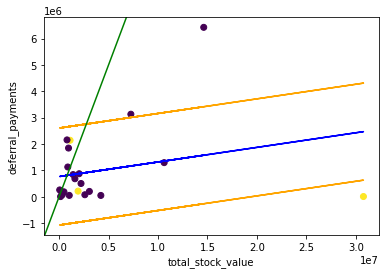

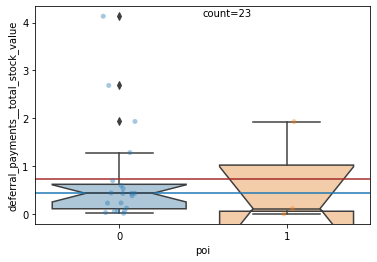

other__total_stock_value


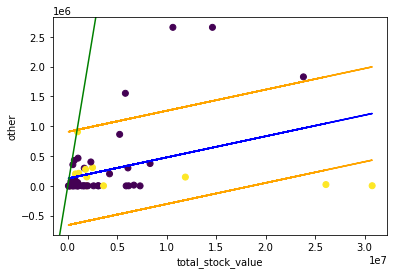

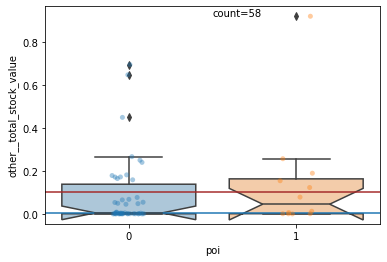

expenses__total_stock_value


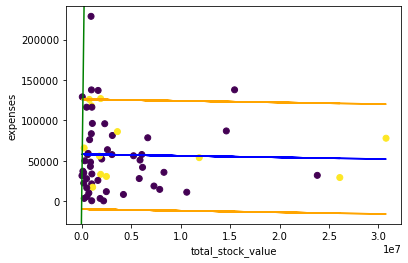

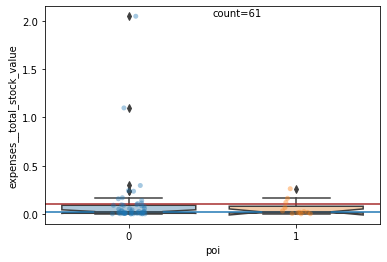

total_payments__total_stock_value


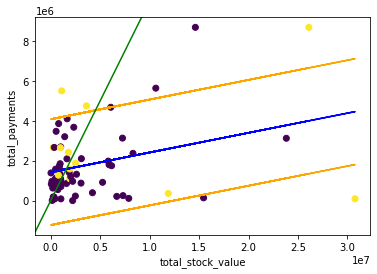

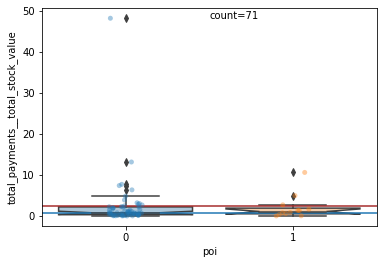

exercised_stock_options__total_stock_value


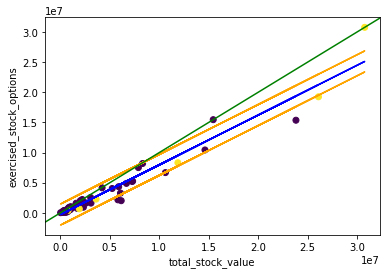

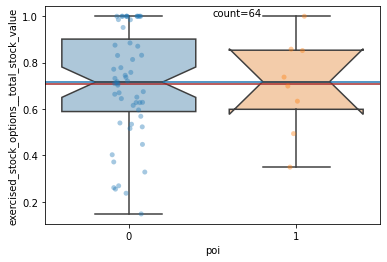

restricted_stock__total_stock_value


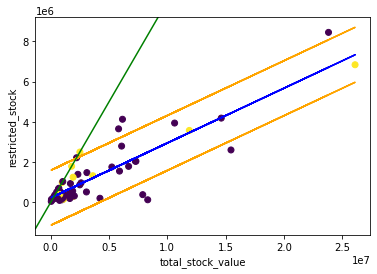

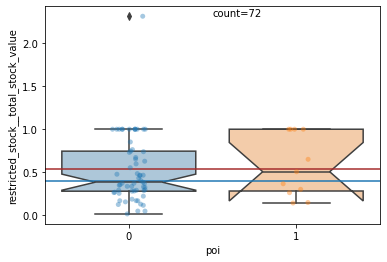

to_messages__total_stock_value


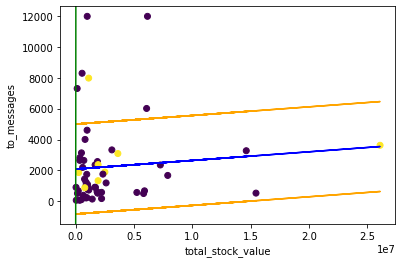

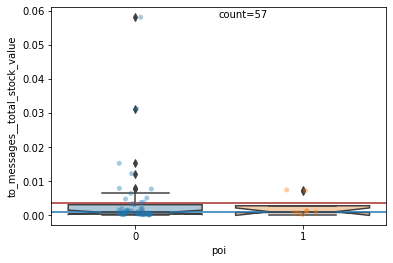

from_poi_to_this_person__total_stock_value


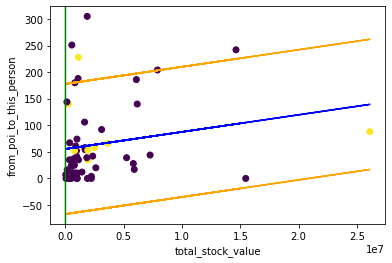

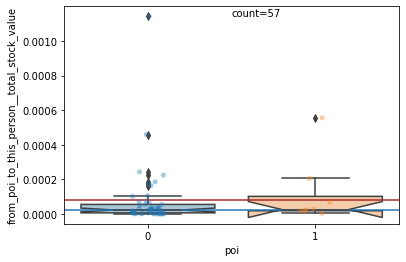

from_messages__total_stock_value


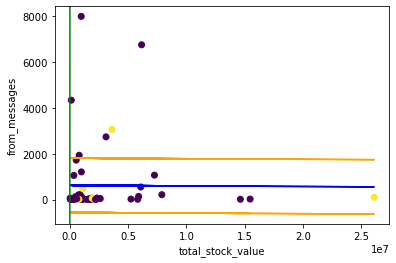

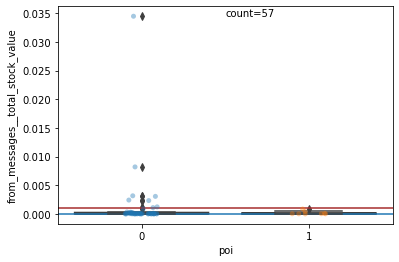

from_this_person_to_poi__total_stock_value


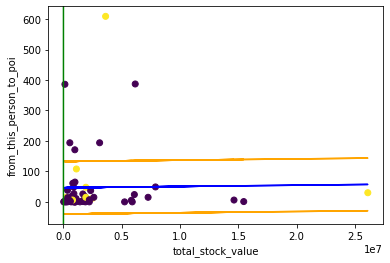

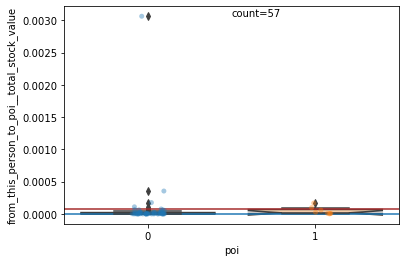

shared_receipt_with_poi__total_stock_value


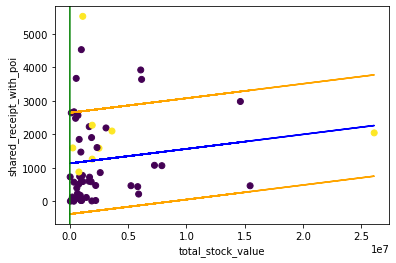

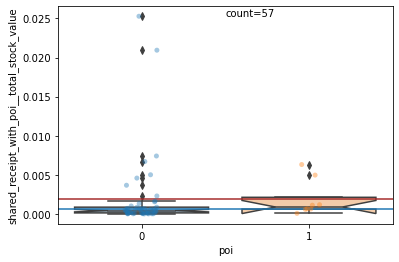

salary__to_messages


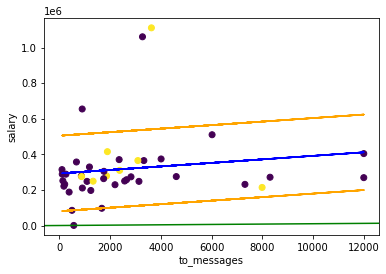

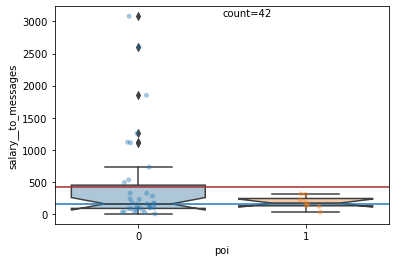

bonus__to_messages


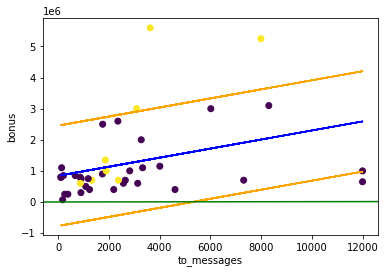

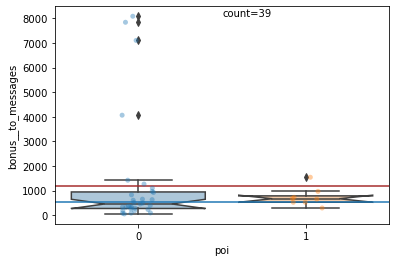

long_term_incentive__to_messages


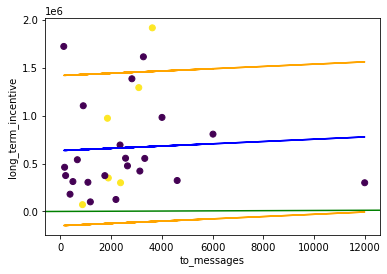

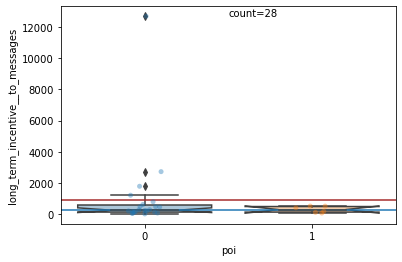

deferred_income__to_messages


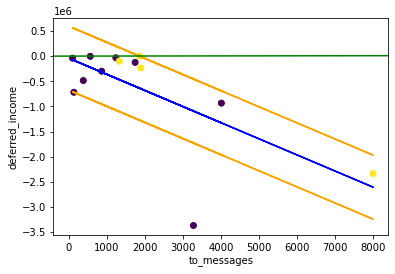

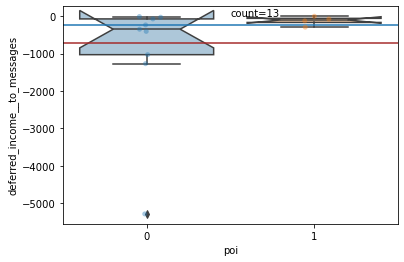

deferral_payments__to_messages


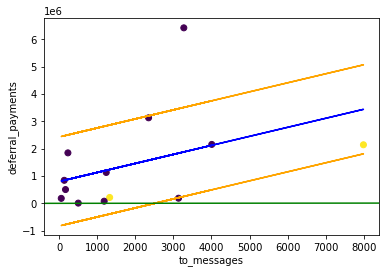

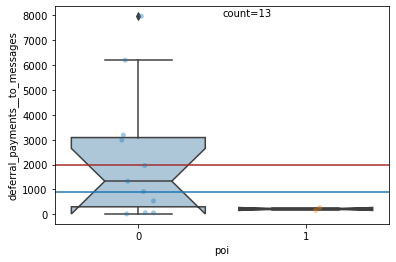

other__to_messages


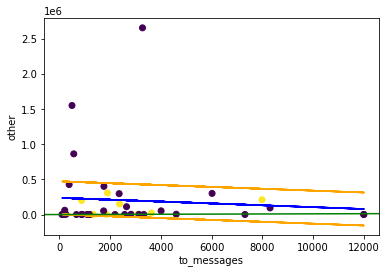

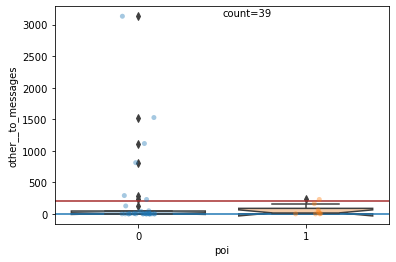

expenses__to_messages


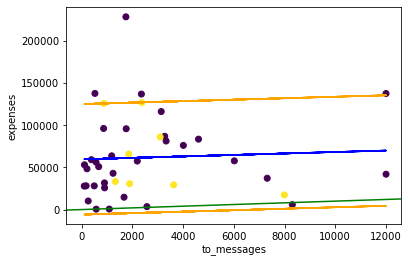

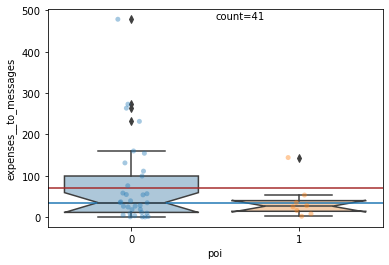

total_payments__to_messages


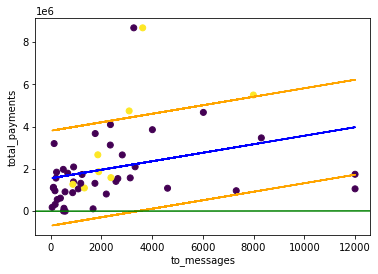

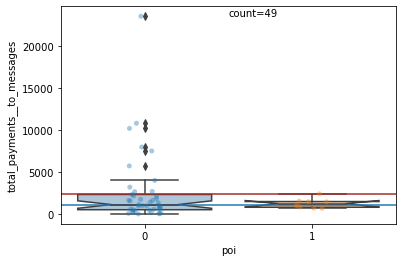

exercised_stock_options__to_messages


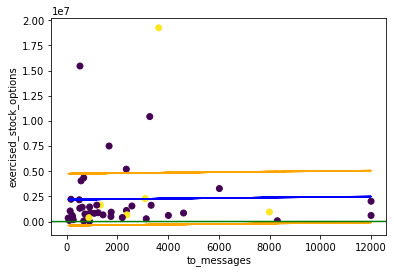

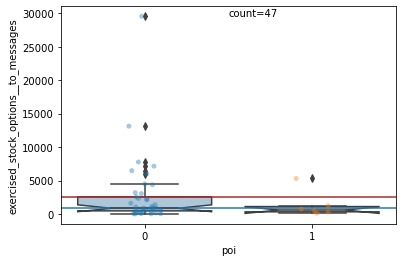

restricted_stock__to_messages


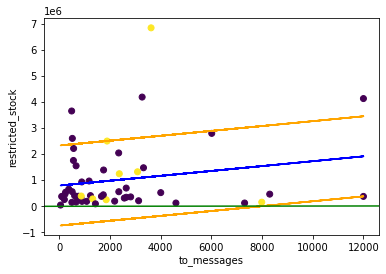

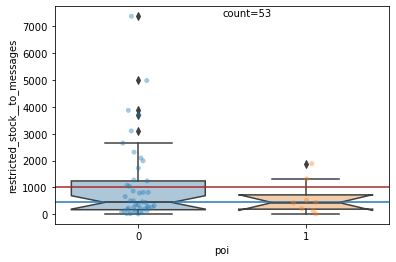

total_stock_value__to_messages


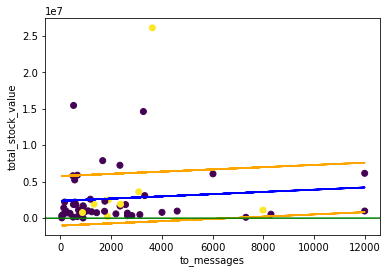

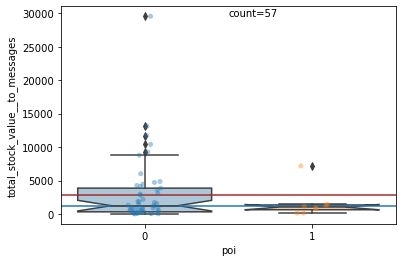

from_poi_to_this_person__to_messages


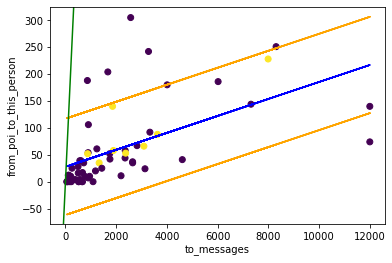

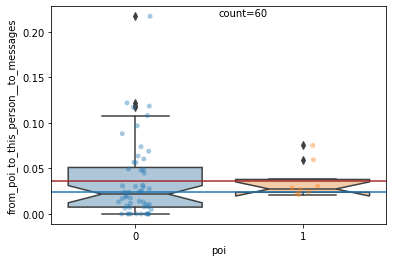

from_messages__to_messages


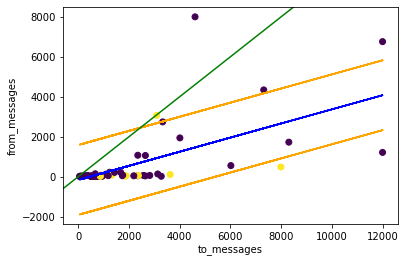

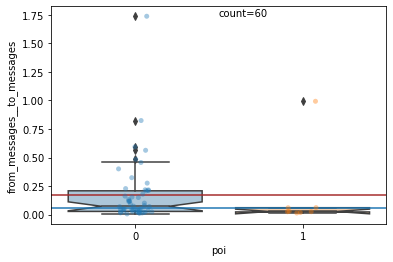

from_this_person_to_poi__to_messages


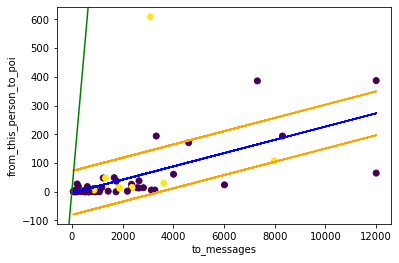

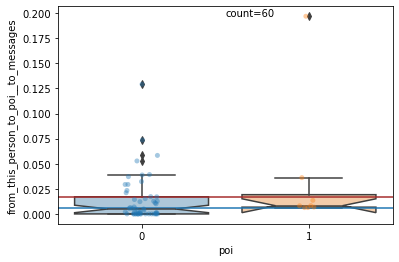

shared_receipt_with_poi__to_messages


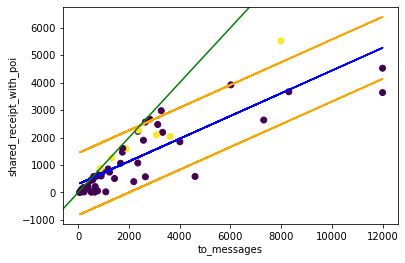

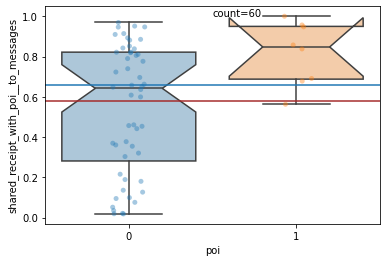

salary__from_poi_to_this_person


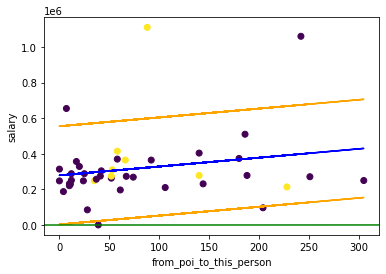

posx and posy should be finite values
posx and posy should be finite values


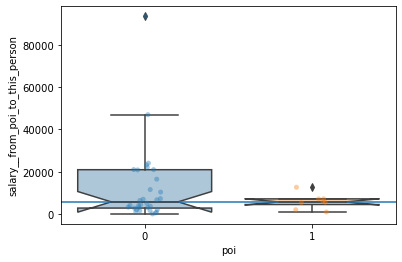

bonus__from_poi_to_this_person


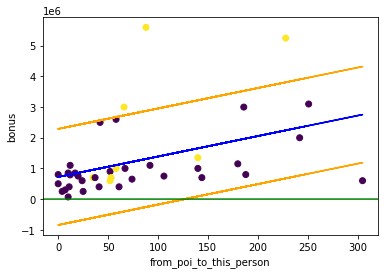

posx and posy should be finite values
posx and posy should be finite values


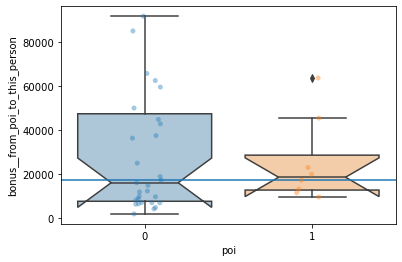

long_term_incentive__from_poi_to_this_person


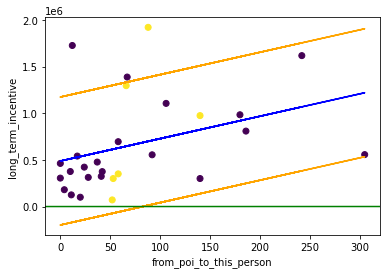

posx and posy should be finite values
posx and posy should be finite values


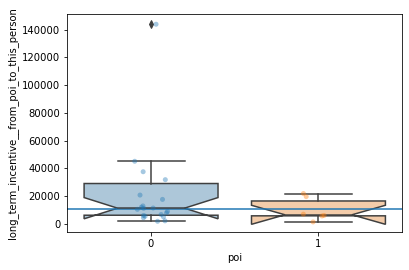

deferred_income__from_poi_to_this_person


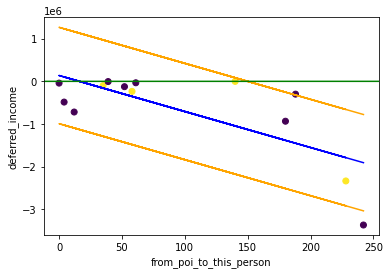

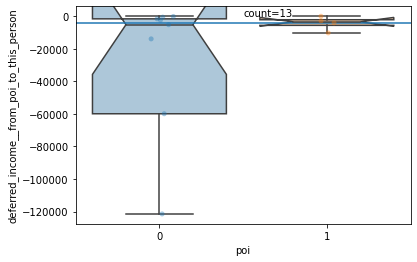

deferral_payments__from_poi_to_this_person


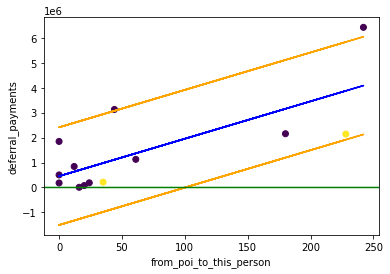

posx and posy should be finite values
posx and posy should be finite values


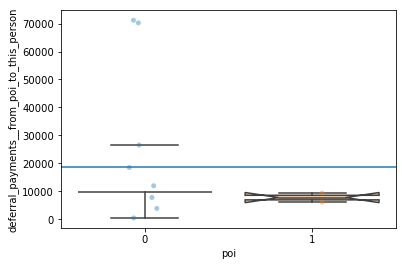

other__from_poi_to_this_person


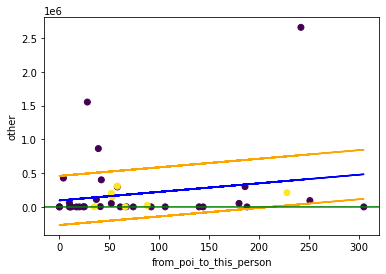

posx and posy should be finite values
posx and posy should be finite values


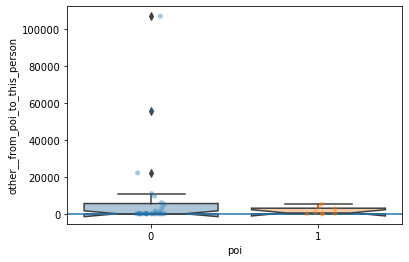

expenses__from_poi_to_this_person


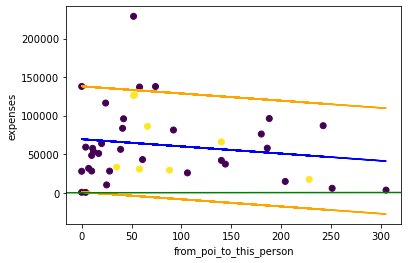

posx and posy should be finite values
posx and posy should be finite values


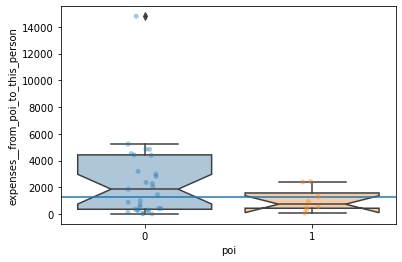

total_payments__from_poi_to_this_person


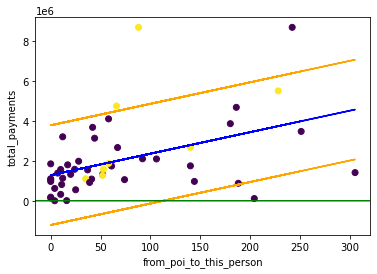

posx and posy should be finite values
posx and posy should be finite values


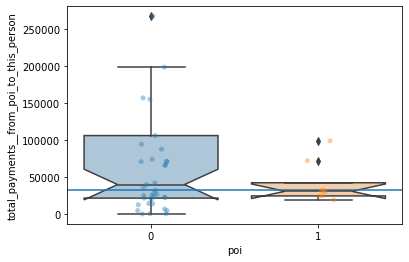

exercised_stock_options__from_poi_to_this_person


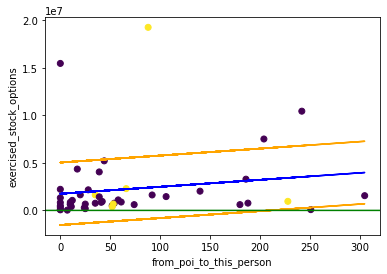

posx and posy should be finite values
posx and posy should be finite values


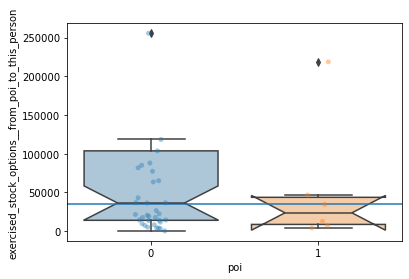

restricted_stock__from_poi_to_this_person


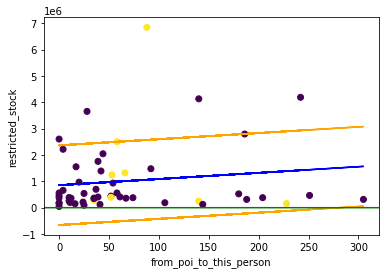

posx and posy should be finite values
posx and posy should be finite values


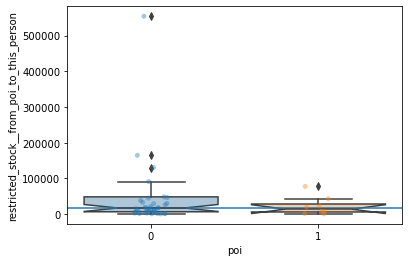

total_stock_value__from_poi_to_this_person


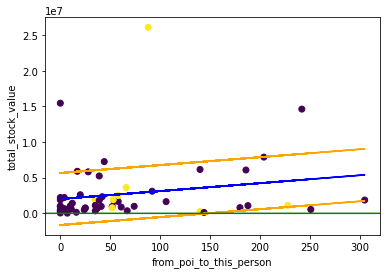

posx and posy should be finite values
posx and posy should be finite values


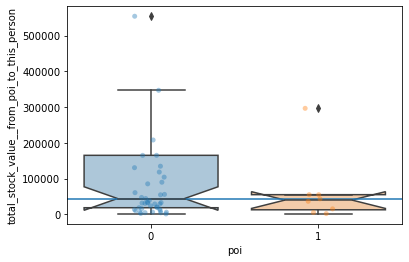

to_messages__from_poi_to_this_person


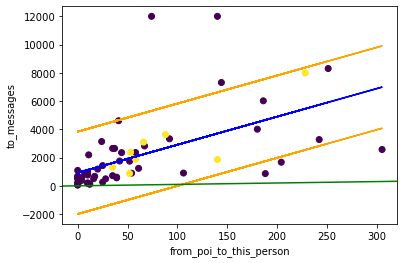

posx and posy should be finite values
posx and posy should be finite values


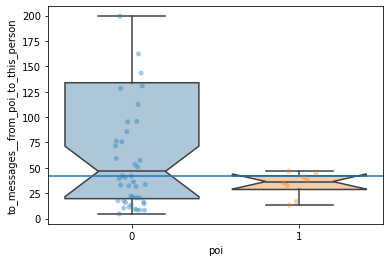

from_messages__from_poi_to_this_person


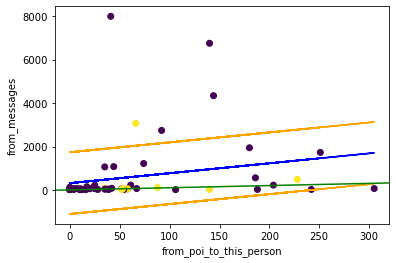

posx and posy should be finite values
posx and posy should be finite values


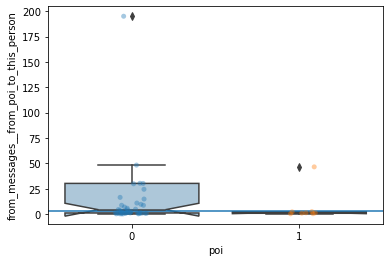

from_this_person_to_poi__from_poi_to_this_person


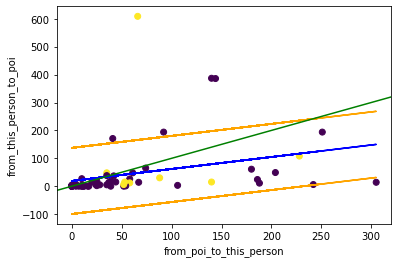

posx and posy should be finite values
posx and posy should be finite values


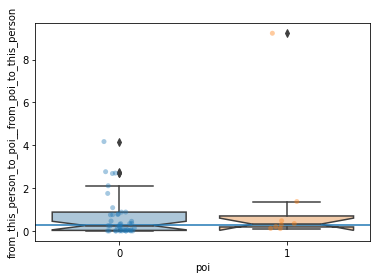

shared_receipt_with_poi__from_poi_to_this_person


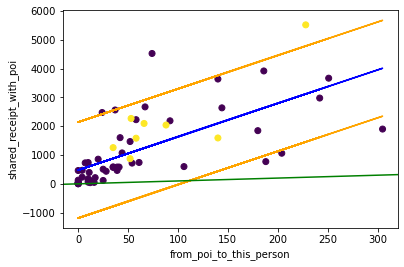

posx and posy should be finite values
posx and posy should be finite values


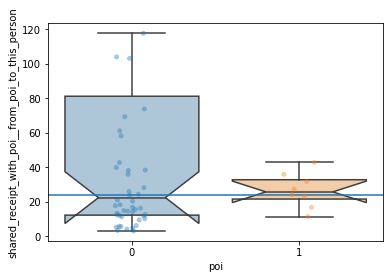

salary__from_messages


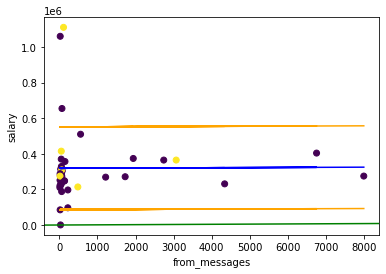

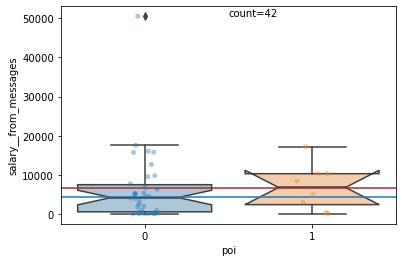

bonus__from_messages


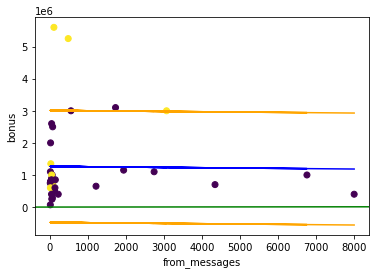

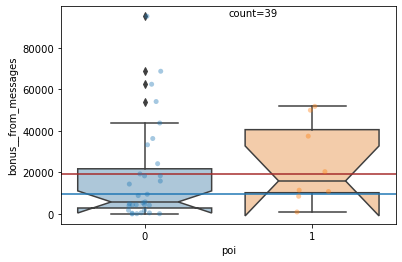

long_term_incentive__from_messages


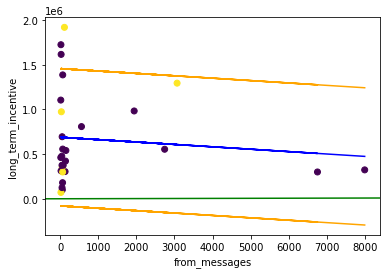

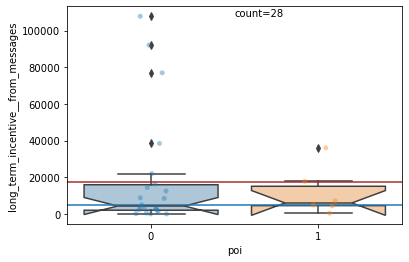

deferred_income__from_messages


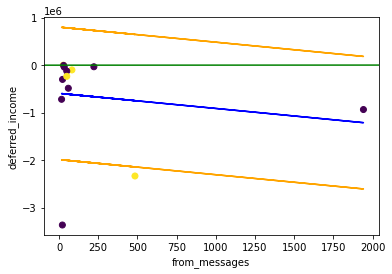

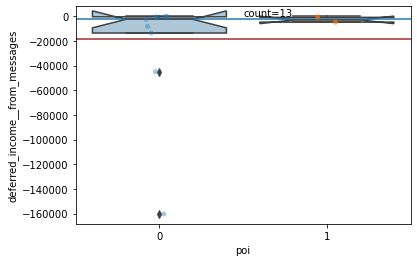

deferral_payments__from_messages


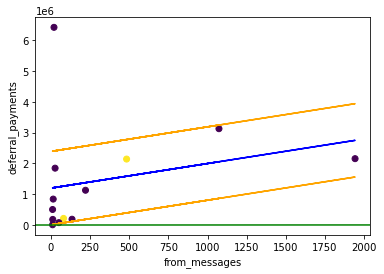

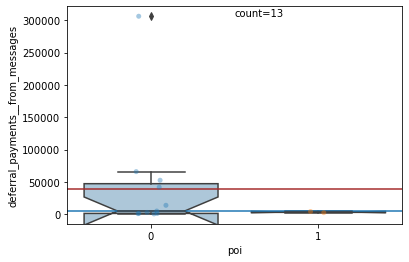

other__from_messages


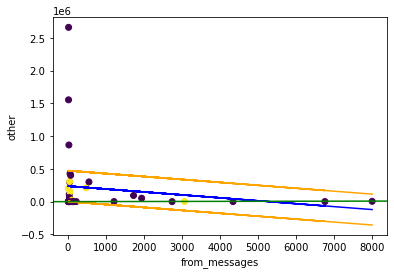

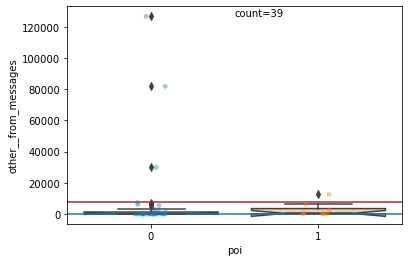

expenses__from_messages


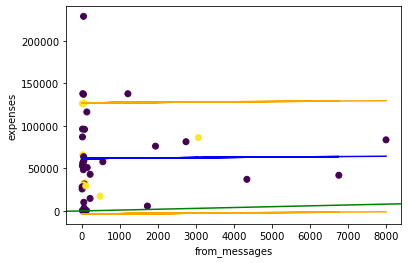

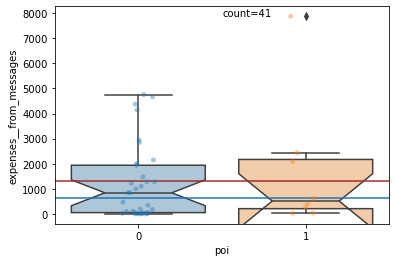

total_payments__from_messages


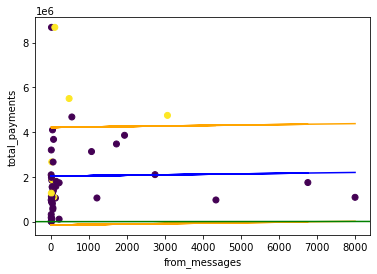

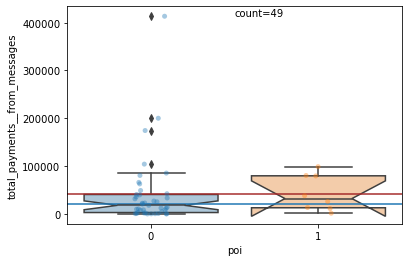

exercised_stock_options__from_messages


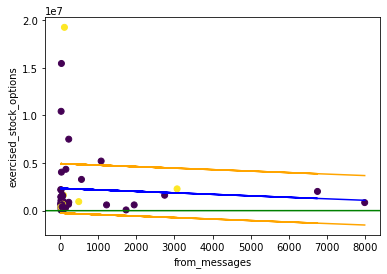

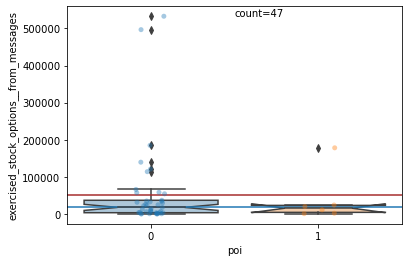

restricted_stock__from_messages


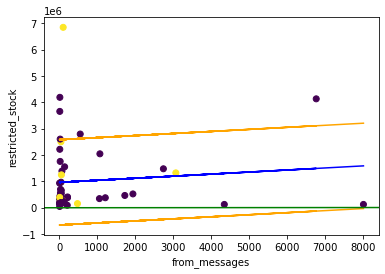

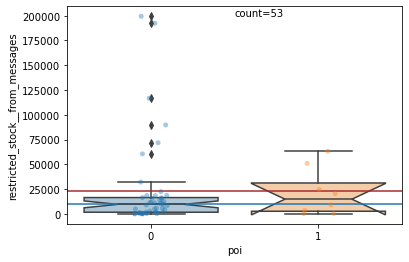

total_stock_value__from_messages


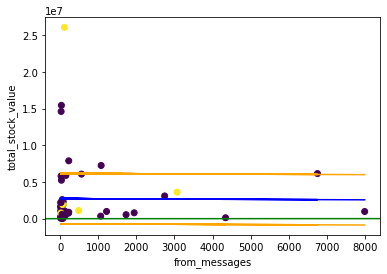

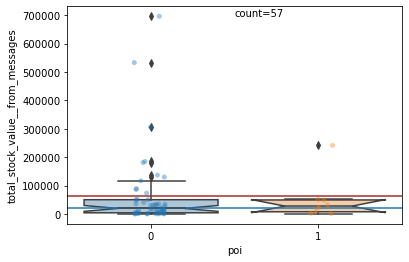

to_messages__from_messages


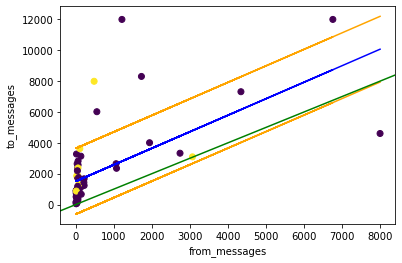

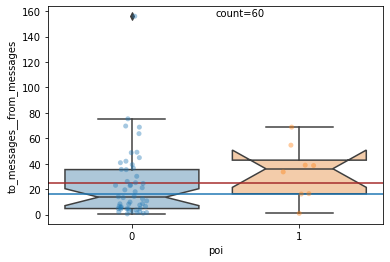

from_poi_to_this_person__from_messages


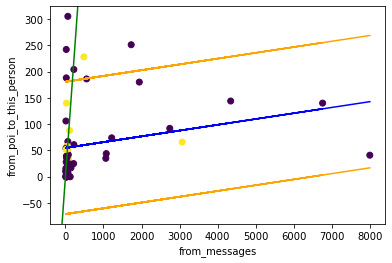

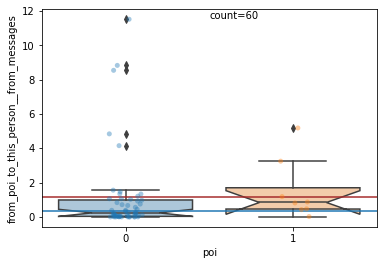

from_this_person_to_poi__from_messages


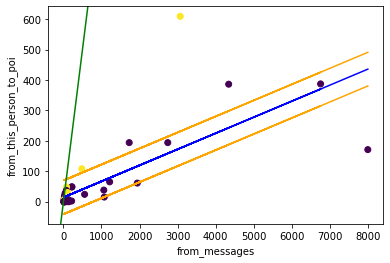

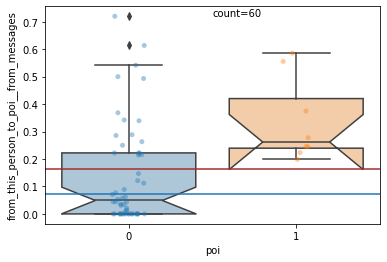

shared_receipt_with_poi__from_messages


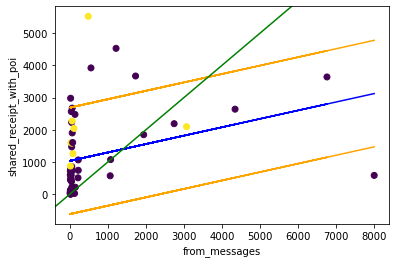

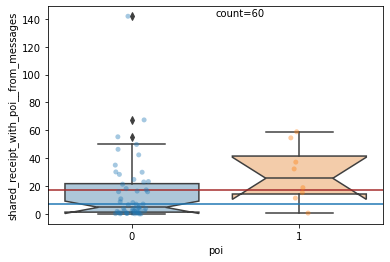

salary__from_this_person_to_poi


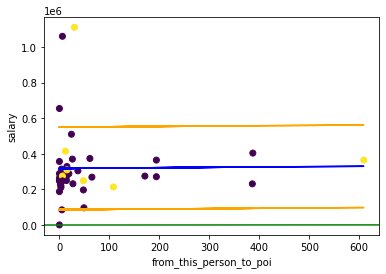

posx and posy should be finite values
posx and posy should be finite values


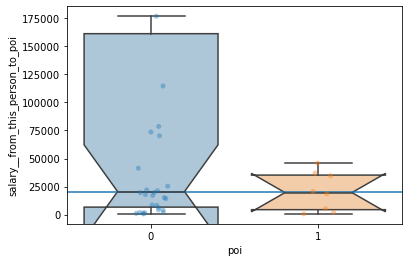

bonus__from_this_person_to_poi


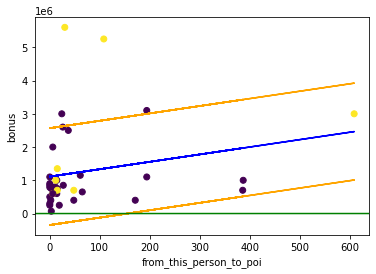

posx and posy should be finite values
posx and posy should be finite values


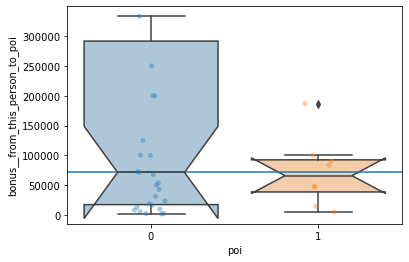

long_term_incentive__from_this_person_to_poi


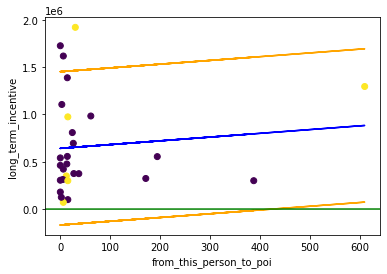

posx and posy should be finite values
posx and posy should be finite values


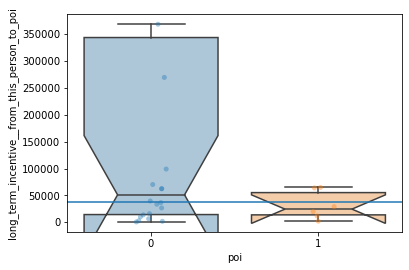

deferred_income__from_this_person_to_poi


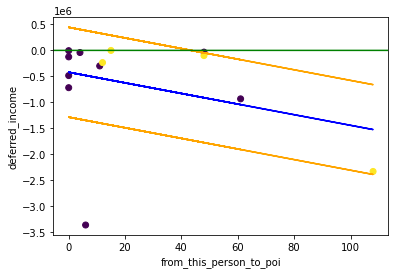

C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\numpy\lib\function_base.py:3968: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above


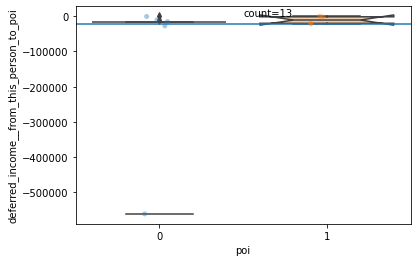

deferral_payments__from_this_person_to_poi


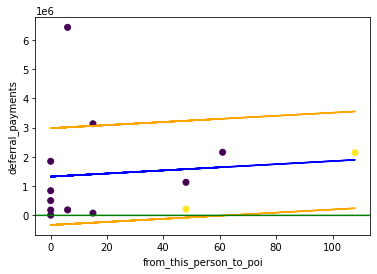

C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\numpy\lib\function_base.py:3968: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above
posx and posy should be finite values
posx and posy should be finite values


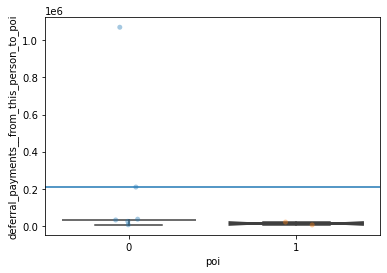

other__from_this_person_to_poi


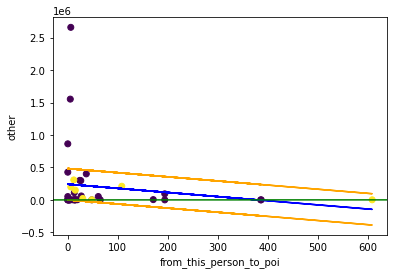

posx and posy should be finite values
posx and posy should be finite values


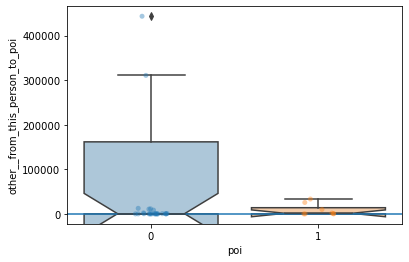

expenses__from_this_person_to_poi


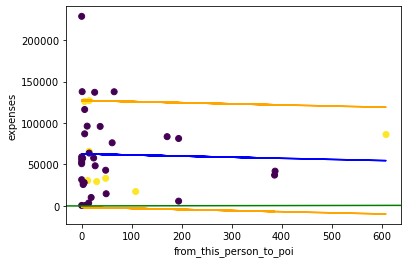

posx and posy should be finite values
posx and posy should be finite values


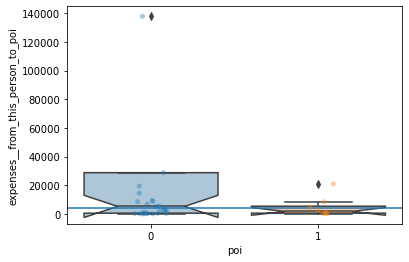

total_payments__from_this_person_to_poi


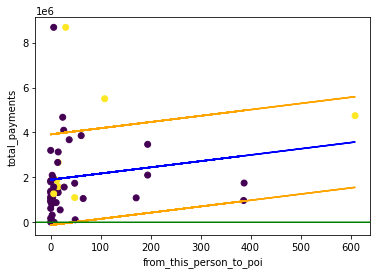

C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\numpy\lib\function_base.py:3968: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above
posx and posy should be finite values
posx and posy should be finite values


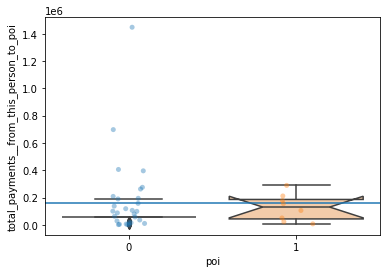

exercised_stock_options__from_this_person_to_poi


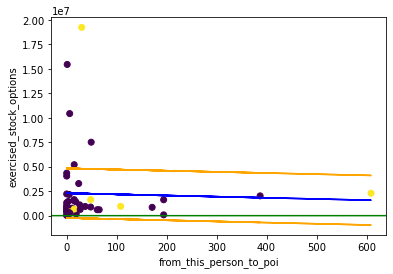

C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\numpy\lib\function_base.py:3968: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above
posx and posy should be finite values
posx and posy should be finite values


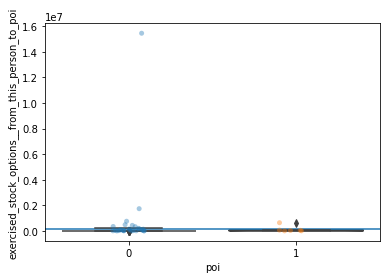

restricted_stock__from_this_person_to_poi


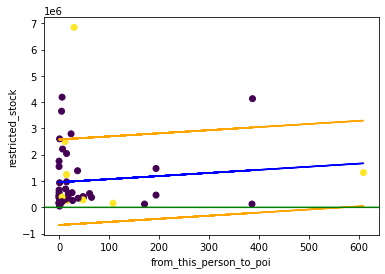

C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\numpy\lib\function_base.py:3968: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above
posx and posy should be finite values
posx and posy should be finite values


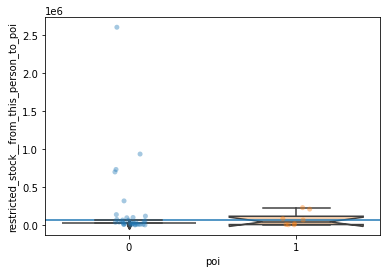

total_stock_value__from_this_person_to_poi


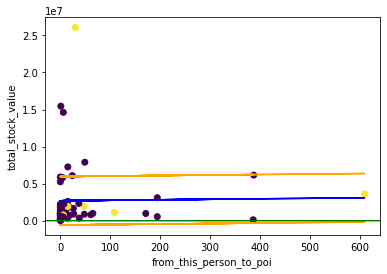

C:\Users\kaleb\anaconda3\envs\py3\lib\site-packages\numpy\lib\function_base.py:3968: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above
posx and posy should be finite values
posx and posy should be finite values


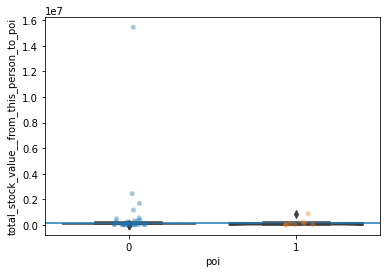

to_messages__from_this_person_to_poi


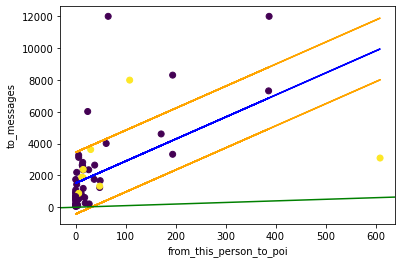

posx and posy should be finite values
posx and posy should be finite values


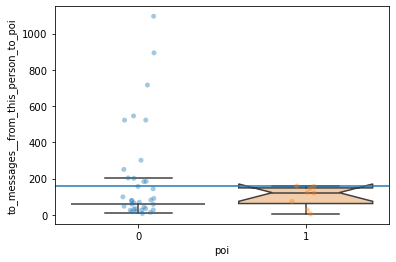

from_poi_to_this_person__from_this_person_to_poi


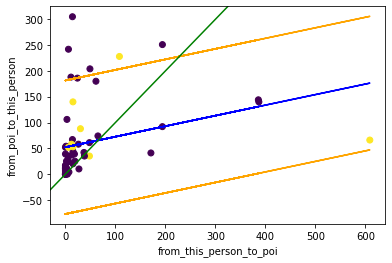

posx and posy should be finite values
posx and posy should be finite values


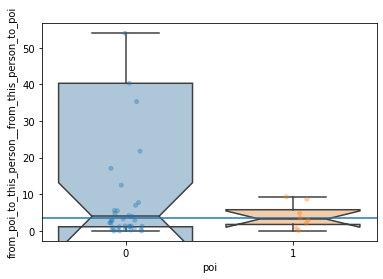

from_messages__from_this_person_to_poi


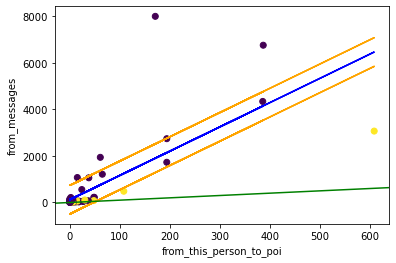

posx and posy should be finite values
posx and posy should be finite values


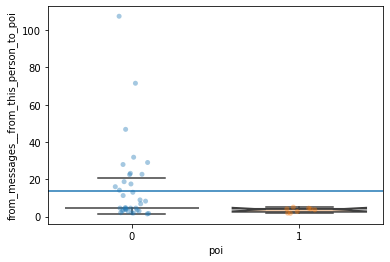

shared_receipt_with_poi__from_this_person_to_poi


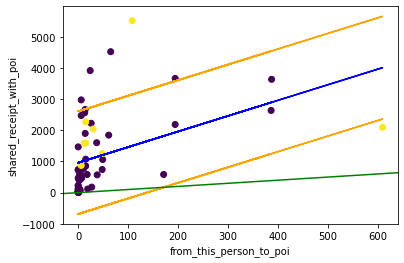

posx and posy should be finite values
posx and posy should be finite values


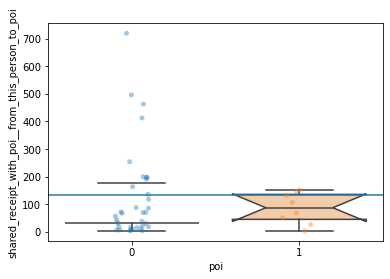

In [30]:
i=0
for feat in features_list[1:]:
    if i+1 < len(features_list[1:]):
        plot_ratios_to_x(data=X_train, feats=features_list[1:],
                     x_pos=i, labels=y_train)
    i +=1

In [31]:
# (X_train['to_messages'] / X_train['from_messages']).dropna().sort_values()
# data_df.loc['FREVERT MARK A']
# data_df.loc['BHATNAGAR SANJAY']
# data_df.loc['HIRKO JOSEPH']

In [32]:
### Again, tempted to top code this, but it seems a typical exec signature
### and useful to get the model to differentiate between execs.
### Then again, if top coding biases the model toward higher POI recall, good.
# (X_train['to_messages'] / X_train['from_messages']).dropna().sort_values()
# data_df.loc['FREVERT MARK A']

### Top code this ratio
# (X_train['from_poi_to_this_person'] / X_train['to_messages']).dropna().sort_values()
# data_df.loc['DONAHUE JR JEFFREY M']
# (X_train['restricted_stock'] / X_train['total_stock_value']).dropna().sort_values()
# data_df.loc['BAY FRANKLIN R']
# (X_train['total_payments'] / X_train['total_stock_value']).dropna().sort_values()
# (X_train['salary'] / X_train['total_stock_value']).dropna().sort_values()
# data_df.loc['PICKERING MARK R']

### Set ratio to median, low total payments, or bottom code total_payments
# (X_train['total_stock_value'] / X_train['total_payments']).dropna().sort_values()
# data_df.loc['HAUG DAVID L']

### Set ratio to median or NaN, has NaN salary
# (X_train['exercised_stock_options'] '''etc''' / X_train['total_payments']).dropna().sort_values()
# data_df.loc['HIRKO JOSEPH']

### Set ratio to median or NaN. They all have NaN salary.
# (X_train['expenses'] / X_train['total_payments']).dropna().sort_values()
# data_df.loc['HAUG DAVID L']
# data_df.loc['BHATNAGAR SANJAY']
# data_df.loc['HIRKO JOSEPH']

### ??Bottom code expenses?? Actually might be a useful feature in some cases.
# (X_train['salary']'''etc''' / X_train['expenses']).dropna().sort_values()
# data_df.loc['BUCHANAN HAROLD G']

### Definitely set his other (2) to NaN.
# (X_train['salary'] / X_train['other']).dropna().sort_values()
# data_df.loc['WALLS JR ROBERT H']

### ??Top code deferred income?? set ratio to median or NaN?
# (X_train['total_stock_value'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BANNANTINE JAMES M']
# data_df.loc['GAHN ROBERT S']
# data_df.loc['BOWEN JR RAYMOND M']
# (X_train['restricted_stock'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BANNANTINE JAMES M']
# data_df.loc['BOWEN JR RAYMOND M']
# data_df.loc['GAHN ROBERT S']

### ??Set ratio value to median or NaN??
# (X_train['exercised_stock_options'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BANNANTINE JAMES M']

### ??top code deferred_income??
# X_train['total_payments'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BOWEN JR RAYMOND M']

### ??Ignore??Remove expenses?
# (X_train['expenses'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BOWEN JR RAYMOND M']
# data_df.loc['GAHN ROBERT S']

### ??Set ratio value to nan or median??
# (X_train['other'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BANNANTINE JAMES M']
# data_df.loc['GAHN ROBERT S']

### ??Set ratio value to nan or median??
# (X_train['deferral_payments'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['GAHN ROBERT S']
# data_df.loc['PIPER GREGORY F']

### ??Top code deferred income??Set ratio value to nan or median??
# (X_train['long_term_incentive'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BOWEN JR RAYMOND M']
# (X_train['bonus'] / X_train['deferred_income']).dropna().sort_values()
# (X_train['salary'] / X_train['deferred_income']).dropna().sort_values()
# data_df.loc['BOWEN JR RAYMOND M']
# data_df.loc['GAHN ROBERT S']

### deferral_payments to long_term_incentive contains no POIs

### ??Set ratio value to nan or median??
# (X_train['long_term_incentive'] / X_train['bonus']).dropna().sort_values()
# data_df.loc['ECHOLS JOHN B']

### Bannantine's low salary and high other types of payments skews ratios
### when salary is denominator, but he is an exec who left right before the
### scandal so a good example of a nonPOI who might look otherwise.
### ??Bottom code salary?? And/or make sure it's never denominator??
### ??Set ratio values to nan or median??
# (X_train['total_stock_value'] / X_train['salary']).dropna().sort_values()
# (X_train['restricted_stock'] / X_train['salary']).dropna().sort_values()
# (X_train['exercised_stock_options'] / X_train['salary']).dropna().sort_values()
# (X_train['total_payments'] / X_train['salary']).dropna().sort_values()
# (X_train['expenses'] / X_train['salary']).dropna().sort_values()
# (X_train['other'] / X_train['salary']).dropna().sort_values()
# data_df.loc['BANNANTINE JAMES M']

### ??Set ratio value to nan or median??
# (X_train['long_term_incentive'] / X_train['salary']).dropna().sort_values()
# data_df.loc['GRAY RODNEY']

In [33]:
X_train.loc['WALLS JR ROBERT H', 'other']
X_train.loc['WALLS JR ROBERT H', 'other'] = np.nan
X_train.loc['WALLS JR ROBERT H', 'other']

2.0

nan

In [34]:
### What to bottom code to make more reasonable ratios?
for col in X_train.columns:
    print(col)
    X_train[X_train[col].isna() == False]\
    .sort_values(by=col, axis='index', ascending=True)\
    .head()

salary


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
BANNANTINE JAMES M,477.0,NaN,NaN,-5104.0,NaN,864523.0,56301.0,916197.0,4046157.0,1757552.0,5243487.0,566.0,39.0,29.0,0.0,465.0
GRAY RODNEY,6615.0,NaN,365625.0,NaN,93585.0,680833.0,NaN,1146658.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
REYNOLDS LAWRENCE,76399.0,100000.0,156250.0,-200000.0,51365.0,202052.0,8409.0,394475.0,4160672.0,201483.0,4221891.0,NaN,NaN,NaN,NaN,NaN
BAZELIDES PHILIP J,80818.0,NaN,93750.0,NaN,684694.0,874.0,NaN,860136.0,1599641.0,NaN,1599641.0,NaN,NaN,NaN,NaN,NaN
IZZO LAWRENCE L,85274.0,NaN,312500.0,NaN,NaN,1553729.0,28093.0,1979596.0,2165172.0,3654808.0,5819980.0,496.0,28.0,19.0,5.0,437.0


bonus


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
DODSON KEITH,221003.0,70000.0,NaN,NaN,NaN,774.0,28164.0,319941.0,NaN,NaN,NaN,176.0,10.0,14.0,3.0,114.0
REYNOLDS LAWRENCE,76399.0,100000.0,156250.0,-200000.0,51365.0,202052.0,8409.0,394475.0,4160672.0,201483.0,4221891.0,NaN,NaN,NaN,NaN,NaN
ECHOLS JOHN B,182245.0,200000.0,1920000.0,NaN,NaN,53775.0,21530.0,2692324.0,601438.0,407503.0,1008941.0,NaN,NaN,NaN,NaN,NaN
LINDHOLM TOD A,236457.0,200000.0,175000.0,NaN,204075.0,2630.0,57727.0,875889.0,2549361.0,514847.0,3064208.0,NaN,NaN,NaN,NaN,NaN
BERGSIEKER RICHARD P,187922.0,250000.0,180250.0,-485813.0,NaN,427316.0,59175.0,618850.0,NaN,659249.0,659249.0,383.0,4.0,59.0,0.0,233.0


long_term_incentive


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
GLISAN JR BEN F,274975.0,600000.0,71023.0,NaN,NaN,200308.0,125978.0,1272284.0,384728.0,393818.0,778546.0,874.0,52.0,16.0,6.0,874.0
BAZELIDES PHILIP J,80818.0,NaN,93750.0,NaN,684694.0,874.0,NaN,860136.0,1599641.0,NaN,1599641.0,NaN,NaN,NaN,NaN,NaN
OLSON CINDY K,329078.0,750000.0,100000.0,NaN,77716.0,972.0,63791.0,1321557.0,1637034.0,969729.0,2606763.0,1184.0,20.0,52.0,15.0,856.0
MURRAY JULIA H,229284.0,400000.0,125000.0,NaN,NaN,330.0,57580.0,812194.0,400478.0,196983.0,597461.0,2192.0,11.0,45.0,2.0,395.0
OVERDYKE JR JERE C,94941.0,NaN,135836.0,NaN,NaN,176.0,18834.0,249787.0,5266578.0,2041016.0,7307594.0,NaN,NaN,NaN,NaN,NaN


deferred_income


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0
BELDEN TIMOTHY N,213999.0,5249999.0,NaN,-2334434.0,2144013.0,210698.0,17355.0,5501630.0,953136.0,157569.0,1110705.0,7991.0,228.0,484.0,108.0,5521.0
FASTOW ANDREW S,440698.0,1300000.0,1736055.0,-1386055.0,NaN,277464.0,55921.0,2424083.0,NaN,1794412.0,1794412.0,NaN,NaN,NaN,NaN,NaN
BAXTER JOHN C,267102.0,1200000.0,1586055.0,-1386055.0,1295738.0,2660303.0,11200.0,5634343.0,6680544.0,3942714.0,10623258.0,NaN,NaN,NaN,NaN,NaN
HAEDICKE MARK E,374125.0,1150000.0,983346.0,-934484.0,2157527.0,52382.0,76169.0,3859065.0,608750.0,524169.0,803094.0,4009.0,180.0,1941.0,61.0,1847.0


deferral_payments


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
HAYES ROBERT E,NaN,NaN,NaN,NaN,7961.0,NaN,NaN,7961.0,NaN,151418.0,151418.0,504.0,16.0,12.0,0.0,50.0
HIRKO JOSEPH,NaN,NaN,NaN,NaN,10259.0,2856.0,77978.0,91093.0,30766064.0,NaN,30766064.0,NaN,NaN,NaN,NaN,NaN
REYNOLDS LAWRENCE,76399.0,100000.0,156250.0,-200000.0,51365.0,202052.0,8409.0,394475.0,4160672.0,201483.0,4221891.0,NaN,NaN,NaN,NaN,NaN
WALTERS GARETH W,NaN,NaN,NaN,NaN,53625.0,NaN,33785.0,87410.0,1030329.0,NaN,1030329.0,NaN,NaN,NaN,NaN,NaN
GAHN ROBERT S,192008.0,509870.0,NaN,-1042.0,73122.0,76547.0,50080.0,900585.0,83237.0,235370.0,318607.0,NaN,NaN,NaN,NaN,NaN


other


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
BAY FRANKLIN R,239671.0,400000.0,NaN,-201641.0,260455.0,69.0,129142.0,827696.0,NaN,145796.0,63014.0,NaN,NaN,NaN,NaN,NaN
OVERDYKE JR JERE C,94941.0,NaN,135836.0,NaN,NaN,176.0,18834.0,249787.0,5266578.0,2041016.0,7307594.0,NaN,NaN,NaN,NaN,NaN
MURRAY JULIA H,229284.0,400000.0,125000.0,NaN,NaN,330.0,57580.0,812194.0,400478.0,196983.0,597461.0,2192.0,11.0,45.0,2.0,395.0
DIETRICH JANET R,250100.0,600000.0,556416.0,NaN,NaN,473.0,3475.0,1410464.0,1550019.0,315068.0,1865087.0,2572.0,305.0,63.0,14.0,1902.0
COX DAVID,314288.0,800000.0,NaN,-41250.0,NaN,494.0,27861.0,1101393.0,117551.0,378082.0,495633.0,102.0,0.0,33.0,4.0,71.0


expenses


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
HAUG DAVID L,NaN,NaN,NaN,NaN,NaN,NaN,475.0,475.0,NaN,2217299.0,2217299.0,573.0,4.0,19.0,7.0,471.0
BUCHANAN HAROLD G,248017.0,500000.0,304805.0,NaN,NaN,1215.0,600.0,1054637.0,825464.0,189041.0,1014505.0,1088.0,0.0,125.0,0.0,23.0
DIETRICH JANET R,250100.0,600000.0,556416.0,NaN,NaN,473.0,3475.0,1410464.0,1550019.0,315068.0,1865087.0,2572.0,305.0,63.0,14.0,1902.0
BADUM JAMES P,NaN,NaN,NaN,NaN,178980.0,NaN,3486.0,182466.0,257817.0,NaN,257817.0,NaN,NaN,NaN,NaN,NaN
KITCHEN LOUISE,271442.0,3100000.0,NaN,NaN,NaN,93925.0,5774.0,3471141.0,81042.0,466101.0,547143.0,8305.0,251.0,1728.0,194.0,3669.0


total_payments


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
HAUG DAVID L,NaN,NaN,NaN,NaN,NaN,NaN,475.0,475.0,NaN,2217299.0,2217299.0,573.0,4.0,19.0,7.0,471.0
HAYES ROBERT E,NaN,NaN,NaN,NaN,7961.0,NaN,NaN,7961.0,NaN,151418.0,151418.0,504.0,16.0,12.0,0.0,50.0
WALTERS GARETH W,NaN,NaN,NaN,NaN,53625.0,NaN,33785.0,87410.0,1030329.0,NaN,1030329.0,NaN,NaN,NaN,NaN,NaN
LEMAISTRE CHARLES,NaN,NaN,NaN,-25000.0,NaN,NaN,NaN,87492.0,412878.0,NaN,412878.0,NaN,NaN,NaN,NaN,NaN
HIRKO JOSEPH,NaN,NaN,NaN,NaN,10259.0,2856.0,77978.0,91093.0,30766064.0,NaN,30766064.0,NaN,NaN,NaN,NaN,NaN


exercised_stock_options


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
PICKERING MARK R,655037.0,300000.0,NaN,NaN,NaN,NaN,31653.0,1386690.0,28798.0,NaN,28798.0,898.0,7.0,67.0,0.0,728.0
MORAN MICHAEL P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59539.0,161602.0,221141.0,672.0,0.0,19.0,0.0,127.0
KITCHEN LOUISE,271442.0,3100000.0,NaN,NaN,NaN,93925.0,5774.0,3471141.0,81042.0,466101.0,547143.0,8305.0,251.0,1728.0,194.0,3669.0
GAHN ROBERT S,192008.0,509870.0,NaN,-1042.0,73122.0,76547.0,50080.0,900585.0,83237.0,235370.0,318607.0,NaN,NaN,NaN,NaN,NaN
COX DAVID,314288.0,800000.0,NaN,-41250.0,NaN,494.0,27861.0,1101393.0,117551.0,378082.0,495633.0,102.0,0.0,33.0,4.0,71.0


restricted_stock


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
PIRO JIM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47304.0,47304.0,58.0,0.0,16.0,1.0,3.0
MCCARTY DANNY J,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,664375.0,94556.0,758931.0,1433.0,25.0,215.0,2.0,508.0
KAMINSKI WINCENTY J,275101.0,400000.0,323466.0,NaN,NaN,4669.0,83585.0,1086821.0,850010.0,126027.0,976037.0,4607.0,41.0,8000.0,171.0,583.0
DIMICHELE RICHARD G,262788.0,1000000.0,694862.0,NaN,NaN,374689.0,35812.0,2368151.0,8191755.0,126027.0,8317782.0,NaN,NaN,NaN,NaN,NaN
BECK SALLY W,231330.0,700000.0,NaN,NaN,NaN,566.0,37172.0,969068.0,NaN,126027.0,126027.0,7315.0,144.0,4343.0,386.0,2639.0


total_stock_value


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
PICKERING MARK R,655037.0,300000.0,NaN,NaN,NaN,NaN,31653.0,1386690.0,28798.0,NaN,28798.0,898.0,7.0,67.0,0.0,728.0
PIRO JIM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47304.0,47304.0,58.0,0.0,16.0,1.0,3.0
BAY FRANKLIN R,239671.0,400000.0,NaN,-201641.0,260455.0,69.0,129142.0,827696.0,NaN,145796.0,63014.0,NaN,NaN,NaN,NaN,NaN
BECK SALLY W,231330.0,700000.0,NaN,NaN,NaN,566.0,37172.0,969068.0,NaN,126027.0,126027.0,7315.0,144.0,4343.0,386.0,2639.0
HAYES ROBERT E,NaN,NaN,NaN,NaN,7961.0,NaN,NaN,7961.0,NaN,151418.0,151418.0,504.0,16.0,12.0,0.0,50.0


to_messages


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
FOY JOE,NaN,NaN,NaN,NaN,181755.0,NaN,NaN,181755.0,343434.0,NaN,343434.0,57.0,0.0,13.0,0.0,2.0
PIRO JIM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47304.0,47304.0,58.0,0.0,16.0,1.0,3.0
COX DAVID,314288.0,800000.0,NaN,-41250.0,NaN,494.0,27861.0,1101393.0,117551.0,378082.0,495633.0,102.0,0.0,33.0,4.0,71.0
UMANOFF ADAM S,288589.0,788750.0,NaN,NaN,NaN,NaN,53122.0,1130461.0,NaN,NaN,NaN,111.0,12.0,18.0,0.0,41.0
MULLER MARK S,251654.0,1100000.0,1725545.0,-719000.0,842924.0,947.0,NaN,3202070.0,1056320.0,360528.0,1416848.0,136.0,12.0,16.0,0.0,114.0


from_poi_to_this_person


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
PIRO JIM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47304.0,47304.0,58.0,0.0,16.0,1.0,3.0
GIBBS DANA R,NaN,NaN,461912.0,NaN,504610.0,NaN,NaN,966522.0,2218275.0,NaN,2218275.0,169.0,0.0,12.0,0.0,23.0
COX DAVID,314288.0,800000.0,NaN,-41250.0,NaN,494.0,27861.0,1101393.0,117551.0,378082.0,495633.0,102.0,0.0,33.0,4.0,71.0
FOWLER PEGGY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1324578.0,560170.0,1884748.0,517.0,0.0,36.0,0.0,10.0
BHATNAGAR SANJAY,NaN,NaN,NaN,NaN,NaN,NaN,137864.0,137864.0,15456290.0,2604490.0,15456290.0,523.0,0.0,29.0,1.0,463.0


from_messages


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
DURAN WILLIAM D,210692.0,750000.0,1105218.0,NaN,NaN,1568.0,25785.0,2093263.0,1451869.0,189041.0,1640910.0,904.0,106.0,12.0,3.0,599.0
CORDES WILLIAM R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,651850.0,386335.0,1038185.0,764.0,10.0,12.0,0.0,58.0
HAYES ROBERT E,NaN,NaN,NaN,NaN,7961.0,NaN,NaN,7961.0,NaN,151418.0,151418.0,504.0,16.0,12.0,0.0,50.0
GIBBS DANA R,NaN,NaN,461912.0,NaN,504610.0,NaN,NaN,966522.0,2218275.0,NaN,2218275.0,169.0,0.0,12.0,0.0,23.0
FOY JOE,NaN,NaN,NaN,NaN,181755.0,NaN,NaN,181755.0,343434.0,NaN,343434.0,57.0,0.0,13.0,0.0,2.0


from_this_person_to_poi


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
POWERS WILLIAM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,653.0,0.0,26.0,0.0,12.0
MCCLELLAN GEORGE,263413.0,900000.0,NaN,-125000.0,NaN,51587.0,228763.0,1318763.0,506765.0,441096.0,947861.0,1744.0,52.0,49.0,0.0,1469.0
MEYER ROCKFORD G,NaN,NaN,NaN,NaN,1848227.0,NaN,NaN,1848227.0,493489.0,462384.0,955873.0,232.0,0.0,28.0,0.0,22.0
BANNANTINE JAMES M,477.0,NaN,NaN,-5104.0,NaN,864523.0,56301.0,916197.0,4046157.0,1757552.0,5243487.0,566.0,39.0,29.0,0.0,465.0
MORAN MICHAEL P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59539.0,161602.0,221141.0,672.0,0.0,19.0,0.0,127.0


shared_receipt_with_poi


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
FOY JOE,NaN,NaN,NaN,NaN,181755.0,NaN,NaN,181755.0,343434.0,NaN,343434.0,57.0,0.0,13.0,0.0,2.0
PIRO JIM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47304.0,47304.0,58.0,0.0,16.0,1.0,3.0
FOWLER PEGGY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1324578.0,560170.0,1884748.0,517.0,0.0,36.0,0.0,10.0
POWERS WILLIAM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,653.0,0.0,26.0,0.0,12.0
MEYER ROCKFORD G,NaN,NaN,NaN,NaN,1848227.0,NaN,NaN,1848227.0,493489.0,462384.0,955873.0,232.0,0.0,28.0,0.0,22.0


In [35]:
### Nan Bannantine's salary, and bottom code salary.
X_train.loc['BANNANTINE JAMES M', 'salary'] = np.nan
bottom = X_train['salary'].dropna().sort_values(ascending=False)[-2]
X_train['salary'] = X_train['salary'].apply(lambda x : \
                                      x if x > bottom or np.isnan(x)
                                      else bottom)
X_train['salary'].dropna().sort_values()
### nan out HAYES ROBERT E payment data
### nan out HAUG DAVID L payment data
X_train.loc[['HAYES ROBERT E', 'HAUG DAVID L'], pay_features]
X_train.loc[['HAYES ROBERT E', 'HAUG DAVID L'], pay_features] = np.nan
X_train.loc[['HAYES ROBERT E', 'HAUG DAVID L'], pay_features]

GRAY RODNEY             76399.0
REYNOLDS LAWRENCE       76399.0
BAZELIDES PHILIP J      80818.0
IZZO LAWRENCE L         85274.0
OVERDYKE JR JERE C      94941.0
                        ...    
FASTOW ANDREW S        440698.0
WHALLEY LAWRENCE G     510364.0
PICKERING MARK R       655037.0
FREVERT MARK A        1060932.0
SKILLING JEFFREY K    1111258.0
Name: salary, Length: 62, dtype: float64

,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments
HAYES ROBERT E,NaN,NaN,NaN,NaN,7961.0,NaN,NaN,7961.0
HAUG DAVID L,NaN,NaN,NaN,NaN,NaN,NaN,475.0,475.0


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments
HAYES ROBERT E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HAUG DAVID L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
### What to top code to make more reasonable ratios?
for col in X_train.columns:
    print(col)
    X_train[X_train[col].isna() == False]\
    .sort_values(by=col, axis='index', ascending=False)\
    .head()

salary


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
SKILLING JEFFREY K,1111258.0,5600000.0,1920000.0,NaN,NaN,22122.0,29336.0,8682716.0,19250000.0,6843672.0,26093672.0,3627.0,88.0,108.0,30.0,2042.0
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0
PICKERING MARK R,655037.0,300000.0,NaN,NaN,NaN,NaN,31653.0,1386690.0,28798.0,NaN,28798.0,898.0,7.0,67.0,0.0,728.0
WHALLEY LAWRENCE G,510364.0,3000000.0,808346.0,NaN,NaN,301026.0,57838.0,4677574.0,3282960.0,2796177.0,6079137.0,6019.0,186.0,556.0,24.0,3920.0
FASTOW ANDREW S,440698.0,1300000.0,1736055.0,-1386055.0,NaN,277464.0,55921.0,2424083.0,NaN,1794412.0,1794412.0,NaN,NaN,NaN,NaN,NaN


bonus


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
SKILLING JEFFREY K,1111258.0,5600000.0,1920000.0,NaN,NaN,22122.0,29336.0,8682716.0,19250000.0,6843672.0,26093672.0,3627.0,88.0,108.0,30.0,2042.0
BELDEN TIMOTHY N,213999.0,5249999.0,NaN,-2334434.0,2144013.0,210698.0,17355.0,5501630.0,953136.0,157569.0,1110705.0,7991.0,228.0,484.0,108.0,5521.0
KITCHEN LOUISE,271442.0,3100000.0,NaN,NaN,NaN,93925.0,5774.0,3471141.0,81042.0,466101.0,547143.0,8305.0,251.0,1728.0,194.0,3669.0
DELAINEY DAVID W,365163.0,3000000.0,1294981.0,NaN,NaN,1661.0,86174.0,4747979.0,2291113.0,1323148.0,3614261.0,3093.0,66.0,3069.0,609.0,2097.0
WHALLEY LAWRENCE G,510364.0,3000000.0,808346.0,NaN,NaN,301026.0,57838.0,4677574.0,3282960.0,2796177.0,6079137.0,6019.0,186.0,556.0,24.0,3920.0


long_term_incentive


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
ECHOLS JOHN B,182245.0,200000.0,1920000.0,NaN,NaN,53775.0,21530.0,2692324.0,601438.0,407503.0,1008941.0,NaN,NaN,NaN,NaN,NaN
SKILLING JEFFREY K,1111258.0,5600000.0,1920000.0,NaN,NaN,22122.0,29336.0,8682716.0,19250000.0,6843672.0,26093672.0,3627.0,88.0,108.0,30.0,2042.0
FASTOW ANDREW S,440698.0,1300000.0,1736055.0,-1386055.0,NaN,277464.0,55921.0,2424083.0,NaN,1794412.0,1794412.0,NaN,NaN,NaN,NaN,NaN
MULLER MARK S,251654.0,1100000.0,1725545.0,-719000.0,842924.0,947.0,NaN,3202070.0,1056320.0,360528.0,1416848.0,136.0,12.0,16.0,0.0,114.0
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0


deferred_income


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
BOWEN JR RAYMOND M,278601.0,1350000.0,974293.0,-833.0,NaN,1621.0,65907.0,2669589.0,NaN,252055.0,252055.0,1858.0,140.0,27.0,15.0,1593.0
GAHN ROBERT S,192008.0,509870.0,NaN,-1042.0,73122.0,76547.0,50080.0,900585.0,83237.0,235370.0,318607.0,NaN,NaN,NaN,NaN,NaN
BANNANTINE JAMES M,NaN,NaN,NaN,-5104.0,NaN,864523.0,56301.0,916197.0,4046157.0,1757552.0,5243487.0,566.0,39.0,29.0,0.0,465.0
LEMAISTRE CHARLES,NaN,NaN,NaN,-25000.0,NaN,NaN,NaN,87492.0,412878.0,NaN,412878.0,NaN,NaN,NaN,NaN,NaN
PIPER GREGORY F,197091.0,400000.0,NaN,-33333.0,1130036.0,778.0,43057.0,1737629.0,880290.0,409554.0,880290.0,1238.0,61.0,222.0,48.0,742.0


deferral_payments


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0
HORTON STANLEY C,NaN,NaN,NaN,NaN,3131860.0,NaN,NaN,3131860.0,5210569.0,2046079.0,7256648.0,2350.0,44.0,1073.0,15.0,1074.0
HAEDICKE MARK E,374125.0,1150000.0,983346.0,-934484.0,2157527.0,52382.0,76169.0,3859065.0,608750.0,524169.0,803094.0,4009.0,180.0,1941.0,61.0,1847.0
BELDEN TIMOTHY N,213999.0,5249999.0,NaN,-2334434.0,2144013.0,210698.0,17355.0,5501630.0,953136.0,157569.0,1110705.0,7991.0,228.0,484.0,108.0,5521.0
MEYER ROCKFORD G,NaN,NaN,NaN,NaN,1848227.0,NaN,NaN,1848227.0,493489.0,462384.0,955873.0,232.0,0.0,28.0,0.0,22.0


other


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0
BAXTER JOHN C,267102.0,1200000.0,1586055.0,-1386055.0,1295738.0,2660303.0,11200.0,5634343.0,6680544.0,3942714.0,10623258.0,NaN,NaN,NaN,NaN,NaN
PAI LOU L,261879.0,1000000.0,NaN,NaN,NaN,1829457.0,32047.0,3123383.0,15364167.0,8453763.0,23817930.0,NaN,NaN,NaN,NaN,NaN
IZZO LAWRENCE L,85274.0,NaN,312500.0,NaN,NaN,1553729.0,28093.0,1979596.0,2165172.0,3654808.0,5819980.0,496.0,28.0,19.0,5.0,437.0
KOPPER MICHAEL J,224305.0,800000.0,602671.0,NaN,NaN,907502.0,118134.0,2652612.0,NaN,985032.0,985032.0,NaN,NaN,NaN,NaN,NaN


expenses


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
MCCLELLAN GEORGE,263413.0,900000.0,NaN,-125000.0,NaN,51587.0,228763.0,1318763.0,506765.0,441096.0,947861.0,1744.0,52.0,49.0,0.0,1469.0
BHATNAGAR SANJAY,NaN,NaN,NaN,NaN,NaN,NaN,137864.0,137864.0,15456290.0,2604490.0,15456290.0,523.0,0.0,29.0,1.0,463.0
SHAPIRO RICHARD S,269076.0,650000.0,NaN,NaN,NaN,705.0,137767.0,1057548.0,607837.0,379164.0,987001.0,12000.0,74.0,1215.0,65.0,4527.0
MCMAHON JEFFREY,370448.0,2600000.0,694862.0,NaN,NaN,297353.0,137108.0,4099771.0,1104054.0,558801.0,1662855.0,2355.0,58.0,48.0,26.0,2228.0
BAY FRANKLIN R,239671.0,400000.0,NaN,-201641.0,260455.0,69.0,129142.0,827696.0,NaN,145796.0,63014.0,NaN,NaN,NaN,NaN,NaN


total_payments


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
SKILLING JEFFREY K,1111258.0,5600000.0,1920000.0,NaN,NaN,22122.0,29336.0,8682716.0,19250000.0,6843672.0,26093672.0,3627.0,88.0,108.0,30.0,2042.0
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0
BAXTER JOHN C,267102.0,1200000.0,1586055.0,-1386055.0,1295738.0,2660303.0,11200.0,5634343.0,6680544.0,3942714.0,10623258.0,NaN,NaN,NaN,NaN,NaN
BELDEN TIMOTHY N,213999.0,5249999.0,NaN,-2334434.0,2144013.0,210698.0,17355.0,5501630.0,953136.0,157569.0,1110705.0,7991.0,228.0,484.0,108.0,5521.0
DELAINEY DAVID W,365163.0,3000000.0,1294981.0,NaN,NaN,1661.0,86174.0,4747979.0,2291113.0,1323148.0,3614261.0,3093.0,66.0,3069.0,609.0,2097.0


exercised_stock_options


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
HIRKO JOSEPH,NaN,NaN,NaN,NaN,10259.0,2856.0,77978.0,91093.0,30766064.0,NaN,30766064.0,NaN,NaN,NaN,NaN,NaN
SKILLING JEFFREY K,1111258.0,5600000.0,1920000.0,NaN,NaN,22122.0,29336.0,8682716.0,19250000.0,6843672.0,26093672.0,3627.0,88.0,108.0,30.0,2042.0
BHATNAGAR SANJAY,NaN,NaN,NaN,NaN,NaN,NaN,137864.0,137864.0,15456290.0,2604490.0,15456290.0,523.0,0.0,29.0,1.0,463.0
PAI LOU L,261879.0,1000000.0,NaN,NaN,NaN,1829457.0,32047.0,3123383.0,15364167.0,8453763.0,23817930.0,NaN,NaN,NaN,NaN,NaN
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0


restricted_stock


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
PAI LOU L,261879.0,1000000.0,NaN,NaN,NaN,1829457.0,32047.0,3123383.0,15364167.0,8453763.0,23817930.0,NaN,NaN,NaN,NaN,NaN
SKILLING JEFFREY K,1111258.0,5600000.0,1920000.0,NaN,NaN,22122.0,29336.0,8682716.0,19250000.0,6843672.0,26093672.0,3627.0,88.0,108.0,30.0,2042.0
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0
KEAN STEVEN J,404338.0,1000000.0,300000.0,NaN,NaN,1231.0,41953.0,1747522.0,2022048.0,4131594.0,6153642.0,12000.0,140.0,6759.0,387.0,3639.0
BAXTER JOHN C,267102.0,1200000.0,1586055.0,-1386055.0,1295738.0,2660303.0,11200.0,5634343.0,6680544.0,3942714.0,10623258.0,NaN,NaN,NaN,NaN,NaN


total_stock_value


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
HIRKO JOSEPH,NaN,NaN,NaN,NaN,10259.0,2856.0,77978.0,91093.0,30766064.0,NaN,30766064.0,NaN,NaN,NaN,NaN,NaN
SKILLING JEFFREY K,1111258.0,5600000.0,1920000.0,NaN,NaN,22122.0,29336.0,8682716.0,19250000.0,6843672.0,26093672.0,3627.0,88.0,108.0,30.0,2042.0
PAI LOU L,261879.0,1000000.0,NaN,NaN,NaN,1829457.0,32047.0,3123383.0,15364167.0,8453763.0,23817930.0,NaN,NaN,NaN,NaN,NaN
BHATNAGAR SANJAY,NaN,NaN,NaN,NaN,NaN,NaN,137864.0,137864.0,15456290.0,2604490.0,15456290.0,523.0,0.0,29.0,1.0,463.0
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0


to_messages


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
KEAN STEVEN J,404338.0,1000000.0,300000.0,NaN,NaN,1231.0,41953.0,1747522.0,2022048.0,4131594.0,6153642.0,12000.0,140.0,6759.0,387.0,3639.0
SHAPIRO RICHARD S,269076.0,650000.0,NaN,NaN,NaN,705.0,137767.0,1057548.0,607837.0,379164.0,987001.0,12000.0,74.0,1215.0,65.0,4527.0
KITCHEN LOUISE,271442.0,3100000.0,NaN,NaN,NaN,93925.0,5774.0,3471141.0,81042.0,466101.0,547143.0,8305.0,251.0,1728.0,194.0,3669.0
BELDEN TIMOTHY N,213999.0,5249999.0,NaN,-2334434.0,2144013.0,210698.0,17355.0,5501630.0,953136.0,157569.0,1110705.0,7991.0,228.0,484.0,108.0,5521.0
BECK SALLY W,231330.0,700000.0,NaN,NaN,NaN,566.0,37172.0,969068.0,NaN,126027.0,126027.0,7315.0,144.0,4343.0,386.0,2639.0


from_poi_to_this_person


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
DIETRICH JANET R,250100.0,600000.0,556416.0,NaN,NaN,473.0,3475.0,1410464.0,1550019.0,315068.0,1865087.0,2572.0,305.0,63.0,14.0,1902.0
KITCHEN LOUISE,271442.0,3100000.0,NaN,NaN,NaN,93925.0,5774.0,3471141.0,81042.0,466101.0,547143.0,8305.0,251.0,1728.0,194.0,3669.0
FREVERT MARK A,1060932.0,2000000.0,1617011.0,-3367011.0,6426990.0,2660303.0,86987.0,8682716.0,10433518.0,4188667.0,14622185.0,3275.0,242.0,21.0,6.0,2979.0
BELDEN TIMOTHY N,213999.0,5249999.0,NaN,-2334434.0,2144013.0,210698.0,17355.0,5501630.0,953136.0,157569.0,1110705.0,7991.0,228.0,484.0,108.0,5521.0
REDMOND BRIAN L,96840.0,NaN,NaN,NaN,NaN,NaN,14689.0,111529.0,7509039.0,381285.0,7890324.0,1671.0,204.0,221.0,49.0,1063.0


from_messages


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
KAMINSKI WINCENTY J,275101.0,400000.0,323466.0,NaN,NaN,4669.0,83585.0,1086821.0,850010.0,126027.0,976037.0,4607.0,41.0,8000.0,171.0,583.0
KEAN STEVEN J,404338.0,1000000.0,300000.0,NaN,NaN,1231.0,41953.0,1747522.0,2022048.0,4131594.0,6153642.0,12000.0,140.0,6759.0,387.0,3639.0
BECK SALLY W,231330.0,700000.0,NaN,NaN,NaN,566.0,37172.0,969068.0,NaN,126027.0,126027.0,7315.0,144.0,4343.0,386.0,2639.0
DELAINEY DAVID W,365163.0,3000000.0,1294981.0,NaN,NaN,1661.0,86174.0,4747979.0,2291113.0,1323148.0,3614261.0,3093.0,66.0,3069.0,609.0,2097.0
MCCONNELL MICHAEL S,365038.0,1100000.0,554422.0,NaN,NaN,540.0,81364.0,2101364.0,1623010.0,1478269.0,3101279.0,3329.0,92.0,2742.0,194.0,2189.0


from_this_person_to_poi


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
DELAINEY DAVID W,365163.0,3000000.0,1294981.0,NaN,NaN,1661.0,86174.0,4747979.0,2291113.0,1323148.0,3614261.0,3093.0,66.0,3069.0,609.0,2097.0
KEAN STEVEN J,404338.0,1000000.0,300000.0,NaN,NaN,1231.0,41953.0,1747522.0,2022048.0,4131594.0,6153642.0,12000.0,140.0,6759.0,387.0,3639.0
BECK SALLY W,231330.0,700000.0,NaN,NaN,NaN,566.0,37172.0,969068.0,NaN,126027.0,126027.0,7315.0,144.0,4343.0,386.0,2639.0
KITCHEN LOUISE,271442.0,3100000.0,NaN,NaN,NaN,93925.0,5774.0,3471141.0,81042.0,466101.0,547143.0,8305.0,251.0,1728.0,194.0,3669.0
MCCONNELL MICHAEL S,365038.0,1100000.0,554422.0,NaN,NaN,540.0,81364.0,2101364.0,1623010.0,1478269.0,3101279.0,3329.0,92.0,2742.0,194.0,2189.0


shared_receipt_with_poi


,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,total_payments,exercised_stock_options,restricted_stock,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
BELDEN TIMOTHY N,213999.0,5249999.0,NaN,-2334434.0,2144013.0,210698.0,17355.0,5501630.0,953136.0,157569.0,1110705.0,7991.0,228.0,484.0,108.0,5521.0
SHAPIRO RICHARD S,269076.0,650000.0,NaN,NaN,NaN,705.0,137767.0,1057548.0,607837.0,379164.0,987001.0,12000.0,74.0,1215.0,65.0,4527.0
WHALLEY LAWRENCE G,510364.0,3000000.0,808346.0,NaN,NaN,301026.0,57838.0,4677574.0,3282960.0,2796177.0,6079137.0,6019.0,186.0,556.0,24.0,3920.0
KITCHEN LOUISE,271442.0,3100000.0,NaN,NaN,NaN,93925.0,5774.0,3471141.0,81042.0,466101.0,547143.0,8305.0,251.0,1728.0,194.0,3669.0
KEAN STEVEN J,404338.0,1000000.0,300000.0,NaN,NaN,1231.0,41953.0,1747522.0,2022048.0,4131594.0,6153642.0,12000.0,140.0,6759.0,387.0,3639.0


In [37]:
data_df.loc[['PAI LOU L']]

,poi,salary,bonus,long_term_incentive,deferred_income,deferral_payments,other,expenses,director_fees,total_payments,exercised_stock_options,restricted_stock,restricted_stock_deferred,total_stock_value,to_messages,from_poi_to_this_person,from_messages,from_this_person_to_poi,shared_receipt_with_poi
PAI LOU L,0,261879.0,1000000.0,NaN,NaN,NaN,1829457.0,32047.0,NaN,3123383.0,15364167.0,8453763.0,NaN,23817930.0,NaN,NaN,NaN,NaN,NaN


In [38]:
### Top code deferred_income.
top = X_train['deferred_income'].dropna().sort_values(ascending=True)[-3]
X_train['deferred_income'] = X_train['deferred_income'].apply(lambda x : \
                                      x if x < top or np.isnan(x)
                                      else top)
X_train['deferred_income'].dropna().sort_values(ascending=False)

BOWEN JR RAYMOND M        -5104.0
BANNANTINE JAMES M        -5104.0
GAHN ROBERT S             -5104.0
LEMAISTRE CHARLES        -25000.0
PIPER GREGORY F          -33333.0
COX DAVID                -41250.0
KISHKILL JOSEPH G        -51042.0
RIEKER PAULA H          -100000.0
MCCLELLAN GEORGE        -125000.0
REYNOLDS LAWRENCE       -200000.0
BAY FRANKLIN R          -201641.0
CAUSEY RICHARD A        -235000.0
DONAHUE JR JEFFREY M    -300000.0
ELLIOTT STEVEN          -400729.0
BERGSIEKER RICHARD P    -485813.0
MULLER MARK S           -719000.0
DETMERING TIMOTHY J     -775241.0
HAEDICKE MARK E         -934484.0
BAXTER JOHN C          -1386055.0
FASTOW ANDREW S        -1386055.0
BELDEN TIMOTHY N       -2334434.0
FREVERT MARK A         -3367011.0
Name: deferred_income, dtype: float64

In [39]:
with open('X_train.pkl', 'wb') as file:
    pickle.dump(obj=X_train, file=file)
with open('y_train.pkl', 'wb') as file:
    pickle.dump(obj=y_train, file=file)
with open('X_test.pkl', 'wb') as file:
    pickle.dump(obj=X_test, file=file)
with open('y_test.pkl', 'wb') as file:
    pickle.dump(obj=y_test, file=file)
    
with open('fin_features.pkl', 'wb') as file:
    pickle.dump(obj=fin_features, file=file)
with open('pay_features.pkl', 'wb') as file:
    pickle.dump(obj=pay_features, file=file)
with open('stock_features.pkl', 'wb') as file:
    pickle.dump(obj=stock_features, file=file)
with open('email_features.pkl', 'wb') as file:
    pickle.dump(obj=email_features, file=file)
with open('features_list.pkl', 'wb') as file:
    pickle.dump(obj=features_list, file=file)

### Task 3: Create new feature(s)

#### Feature ideas:

from_poi_to_this_person / to_messages
shared_receipt_with_poi / to_messages
from_this_person_to_poi / from_messages
from_poi_to_this_person / shared_receipt_with_poi

pay features / pay totals
stock features / stock totals

Label all as outliers or not before removing outliers, allowing feature significance and PCA to decide what's important. May need to more explicitly factor bimodal financials, instead of with outlier lines. Could use mean since it will be skewed anyway.
salary: upper outlier bound
deferral_payments: upper outlier bound, and 0
total_payments: upper outlier or mean
loan_advances: about 4.0e+07 or 75th percentile
bonus: upper outlier
restricted_stock_deferred: upper outlier and 0
total_stock_value: 50th percentile and/or upper outlier, two binary features?
expenses: upper outlier or about 150000
exercised_stock_options: 50th, 75th, mean, upper outlier
other: mean or 500000
long_term_incentive: 3.0e+06
restricted_stock: 0, 0.5, 1 (1e7)
director_fees: about 75000

More-than-binary candidates can be turned into multiple features, one binary feature for each edge, and one poly for all levels. In fact, they all could be done this way, even if it's just the quartiles. We don't just want high recall of POIs; we also can say we want high-precision classification of nonPOIs. These features can enable the algorithm to apply more nuance. Feature selection can weed out insignificance, and PCA can compress redundancy. Maybe it will be a wash, but maybe not. I'm not going to run a comparison, though; I'll just do it.

For all categorical features, assign a category for nans (e.g. binary goes from (0, 1) to (0, 1, -1).

For each:
Quartiles (4-level)
Quintiles (5-level)
Deciles (10-level)
Binaries: 50th, 80th, 20th, 90th, 10th, Mean, Upper outlier, Lower outlier, Non-outlier, +/-, Missing value
Scaled without outliers, and scaled with outliers.
**???WON'T SCALING TO NON-OUTLYING RANGE DELIVER THE SAME INFORMATION AS FACTORING BY QUANTILES AND OUTLIER STATUS???** We'll find out.
Still want to account for +/-, missing
Outlier-free twin

For each pair:
Flag above or below linear regression.
Across domains: only compare ratios across domains (e.g. salary:total_payments::from_this_person_to_poi:from_messages), but maybe from_poi and to_poi can matter in relation to financials

Counting whether a value is missing or not might bias the classification to nonPOIs.

Label some sparse-but-telling features as value present or not?
deferral_payments, loan_advances, restricted_stock_deferred, deferred_income

Cluster features:
Bivariate cluster (2 clusters) of each pair.
Trivariate clusters (2 clusters) within subspaces (i.e. financial, email)
All multivariate clusters (2 clusters) within subspaces (i.e. financial, email), up to full space.
All clustering with and without outliers.
Remove nans rather than impute.

Features: engineer them all; let importance sort them out.

###### Features I probably won't engineer
Temporal proximity to fraud, in employment years, in emails

Job title

#### Imputation
Multivariate imputation before or afer categorical/scaling engineering?
Impute median for numeric? Mode for categorical? 0 for sparse-but-telling?
What kind of nulls does IterativeImputer accept?
Impute unique subspaces separately (fin_feat_cat, fin_feat_num, email_feat_cat, email_feat_num)


#### Coerced regression of target feature
Create a linear prediction of POI from salient features, and save as a feature.

In [40]:
### Store to my_dataset for easy export below.
my_dataset = data_dict

### Extract features and labels from dataset for local testing
data = featureFormat(my_dataset, features_list, sort_keys = True)
labels, features = targetFeatureSplit(data)

NameError: name 'featureFormat' is not defined

In [ ]:
### Task 4: Try a varity of classifiers
### Please name your classifier clf for easy export below.
### Note that if you want to do PCA or other multi-stage operations,
### you'll need to use Pipelines. For more info:
### http://scikit-learn.org/stable/modules/pipeline.html

# Provided to give you a starting point. Try a variety of classifiers.
from sklearn.naive_bayes import GaussianNB
clf = GaussianNB()

In [ ]:
### Task 5: Tune your classifier to achieve better than .3 precision and recall 
### using our testing script. Check the tester.py script in the final project
### folder for details on the evaluation method, especially the test_classifier
### function. Because of the small size of the dataset, the script uses
### stratified shuffle split cross validation. For more info: 
### http://scikit-learn.org/stable/modules/generated/sklearn.cross_validation.StratifiedShuffleSplit.html

# Example starting point. Try investigating other evaluation techniques!
from sklearn.cross_validation import train_test_split
features_train, features_test, labels_train, labels_test = \
    train_test_split(features, labels, test_size=0.3, random_state=42)

In [ ]:
### Task 6: Dump your classifier, dataset, and features_list so anyone can
### check your results. You do not need to change anything below, but make sure
### that the version of poi_id.py that you submit can be run on its own and
### generates the necessary .pkl files for validating your results.

dump_classifier_and_data(clf, my_dataset, features_list)